In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision.models import resnet18, ResNet18_Weights
from torch.utils.data import DataLoader, Subset, random_split

from sklearn.metrics import accuracy_score, precision_recall_curve, confusion_matrix, precision_score
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc
from tqdm.auto import tqdm
import time


In [11]:
# Step 1: Load and Preprocess CIFAR-10 Dataset

def load_cifar10_balanced_or_imbalanced(batch_size=128, n_elements_per_class=4000, class_to_augment=None, augmented_size=6000, other_size=3777, download=False, train_ratio=0.8):
    # Normalization transform
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261))
    ])
    
    # Load the full CIFAR-10 train dataset
    full_train_set = datasets.CIFAR10(root='./data', train=True, download=download, transform=transform)
    targets = np.array(full_train_set.targets)
    
    # Create imbalanced or balanced indices based on class_to_augment
    if class_to_augment is not None:
        indices_to_augment = np.where(targets == class_to_augment)[0][:augmented_size]
        indices_other = np.hstack([np.where(targets == i)[0][:other_size] for i in range(10) if i != class_to_augment])
        combined_indices = np.hstack((indices_to_augment, indices_other))
    else:
        combined_indices = np.hstack([np.where(targets == i)[0][:n_elements_per_class] for i in range(10)])
    
    np.random.shuffle(combined_indices)
    
    # Determine split sizes
    total_size = len(combined_indices)
    train_size = int(total_size * train_ratio)
    test_size = total_size - train_size
    
    # Create train and test subsets using random_split
    train_indices, test_indices = random_split(combined_indices, [train_size, test_size])

    # Create Subset objects for train and test sets
    train_subset = Subset(full_train_set, train_indices.indices)
    test_subset = Subset(full_train_set, test_indices.indices)
    
    # Create DataLoaders for the subsets
    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_subset, batch_size=batch_size, shuffle=False, num_workers=4)
    
    return train_loader, test_loader


def train_model(model, train_loader, test_loader, criterion, optimizer, num_epochs=20, device=None):
    model.to(device)
    train_accuracies = []
    test_accuracies  = [] 
    
    
    for epoch in tqdm(range(num_epochs), desc='Training Progress'):
        model.train()
        epoch_start_time = time.time()
        all_targets_train = []
        all_predictions_train = []
        
        for data, target in train_loader:
            data, target = data.to(device), target.to(device)    
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            _, predictions = torch.max(output, 1)
            all_targets_train.extend(target.cpu().numpy())
            all_predictions_train.extend(predictions.cpu().numpy())

        # Compute accuracy for the current epoch using sklearn's accuracy_score
        epoch_accuracy = accuracy_score(all_targets_train, all_predictions_train)
        train_accuracies.append(epoch_accuracy * 100)  # Convert to percentage

        # Evaluation after each epoch
        test_accuracy, per_class_accuracies, all_targets_test, all_predictions_test = evaluate_model(model, test_loader, device)
        test_accuracies.append(test_accuracy)

        epoch_duration = time.time() - epoch_start_time
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.4f}, Accuracy: {epoch_accuracy:.2f}%, Test Accuracy: {test_accuracy:.2f}%, Duration: {epoch_duration:.2f}s')
        
    return train_accuracies, test_accuracies


def evaluate_model(model, test_loader, device):
    model.eval()
    all_predictions = []
    all_targets = []
    
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            outputs = model(data)
            _, predicted = torch.max(outputs, 1)
            all_predictions.extend(predicted.cpu().tolist())
            all_targets.extend(target.cpu().tolist())

    # Calculate overall accuracy
    accuracy = 100 * accuracy_score(all_targets, all_predictions)

    # Calculate per-class accuracies
    per_class_accuracies = precision_score(all_targets, all_predictions, labels=np.unique(all_targets), average=None)
    
    # Return overall accuracy, per-class accuracies, and the lists of all targets and predictions
    return accuracy, per_class_accuracies, all_targets, all_predictions


Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 1.2586, Accuracy: 0.51%, Test Accuracy: 67.65%, Duration: 7.41s
Epoch 2/20, Loss: 0.7619, Accuracy: 0.72%, Test Accuracy: 73.80%, Duration: 6.84s
Epoch 3/20, Loss: 0.6225, Accuracy: 0.80%, Test Accuracy: 76.14%, Duration: 5.75s
Epoch 4/20, Loss: 0.3277, Accuracy: 0.83%, Test Accuracy: 79.06%, Duration: 5.50s
Epoch 5/20, Loss: 0.4291, Accuracy: 0.88%, Test Accuracy: 78.46%, Duration: 5.89s
Epoch 6/20, Loss: 0.4344, Accuracy: 0.89%, Test Accuracy: 77.78%, Duration: 5.72s
Epoch 7/20, Loss: 0.2447, Accuracy: 0.90%, Test Accuracy: 79.92%, Duration: 5.94s
Epoch 8/20, Loss: 0.2699, Accuracy: 0.92%, Test Accuracy: 79.21%, Duration: 5.85s
Epoch 9/20, Loss: 0.4593, Accuracy: 0.92%, Test Accuracy: 74.71%, Duration: 6.38s
Epoch 10/20, Loss: 0.2108, Accuracy: 0.92%, Test Accuracy: 79.54%, Duration: 6.36s
Epoch 11/20, Loss: 0.2081, Accuracy: 0.95%, Test Accuracy: 77.74%, Duration: 6.26s
Epoch 12/20, Loss: 0.1313, Accuracy: 0.96%, Test Accuracy: 78.75%, Duration: 6.02s
Epoch 13/20, 

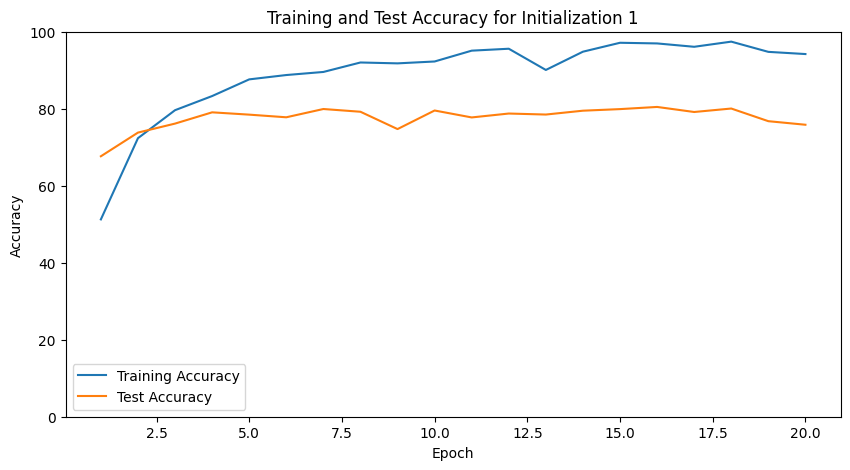

Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.5463, Accuracy: 0.78%, Test Accuracy: 87.67%, Duration: 6.59s
Epoch 2/20, Loss: 0.3201, Accuracy: 0.93%, Test Accuracy: 89.65%, Duration: 6.59s
Epoch 3/20, Loss: 0.1611, Accuracy: 0.96%, Test Accuracy: 90.03%, Duration: 6.53s
Epoch 4/20, Loss: 0.1871, Accuracy: 0.97%, Test Accuracy: 87.20%, Duration: 7.27s
Epoch 5/20, Loss: 0.1126, Accuracy: 0.96%, Test Accuracy: 88.56%, Duration: 6.90s
Epoch 6/20, Loss: 0.1697, Accuracy: 0.97%, Test Accuracy: 87.01%, Duration: 7.12s
Epoch 7/20, Loss: 0.1263, Accuracy: 0.98%, Test Accuracy: 88.72%, Duration: 6.81s
Epoch 8/20, Loss: 0.1042, Accuracy: 0.98%, Test Accuracy: 87.75%, Duration: 7.28s
Epoch 9/20, Loss: 0.0743, Accuracy: 0.97%, Test Accuracy: 87.92%, Duration: 6.70s
Epoch 10/20, Loss: 0.3524, Accuracy: 0.97%, Test Accuracy: 78.26%, Duration: 6.92s
Epoch 11/20, Loss: 0.0632, Accuracy: 0.97%, Test Accuracy: 87.17%, Duration: 6.99s
Epoch 12/20, Loss: 0.0261, Accuracy: 0.99%, Test Accuracy: 87.74%, Duration: 6.24s
Epoch 13/20, 

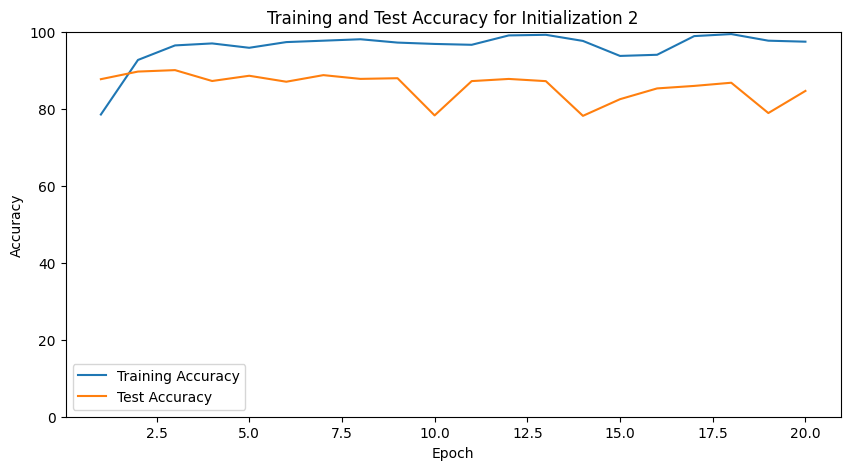

Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.1960, Accuracy: 0.88%, Test Accuracy: 94.74%, Duration: 6.49s
Epoch 2/20, Loss: 0.1557, Accuracy: 0.97%, Test Accuracy: 95.38%, Duration: 6.16s
Epoch 3/20, Loss: 0.0525, Accuracy: 0.99%, Test Accuracy: 95.71%, Duration: 5.84s
Epoch 4/20, Loss: 0.0336, Accuracy: 0.99%, Test Accuracy: 94.38%, Duration: 6.14s
Epoch 5/20, Loss: 0.0342, Accuracy: 0.99%, Test Accuracy: 94.34%, Duration: 6.04s
Epoch 6/20, Loss: 0.0883, Accuracy: 0.99%, Test Accuracy: 94.30%, Duration: 5.93s
Epoch 7/20, Loss: 0.0167, Accuracy: 0.99%, Test Accuracy: 92.89%, Duration: 5.84s
Epoch 8/20, Loss: 0.0974, Accuracy: 0.99%, Test Accuracy: 93.53%, Duration: 5.85s
Epoch 9/20, Loss: 0.0168, Accuracy: 0.99%, Test Accuracy: 93.77%, Duration: 5.76s
Epoch 10/20, Loss: 0.0360, Accuracy: 0.99%, Test Accuracy: 93.41%, Duration: 5.93s
Epoch 11/20, Loss: 0.0761, Accuracy: 0.99%, Test Accuracy: 92.71%, Duration: 5.96s
Epoch 12/20, Loss: 0.0439, Accuracy: 0.99%, Test Accuracy: 92.15%, Duration: 6.14s
Epoch 13/20, 

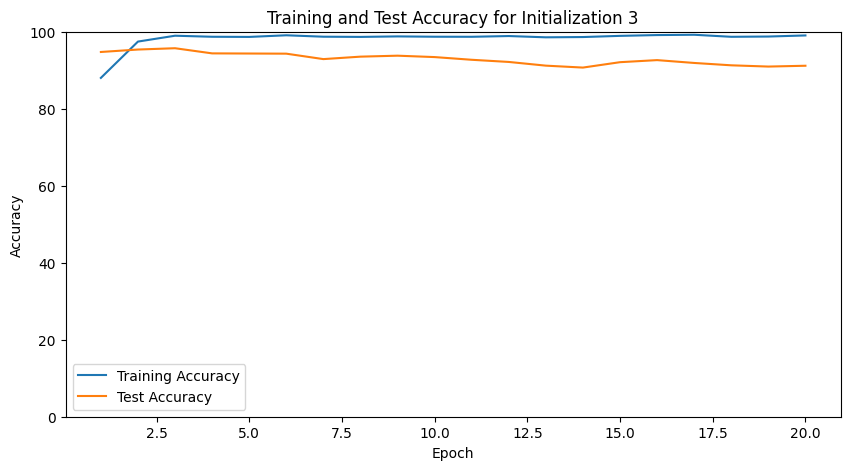

Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.3895, Accuracy: 0.80%, Test Accuracy: 86.22%, Duration: 6.22s
Epoch 2/20, Loss: 0.1328, Accuracy: 0.93%, Test Accuracy: 92.30%, Duration: 6.74s
Epoch 3/20, Loss: 0.0605, Accuracy: 0.97%, Test Accuracy: 91.54%, Duration: 6.08s
Epoch 4/20, Loss: 0.0437, Accuracy: 0.98%, Test Accuracy: 93.09%, Duration: 6.13s
Epoch 5/20, Loss: 0.0137, Accuracy: 0.99%, Test Accuracy: 94.45%, Duration: 5.95s
Epoch 6/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 94.33%, Duration: 5.84s
Epoch 7/20, Loss: 0.0257, Accuracy: 1.00%, Test Accuracy: 94.42%, Duration: 5.78s
Epoch 8/20, Loss: 0.0140, Accuracy: 1.00%, Test Accuracy: 93.46%, Duration: 5.70s
Epoch 9/20, Loss: 0.0185, Accuracy: 0.98%, Test Accuracy: 91.89%, Duration: 5.87s
Epoch 10/20, Loss: 0.0497, Accuracy: 0.98%, Test Accuracy: 92.90%, Duration: 5.69s
Epoch 11/20, Loss: 0.0030, Accuracy: 0.99%, Test Accuracy: 93.40%, Duration: 5.82s
Epoch 12/20, Loss: 0.0387, Accuracy: 0.99%, Test Accuracy: 92.62%, Duration: 5.66s
Epoch 13/20, 

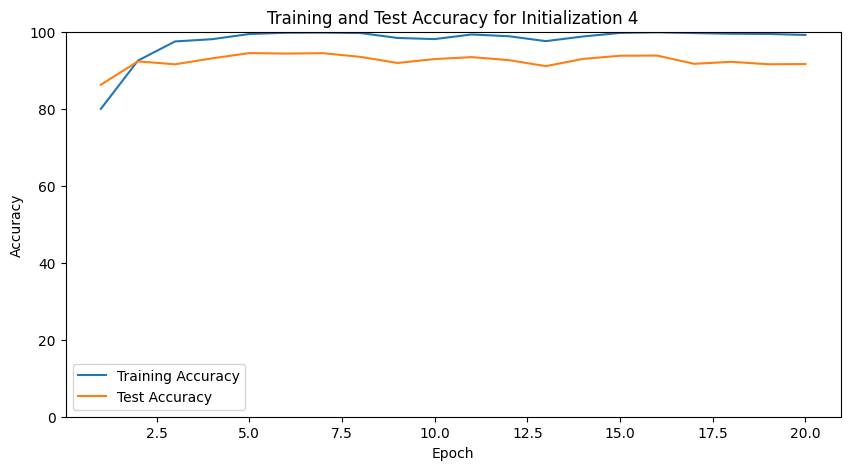

Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.3946, Accuracy: 0.81%, Test Accuracy: 86.04%, Duration: 5.93s
Epoch 2/20, Loss: 0.0807, Accuracy: 0.94%, Test Accuracy: 93.83%, Duration: 6.15s
Epoch 3/20, Loss: 0.0240, Accuracy: 0.99%, Test Accuracy: 94.40%, Duration: 5.82s
Epoch 4/20, Loss: 0.0719, Accuracy: 0.99%, Test Accuracy: 94.83%, Duration: 6.05s
Epoch 5/20, Loss: 0.0782, Accuracy: 1.00%, Test Accuracy: 92.11%, Duration: 5.56s
Epoch 6/20, Loss: 0.0699, Accuracy: 0.97%, Test Accuracy: 94.29%, Duration: 5.66s
Epoch 7/20, Loss: 0.0374, Accuracy: 0.99%, Test Accuracy: 94.38%, Duration: 6.01s
Epoch 8/20, Loss: 0.0675, Accuracy: 0.99%, Test Accuracy: 93.61%, Duration: 6.06s
Epoch 9/20, Loss: 0.0312, Accuracy: 1.00%, Test Accuracy: 94.86%, Duration: 5.85s
Epoch 10/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 95.21%, Duration: 5.68s
Epoch 11/20, Loss: 0.0130, Accuracy: 1.00%, Test Accuracy: 94.49%, Duration: 5.91s
Epoch 12/20, Loss: 0.0057, Accuracy: 1.00%, Test Accuracy: 94.54%, Duration: 5.98s
Epoch 13/20, 

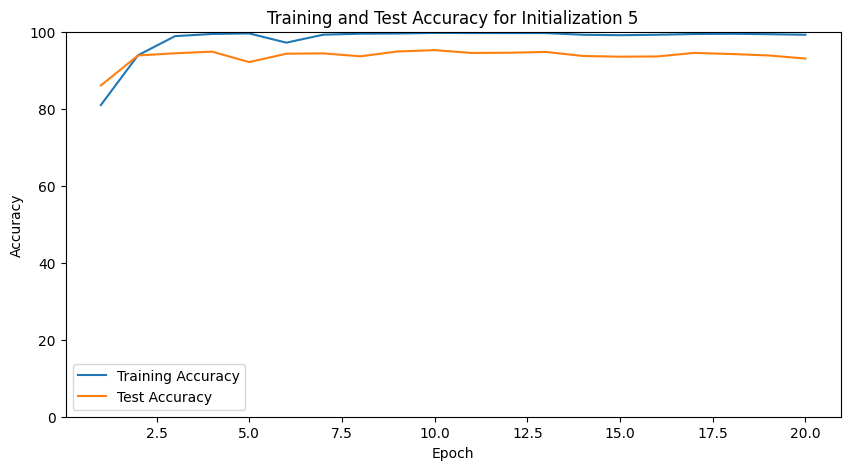

Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.3248, Accuracy: 0.87%, Test Accuracy: 90.28%, Duration: 5.89s
Epoch 2/20, Loss: 0.1233, Accuracy: 0.92%, Test Accuracy: 93.91%, Duration: 5.90s
Epoch 3/20, Loss: 0.0547, Accuracy: 0.98%, Test Accuracy: 94.76%, Duration: 5.76s
Epoch 4/20, Loss: 0.0097, Accuracy: 0.99%, Test Accuracy: 95.51%, Duration: 5.78s
Epoch 5/20, Loss: 0.0091, Accuracy: 0.99%, Test Accuracy: 95.86%, Duration: 5.51s
Epoch 6/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 95.33%, Duration: 5.69s
Epoch 7/20, Loss: 0.0037, Accuracy: 1.00%, Test Accuracy: 95.76%, Duration: 6.18s
Epoch 8/20, Loss: 0.0238, Accuracy: 1.00%, Test Accuracy: 95.74%, Duration: 5.76s
Epoch 9/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 96.20%, Duration: 5.49s
Epoch 10/20, Loss: 0.0155, Accuracy: 1.00%, Test Accuracy: 95.25%, Duration: 5.84s
Epoch 11/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 95.74%, Duration: 5.66s
Epoch 12/20, Loss: 0.0067, Accuracy: 1.00%, Test Accuracy: 95.51%, Duration: 5.77s
Epoch 13/20, 

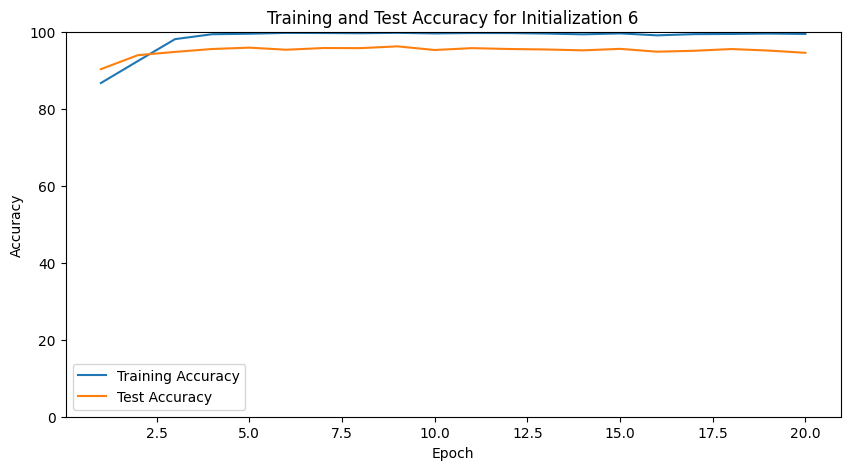

Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.8116, Accuracy: 0.68%, Test Accuracy: 78.56%, Duration: 5.87s
Epoch 2/20, Loss: 0.3298, Accuracy: 0.88%, Test Accuracy: 89.09%, Duration: 5.68s
Epoch 3/20, Loss: 0.3589, Accuracy: 0.96%, Test Accuracy: 92.04%, Duration: 5.69s
Epoch 4/20, Loss: 0.0808, Accuracy: 0.98%, Test Accuracy: 92.30%, Duration: 6.00s
Epoch 5/20, Loss: 0.0097, Accuracy: 0.99%, Test Accuracy: 92.94%, Duration: 5.93s
Epoch 6/20, Loss: 0.0081, Accuracy: 1.00%, Test Accuracy: 92.85%, Duration: 5.73s
Epoch 7/20, Loss: 0.0061, Accuracy: 0.99%, Test Accuracy: 93.01%, Duration: 5.68s
Epoch 8/20, Loss: 0.0059, Accuracy: 1.00%, Test Accuracy: 92.94%, Duration: 5.70s
Epoch 9/20, Loss: 0.0208, Accuracy: 0.99%, Test Accuracy: 92.64%, Duration: 5.62s
Epoch 10/20, Loss: 0.0056, Accuracy: 0.99%, Test Accuracy: 94.59%, Duration: 5.77s
Epoch 11/20, Loss: 0.0122, Accuracy: 1.00%, Test Accuracy: 94.60%, Duration: 5.52s
Epoch 12/20, Loss: 0.0022, Accuracy: 1.00%, Test Accuracy: 94.55%, Duration: 5.67s
Epoch 13/20, 

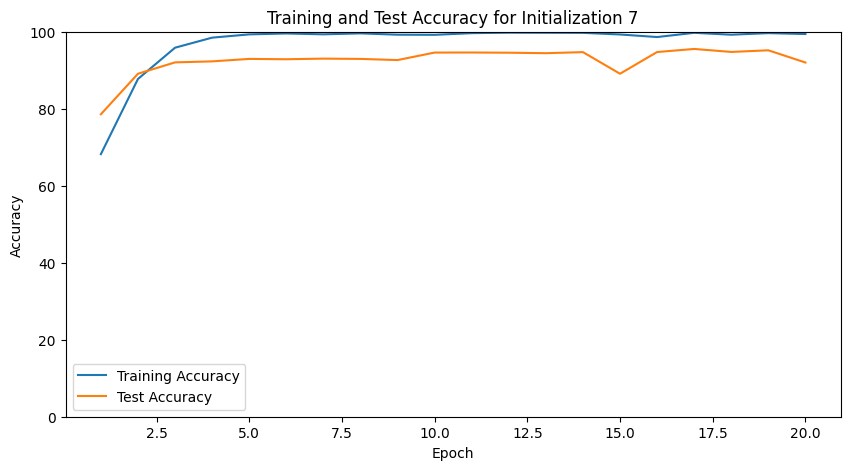

Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0698, Accuracy: 0.92%, Test Accuracy: 98.04%, Duration: 5.95s
Epoch 2/20, Loss: 0.0965, Accuracy: 0.99%, Test Accuracy: 98.62%, Duration: 6.15s
Epoch 3/20, Loss: 0.0035, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 6.06s
Epoch 4/20, Loss: 0.0038, Accuracy: 1.00%, Test Accuracy: 98.61%, Duration: 5.66s
Epoch 5/20, Loss: 0.0050, Accuracy: 1.00%, Test Accuracy: 98.62%, Duration: 5.98s
Epoch 6/20, Loss: 0.0675, Accuracy: 0.97%, Test Accuracy: 95.88%, Duration: 5.97s
Epoch 7/20, Loss: 0.0238, Accuracy: 0.99%, Test Accuracy: 97.55%, Duration: 5.73s
Epoch 8/20, Loss: 0.0049, Accuracy: 1.00%, Test Accuracy: 97.96%, Duration: 6.41s
Epoch 9/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 97.01%, Duration: 6.35s
Epoch 10/20, Loss: 0.1166, Accuracy: 0.99%, Test Accuracy: 95.49%, Duration: 5.81s
Epoch 11/20, Loss: 0.1065, Accuracy: 0.99%, Test Accuracy: 91.79%, Duration: 6.23s
Epoch 12/20, Loss: 0.0011, Accuracy: 0.99%, Test Accuracy: 97.15%, Duration: 6.59s
Epoch 13/20, 

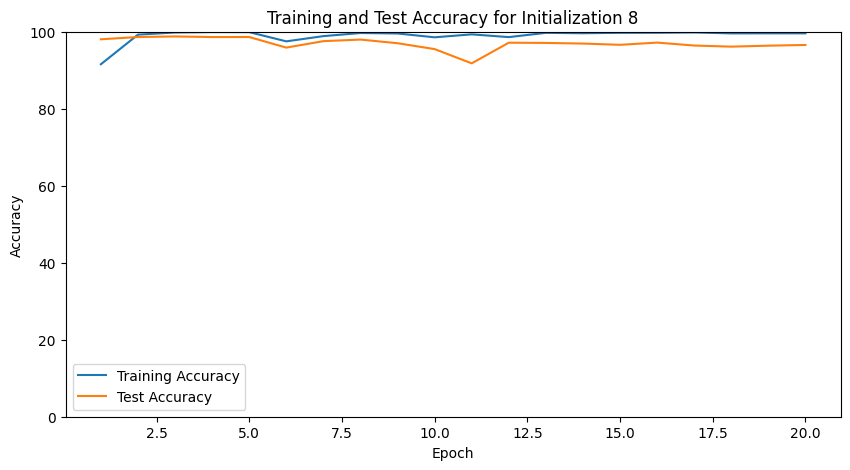

Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0796, Accuracy: 0.85%, Test Accuracy: 94.95%, Duration: 6.08s
Epoch 2/20, Loss: 0.0703, Accuracy: 0.98%, Test Accuracy: 96.04%, Duration: 6.17s
Epoch 3/20, Loss: 0.0041, Accuracy: 0.99%, Test Accuracy: 97.31%, Duration: 6.58s
Epoch 4/20, Loss: 0.0030, Accuracy: 1.00%, Test Accuracy: 97.78%, Duration: 6.44s
Epoch 5/20, Loss: 0.0035, Accuracy: 1.00%, Test Accuracy: 97.71%, Duration: 6.44s
Epoch 6/20, Loss: 0.0173, Accuracy: 1.00%, Test Accuracy: 97.65%, Duration: 6.25s
Epoch 7/20, Loss: 0.0195, Accuracy: 0.99%, Test Accuracy: 95.88%, Duration: 6.34s
Epoch 8/20, Loss: 0.0139, Accuracy: 0.99%, Test Accuracy: 97.08%, Duration: 6.89s
Epoch 9/20, Loss: 0.0050, Accuracy: 1.00%, Test Accuracy: 96.88%, Duration: 6.49s
Epoch 10/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 97.59%, Duration: 6.34s
Epoch 11/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 97.69%, Duration: 6.29s
Epoch 12/20, Loss: 0.0038, Accuracy: 1.00%, Test Accuracy: 96.99%, Duration: 6.75s
Epoch 13/20, 

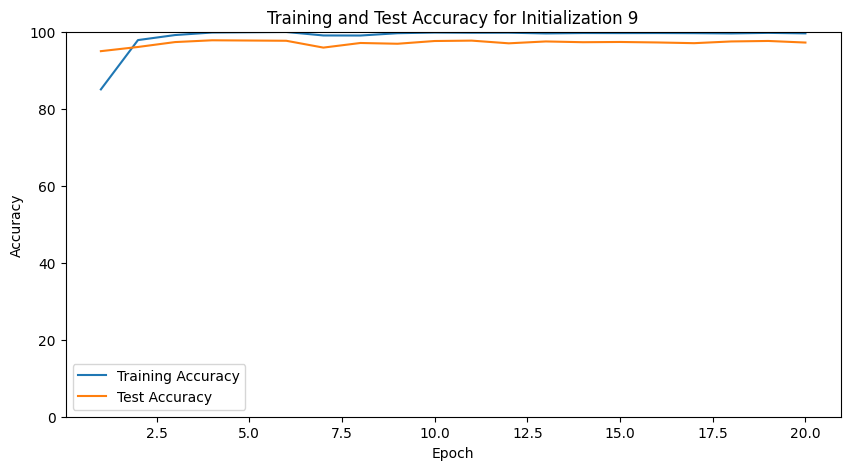

Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.1682, Accuracy: 0.87%, Test Accuracy: 95.58%, Duration: 6.14s
Epoch 2/20, Loss: 0.0517, Accuracy: 0.98%, Test Accuracy: 97.24%, Duration: 5.91s
Epoch 3/20, Loss: 0.0105, Accuracy: 1.00%, Test Accuracy: 97.64%, Duration: 6.09s
Epoch 4/20, Loss: 0.0184, Accuracy: 1.00%, Test Accuracy: 97.32%, Duration: 6.02s
Epoch 5/20, Loss: 0.0026, Accuracy: 1.00%, Test Accuracy: 97.80%, Duration: 5.73s
Epoch 6/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 97.75%, Duration: 6.07s
Epoch 7/20, Loss: 0.0030, Accuracy: 1.00%, Test Accuracy: 97.45%, Duration: 5.87s
Epoch 8/20, Loss: 0.0790, Accuracy: 0.99%, Test Accuracy: 90.97%, Duration: 5.86s
Epoch 9/20, Loss: 0.0194, Accuracy: 0.98%, Test Accuracy: 97.25%, Duration: 6.02s
Epoch 10/20, Loss: 0.0183, Accuracy: 1.00%, Test Accuracy: 97.74%, Duration: 5.92s
Epoch 11/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 98.00%, Duration: 5.99s
Epoch 12/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 97.69%, Duration: 5.85s
Epoch 13/20, 

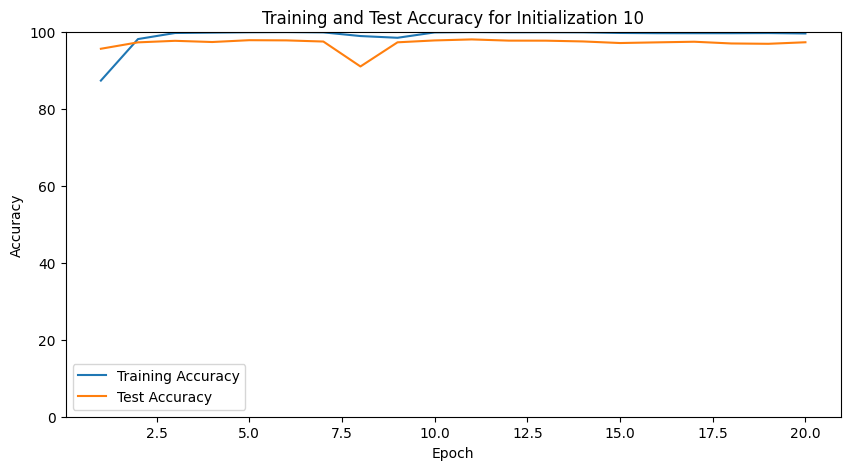

In [7]:
# Step 2: Define ResNet18 Model
model = resnet18(weights=ResNet18_Weights.DEFAULT)

# Replace the final layer to match CIFAR-10 classes (10 classes)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 10)
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Helper function to initialize weights
def reset_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
            
# Step 3: Train and Evaluate the Model
num_epochs = 20
num_initializations = 10
n_elements_per_class = 4000

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())

# Training and evaluation process
train_accuracies = []
test_accuracies = []
all_train_accuracies = []
all_test_accuracies = []
for init in range(num_initializations):
    print(f"Initialization {init + 1}/{num_initializations}")
    model.fc.apply(reset_weights)

    train_loader, test_loader = load_cifar10_balanced_or_imbalanced(
        batch_size=128,
        n_elements_per_class=n_elements_per_class,
        train_ratio=0.8  # 80% of data for training
    )
    
    # Train and evaluate the model
    train_accuracies, test_accuracies = train_model(model, train_loader, test_loader, criterion, optimizer, num_epochs, device=device)
    all_train_accuracies.append(train_accuracies)
    all_test_accuracies.append(test_accuracies)
    
    # Save the model
    torch.save(model.state_dict(), f'./saved_models/resnet18_model_init_{init}.pt')

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, num_epochs + 1), test_accuracies, label='Test Accuracy')  # Make sure this matches the test_accuracies list
    plt.title(f'Training and Test Accuracy for Initialization {init + 1}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim([0, 100])  # Set y-axis limits to match the accuracy range; adjust if needed
    plt.legend()
    plt.show()

    # Free up memory
    torch.cuda.empty_cache()

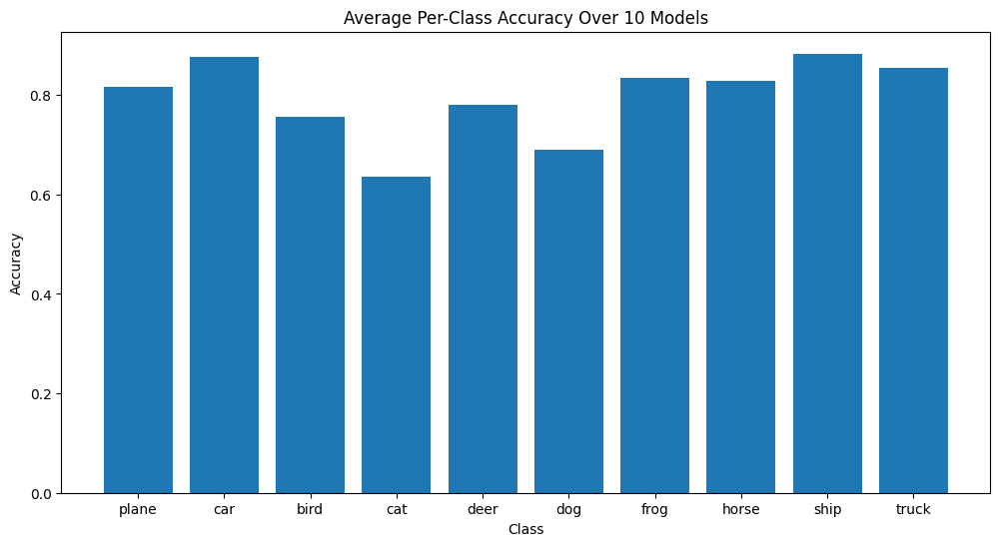

In [34]:
# Compute average per-class accuracies over all initializations
average_per_class_accuracies = np.zeros(10)
for init in range(num_initializations):
    model.load_state_dict(torch.load(f'./saved_models/resnet18_model_init_{init}.pt'))
    model.to(device)
    _, per_class_accuracies = evaluate_model(model, test_loader, device)
    average_per_class_accuracies += per_class_accuracies

average_per_class_accuracies /= num_initializations

# Plot the per-class accuracies
plt.figure(figsize=(12, 6))
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
plt.bar(classes, average_per_class_accuracies)
plt.title('Average Per-Class Accuracy Over 10 Models')
plt.xlabel('Class')
plt.ylabel('Accuracy')
plt.show()

Files already downloaded and verified
Class 0, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.94%, Test Accuracy: 99.72%, Duration: 6.88s
Epoch 2/20, Loss: 0.0069, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.30s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.36s
Epoch 4/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.54s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.37s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 5.96s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.25s
Epoch 8/20, Loss: 0.0407, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.27s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 5.77s
Epoch 10/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 5.87s
Epoch 11/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.13s
Epoch 12/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.03s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0218, Accuracy: 0.95%, Test Accuracy: 99.40%, Duration: 5.74s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 5.79s
Epoch 3/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 5.63s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.02s
Epoch 5/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.04s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 5.95s
Epoch 7/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 5.80s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.38s
Epoch 9/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.81s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.42s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.56s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.36s
Epoch 13/20, 

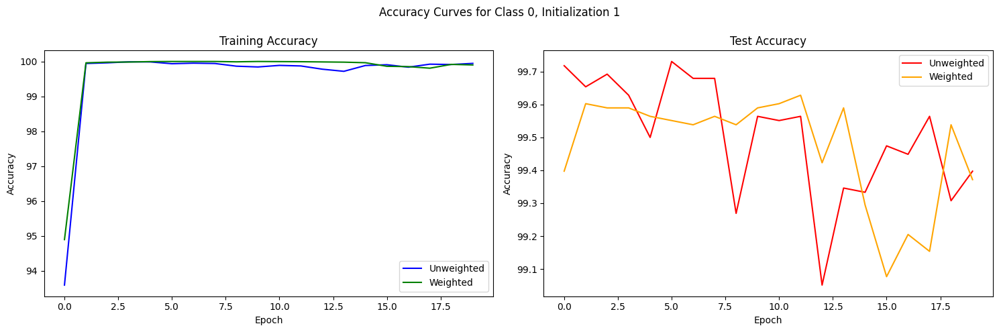

Class 0, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.95%, Test Accuracy: 99.35%, Duration: 6.84s
Epoch 2/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.01s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.58s
Epoch 4/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.11s
Epoch 5/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.79s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.38s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.98s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.91s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.36s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.51s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.13s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.98s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.95%, Test Accuracy: 99.47%, Duration: 6.05s
Epoch 2/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.07s
Epoch 3/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.37s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.23s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.50s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.18s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.23s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.52s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 5.93s
Epoch 10/20, Loss: 0.0156, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 6.07s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.85s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.33s
Epoch 13/20, 

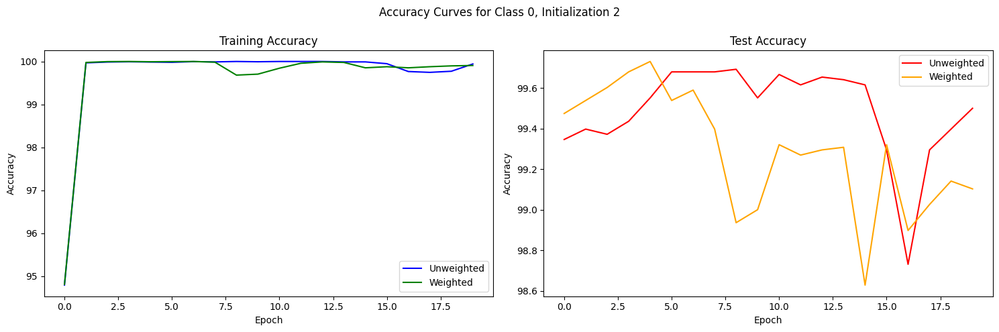

Class 0, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.95%, Test Accuracy: 99.31%, Duration: 6.11s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.16s
Epoch 3/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.33s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.22s
Epoch 5/20, Loss: 0.0026, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.82s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.38s
Epoch 7/20, Loss: 0.0093, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 6.78s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.40s
Epoch 9/20, Loss: 0.0043, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.62s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 6.83s
Epoch 11/20, Loss: 0.0029, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 5.86s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 6.51s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0019, Accuracy: 0.95%, Test Accuracy: 98.99%, Duration: 6.00s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.35s
Epoch 3/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.27s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 6.33s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 5.81s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 6.42s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.69s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.62s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.38s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.48s
Epoch 11/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.69%, Duration: 6.63s
Epoch 12/20, Loss: 0.0254, Accuracy: 0.99%, Test Accuracy: 98.19%, Duration: 7.76s
Epoch 13/20, 

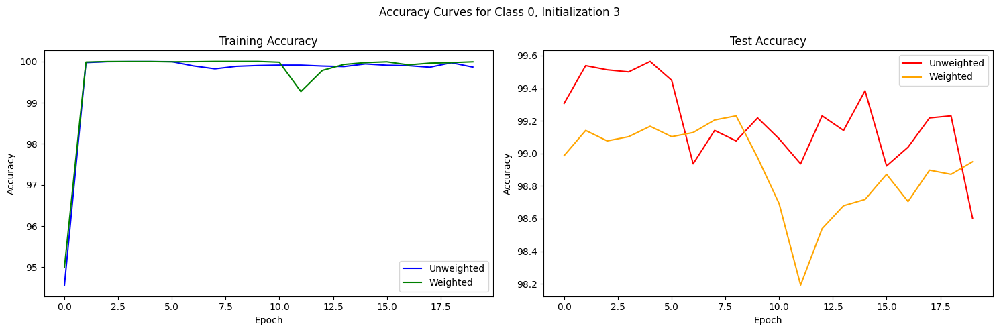

Class 0, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0061, Accuracy: 0.94%, Test Accuracy: 98.63%, Duration: 6.11s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.83%, Duration: 6.74s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.35s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 6.02s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.70s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 6.28s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.92%, Duration: 6.08s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 6.16s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 6.13s
Epoch 10/20, Loss: 0.0028, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.61s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.74%, Duration: 6.41s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.64%, Duration: 6.19s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.97%, Test Accuracy: 99.05%, Duration: 6.63s
Epoch 2/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.87s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 5.81s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.68s
Epoch 5/20, Loss: 0.0041, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.77s
Epoch 6/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.67s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.56s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.89s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.39s
Epoch 10/20, Loss: 0.0102, Accuracy: 1.00%, Test Accuracy: 97.94%, Duration: 6.42s
Epoch 11/20, Loss: 0.0076, Accuracy: 1.00%, Test Accuracy: 98.51%, Duration: 6.40s
Epoch 12/20, Loss: 0.0125, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 8.03s
Epoch 13/20, 

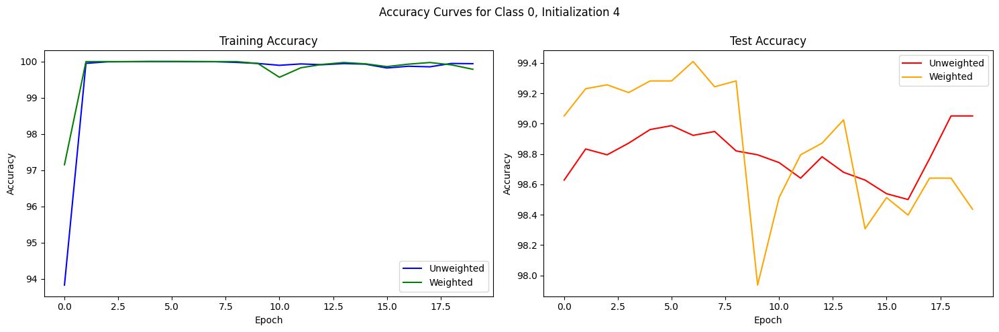

Class 0, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0171, Accuracy: 0.92%, Test Accuracy: 98.65%, Duration: 6.89s
Epoch 2/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 7.26s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 7.28s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 7.02s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 6.96s
Epoch 6/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 6.57s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 6.45s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 7.23s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 7.22s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 7.36s
Epoch 11/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 7.63s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.60%, Duration: 7.16s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0128, Accuracy: 0.95%, Test Accuracy: 98.38%, Duration: 6.83s
Epoch 2/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 7.07s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 6.64s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 7.19s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 7.13s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.88%, Duration: 7.06s
Epoch 7/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 7.11s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.81%, Duration: 6.47s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 6.63s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 7.62s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 6.87s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.68s
Epoch 13/20, 

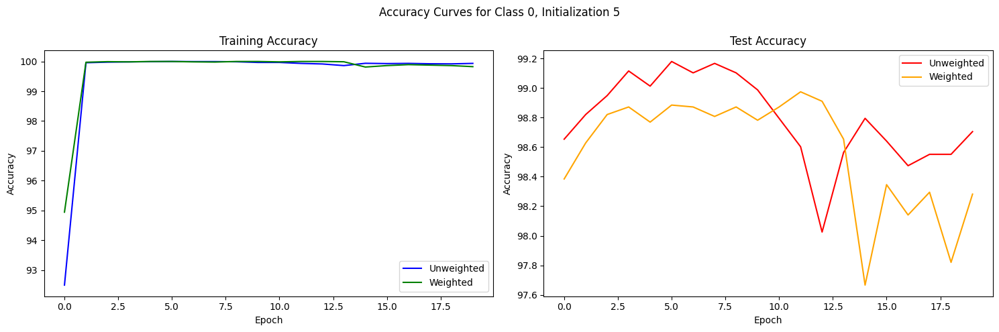

Class 0, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0382, Accuracy: 0.95%, Test Accuracy: 98.31%, Duration: 7.36s
Epoch 2/20, Loss: 0.0032, Accuracy: 1.00%, Test Accuracy: 97.88%, Duration: 7.27s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.42%, Duration: 7.34s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 7.22s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 6.99s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.72%, Duration: 7.26s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.55%, Duration: 7.50s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.72%, Duration: 6.95s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.98s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.74%, Duration: 7.22s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.81%, Duration: 6.01s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.86s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.94%, Test Accuracy: 98.13%, Duration: 6.64s
Epoch 2/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 98.28%, Duration: 6.89s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.44%, Duration: 6.65s
Epoch 4/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 98.58%, Duration: 6.85s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.55%, Duration: 6.28s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.46%, Duration: 6.67s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.64%, Duration: 6.63s
Epoch 8/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.46%, Duration: 7.70s
Epoch 9/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 97.63%, Duration: 7.32s
Epoch 10/20, Loss: 0.0139, Accuracy: 1.00%, Test Accuracy: 97.65%, Duration: 7.37s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.00%, Duration: 7.96s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.76%, Duration: 6.90s
Epoch 13/20, 

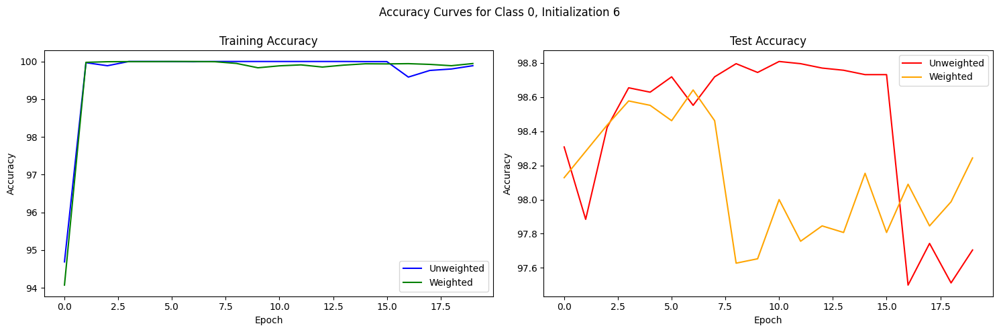

Class 0, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0024, Accuracy: 0.96%, Test Accuracy: 98.06%, Duration: 7.00s
Epoch 2/20, Loss: 0.0032, Accuracy: 1.00%, Test Accuracy: 98.33%, Duration: 6.74s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.42%, Duration: 6.88s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.17%, Duration: 7.10s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.46%, Duration: 7.01s
Epoch 6/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 6.72s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.67%, Duration: 6.64s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.56%, Duration: 6.41s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 6.64s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.58%, Duration: 6.22s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.69%, Duration: 6.80s
Epoch 12/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 97.24%, Duration: 6.58s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0027, Accuracy: 0.94%, Test Accuracy: 97.60%, Duration: 7.14s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 97.91%, Duration: 7.32s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 97.90%, Duration: 7.12s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 7.17s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.08%, Duration: 6.99s
Epoch 6/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.12%, Duration: 7.81s
Epoch 7/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.14%, Duration: 7.58s
Epoch 8/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 98.17%, Duration: 7.31s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.92%, Duration: 7.33s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.05%, Duration: 7.72s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.01%, Duration: 7.41s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.06%, Duration: 7.65s
Epoch 13/20, 

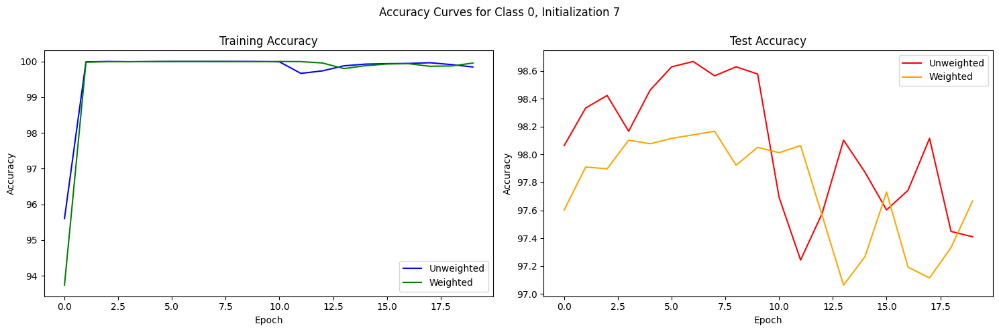

Class 0, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0024, Accuracy: 0.95%, Test Accuracy: 97.78%, Duration: 7.31s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.86%, Duration: 7.46s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.15%, Duration: 7.42s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.13%, Duration: 7.35s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.18%, Duration: 7.15s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.94%, Duration: 6.71s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.14%, Duration: 6.41s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.95%, Duration: 6.81s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.86%, Duration: 6.35s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.24%, Duration: 6.78s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.45%, Duration: 6.79s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 96.33%, Duration: 6.78s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.96%, Test Accuracy: 97.50%, Duration: 6.81s
Epoch 2/20, Loss: 0.0026, Accuracy: 1.00%, Test Accuracy: 97.69%, Duration: 6.39s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.76%, Duration: 7.80s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.85%, Duration: 7.01s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.94%, Duration: 7.37s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.87%, Duration: 7.04s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.90%, Duration: 6.66s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.96%, Duration: 7.43s
Epoch 9/20, Loss: 0.0049, Accuracy: 1.00%, Test Accuracy: 96.49%, Duration: 7.47s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 97.36%, Duration: 7.72s
Epoch 11/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 96.81%, Duration: 7.74s
Epoch 12/20, Loss: 0.0179, Accuracy: 1.00%, Test Accuracy: 97.36%, Duration: 7.87s
Epoch 13/20, 

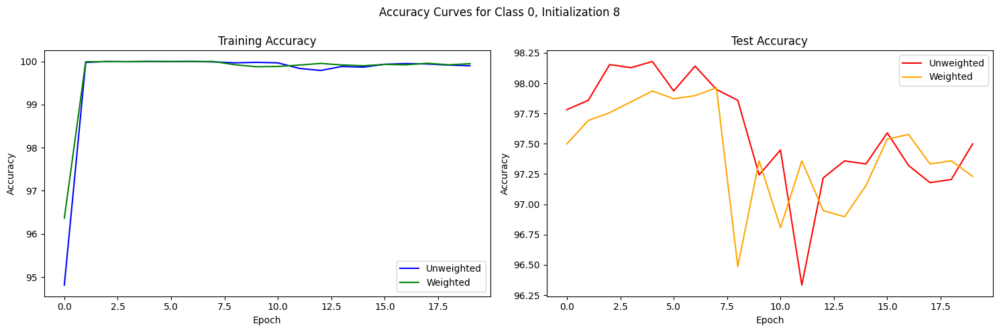

Class 0, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0065, Accuracy: 0.96%, Test Accuracy: 97.29%, Duration: 6.93s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 97.36%, Duration: 6.65s
Epoch 3/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 97.60%, Duration: 6.69s
Epoch 4/20, Loss: 0.0021, Accuracy: 1.00%, Test Accuracy: 96.85%, Duration: 6.39s
Epoch 5/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 97.27%, Duration: 6.45s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.24%, Duration: 6.50s
Epoch 7/20, Loss: 0.0049, Accuracy: 1.00%, Test Accuracy: 97.31%, Duration: 6.74s
Epoch 8/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 97.38%, Duration: 7.31s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.60%, Duration: 6.53s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.46%, Duration: 6.96s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.53%, Duration: 7.18s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.35%, Duration: 6.64s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0019, Accuracy: 0.95%, Test Accuracy: 97.05%, Duration: 7.32s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 97.38%, Duration: 7.16s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 97.46%, Duration: 7.21s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 97.56%, Duration: 6.94s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.54%, Duration: 6.97s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 97.47%, Duration: 7.23s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.47%, Duration: 7.09s
Epoch 8/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 97.64%, Duration: 7.04s
Epoch 9/20, Loss: 0.0537, Accuracy: 1.00%, Test Accuracy: 97.45%, Duration: 7.11s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.63%, Duration: 6.58s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.67%, Duration: 7.05s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.72%, Duration: 6.96s
Epoch 13/20, 

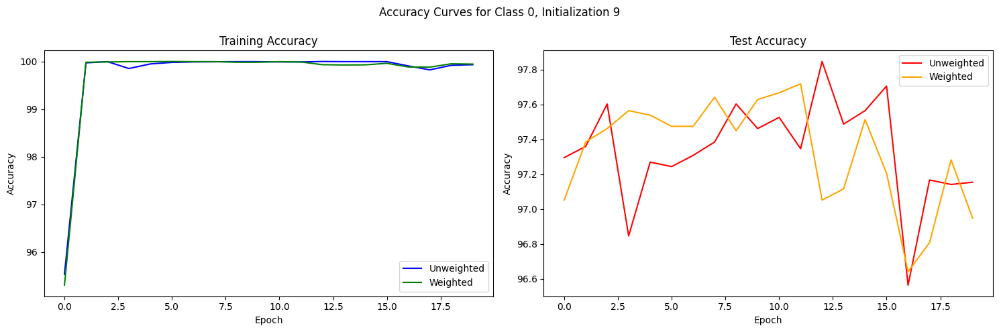

Class 0, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0003, Accuracy: 0.95%, Test Accuracy: 97.33%, Duration: 6.52s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.55%, Duration: 6.22s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.62%, Duration: 6.24s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.56%, Duration: 6.15s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.73%, Duration: 6.24s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.70%, Duration: 6.24s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.76%, Duration: 6.15s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.81%, Duration: 6.05s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.50%, Duration: 6.02s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.20%, Duration: 5.93s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 96.94%, Duration: 6.36s
Epoch 12/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 96.03%, Duration: 6.00s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.91%, Test Accuracy: 96.87%, Duration: 6.70s
Epoch 2/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 97.28%, Duration: 6.53s
Epoch 3/20, Loss: 0.0029, Accuracy: 1.00%, Test Accuracy: 97.44%, Duration: 6.51s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 97.50%, Duration: 6.59s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.64%, Duration: 6.90s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.59%, Duration: 6.56s
Epoch 7/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 97.76%, Duration: 6.85s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.72%, Duration: 6.52s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.73%, Duration: 6.31s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.76%, Duration: 6.46s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.73%, Duration: 6.54s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 97.63%, Duration: 6.61s
Epoch 13/20, 

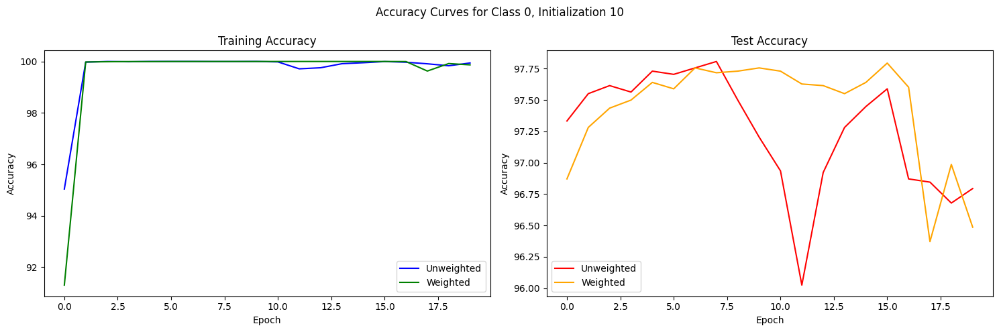

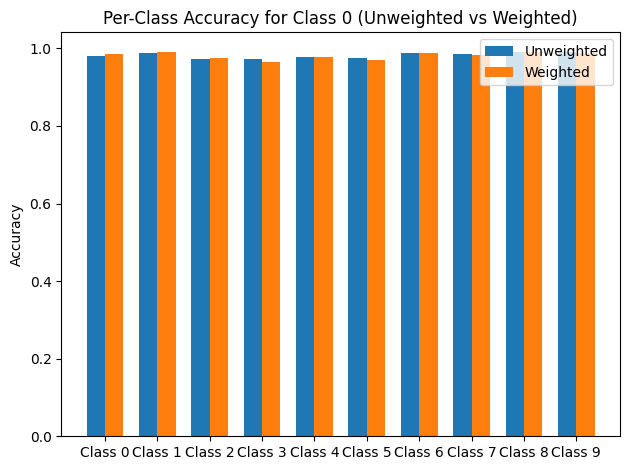

Files already downloaded and verified
Class 1, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0128, Accuracy: 0.94%, Test Accuracy: 99.49%, Duration: 6.43s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.60s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.21s
Epoch 4/20, Loss: 0.0095, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.26s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.18s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.17s
Epoch 7/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.57s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.54s
Epoch 9/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.37s
Epoch 10/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.36s
Epoch 11/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 5.93s
Epoch 12/20, Loss: 0.0326, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.02s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0023, Accuracy: 0.95%, Test Accuracy: 99.19%, Duration: 7.42s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 6.81s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.04s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.14s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.95s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 6.87s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 6.95s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 7.34s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.84s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.87s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.87s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.42s
Epoch 13/20, 

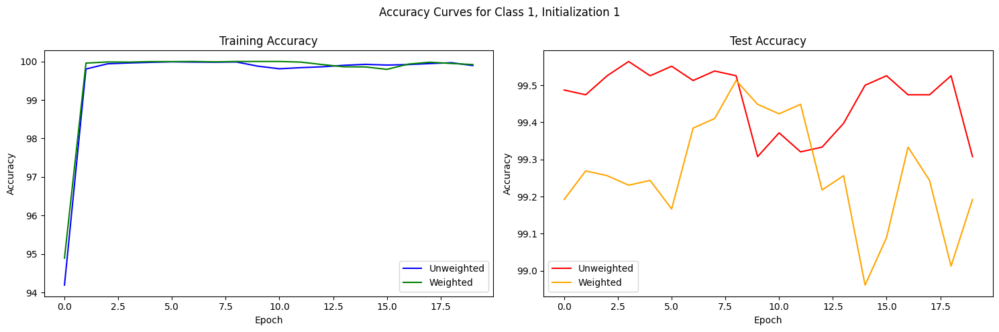

Class 1, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0025, Accuracy: 0.94%, Test Accuracy: 99.42%, Duration: 6.84s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.56s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.59s
Epoch 4/20, Loss: 0.0023, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.38s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.10s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.91s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.23s
Epoch 8/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 6.86s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.79s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.72s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.35s
Epoch 12/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 6.84s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0025, Accuracy: 0.93%, Test Accuracy: 99.06%, Duration: 6.95s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 6.73s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 7.02s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 7.44s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 7.62s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.29s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.73s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 7.00s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.24s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.55s
Epoch 11/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.92s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.77s
Epoch 13/20, 

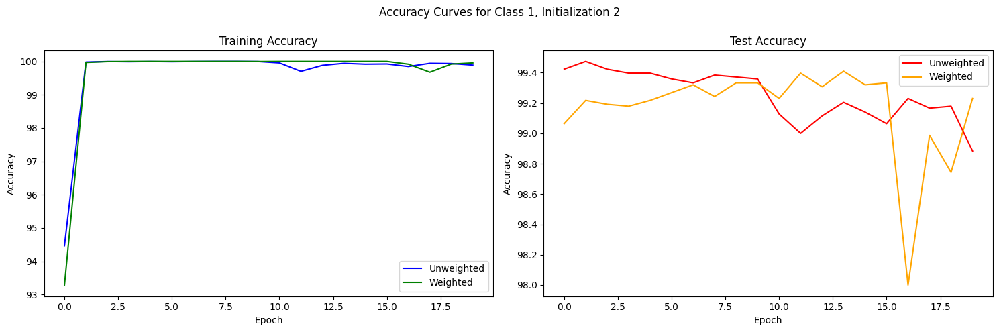

Class 1, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0092, Accuracy: 0.94%, Test Accuracy: 98.95%, Duration: 7.39s
Epoch 2/20, Loss: 0.0022, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.03s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.51s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.51s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.89s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.92s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.92%, Duration: 6.94s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.62%, Duration: 6.84s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 6.97s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 7.23s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.85%, Duration: 6.48s
Epoch 12/20, Loss: 0.0340, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.63s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0022, Accuracy: 0.96%, Test Accuracy: 99.24%, Duration: 7.34s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.17s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 6.77s
Epoch 4/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.69s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.85s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.73s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.70s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.67s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 7.04s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.73s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.47s
Epoch 12/20, Loss: 0.0045, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.04s
Epoch 13/20, 

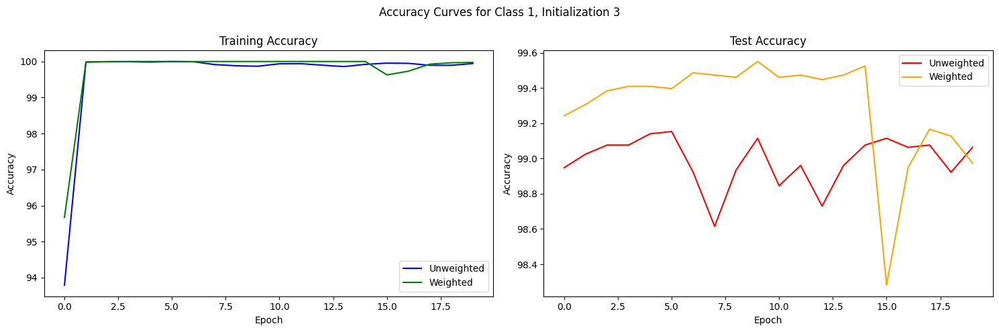

Class 1, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0038, Accuracy: 0.94%, Test Accuracy: 99.05%, Duration: 6.96s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 7.28s
Epoch 3/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 6.75s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.07s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.65s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.91s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.52s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.56s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.30s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 6.53s
Epoch 11/20, Loss: 0.0206, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 6.73s
Epoch 12/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.71s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0130, Accuracy: 0.96%, Test Accuracy: 99.14%, Duration: 6.82s
Epoch 2/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.19s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.45s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.86s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 7.08s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.98s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 7.15s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 7.73s
Epoch 9/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 6.64s
Epoch 10/20, Loss: 0.0030, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 7.34s
Epoch 11/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 6.92s
Epoch 12/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 7.36s
Epoch 13/20, 

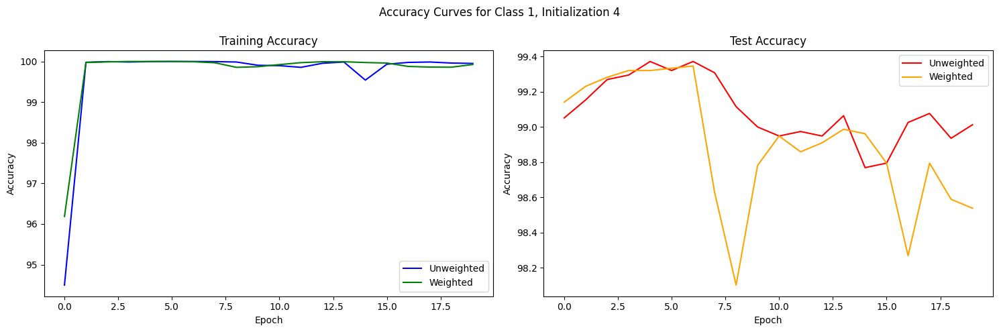

Class 1, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0016, Accuracy: 0.96%, Test Accuracy: 98.63%, Duration: 6.81s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 7.17s
Epoch 3/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 7.64s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.92%, Duration: 7.20s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.83%, Duration: 7.25s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.83%, Duration: 6.58s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 6.97s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.83%, Duration: 6.71s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.70s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 7.09s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 7.22s
Epoch 12/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 8.03s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.95%, Test Accuracy: 98.70%, Duration: 6.95s
Epoch 2/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 7.14s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 7.24s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 7.13s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.87s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 7.75s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 7.79s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.28s
Epoch 9/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.72s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 7.55s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 7.00s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 7.29s
Epoch 13/20, 

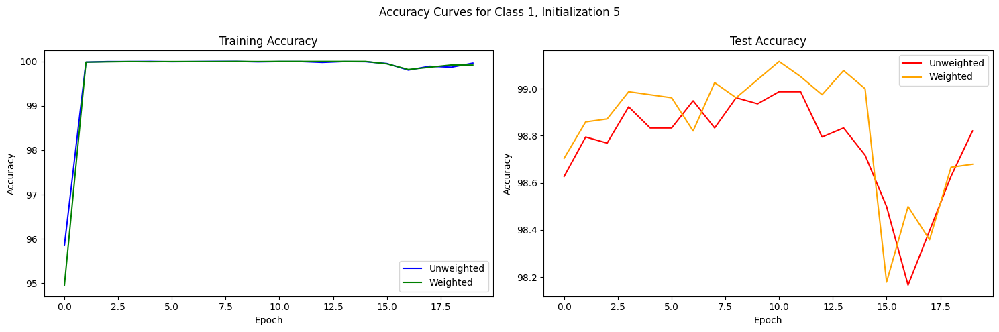

Class 1, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0027, Accuracy: 0.96%, Test Accuracy: 98.58%, Duration: 6.99s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 98.67%, Duration: 6.60s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.88%, Duration: 7.10s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.85%, Duration: 7.21s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.99s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 7.21s
Epoch 7/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.56%, Duration: 6.75s
Epoch 8/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.68%, Duration: 6.58s
Epoch 9/20, Loss: 0.0298, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 8.35s
Epoch 10/20, Loss: 0.0176, Accuracy: 1.00%, Test Accuracy: 98.37%, Duration: 7.62s
Epoch 11/20, Loss: 0.0118, Accuracy: 1.00%, Test Accuracy: 98.12%, Duration: 7.46s
Epoch 12/20, Loss: 0.0022, Accuracy: 1.00%, Test Accuracy: 98.55%, Duration: 7.65s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0018, Accuracy: 0.94%, Test Accuracy: 98.14%, Duration: 6.84s
Epoch 2/20, Loss: 0.0040, Accuracy: 1.00%, Test Accuracy: 98.31%, Duration: 6.99s
Epoch 3/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 98.40%, Duration: 7.29s
Epoch 4/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.44%, Duration: 6.99s
Epoch 5/20, Loss: 0.0326, Accuracy: 1.00%, Test Accuracy: 98.49%, Duration: 6.98s
Epoch 6/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 98.58%, Duration: 6.33s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.51%, Duration: 6.48s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.40%, Duration: 6.26s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.45%, Duration: 6.73s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.56%, Duration: 6.30s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.51%, Duration: 6.56s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.68%, Duration: 6.29s
Epoch 13/20, 

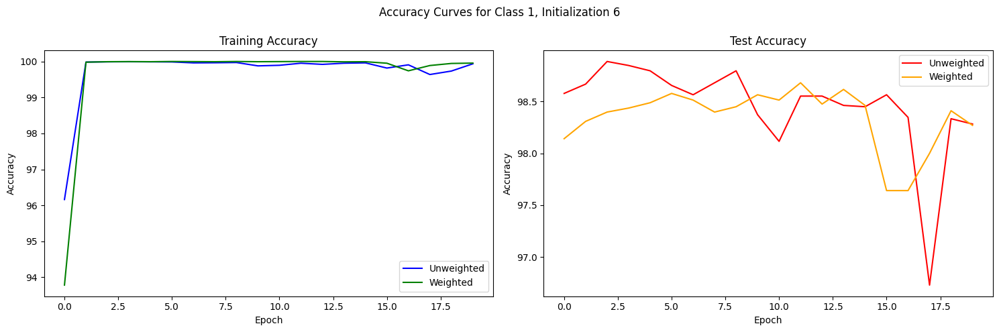

Class 1, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.96%, Test Accuracy: 98.18%, Duration: 6.04s
Epoch 2/20, Loss: 0.0129, Accuracy: 1.00%, Test Accuracy: 98.36%, Duration: 6.28s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.45%, Duration: 6.63s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.68%, Duration: 6.62s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.67%, Duration: 6.38s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.76%, Duration: 6.24s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.73%, Duration: 8.10s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 7.52s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 7.07s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.70%, Duration: 6.69s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 7.07s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 6.70s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0103, Accuracy: 0.93%, Test Accuracy: 97.90%, Duration: 6.72s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.23%, Duration: 6.67s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.37%, Duration: 6.77s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.32%, Duration: 6.54s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.45%, Duration: 6.84s
Epoch 6/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.33%, Duration: 6.70s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.44%, Duration: 6.55s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.55%, Duration: 6.35s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.53%, Duration: 6.36s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.51%, Duration: 6.53s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.50%, Duration: 6.04s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.49%, Duration: 6.51s
Epoch 13/20, 

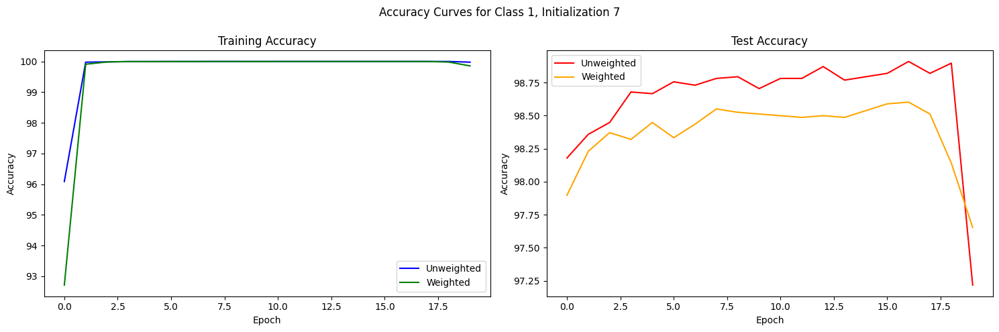

Class 1, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.94%, Test Accuracy: 98.08%, Duration: 6.68s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.40%, Duration: 6.02s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.56%, Duration: 6.46s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.59%, Duration: 6.46s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.72%, Duration: 6.30s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.59%, Duration: 6.22s
Epoch 7/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 98.68%, Duration: 7.03s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.58%, Duration: 6.71s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.62%, Duration: 6.54s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.64%, Duration: 6.82s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.32%, Duration: 6.43s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.20%, Duration: 6.93s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0027, Accuracy: 0.95%, Test Accuracy: 98.15%, Duration: 6.50s
Epoch 2/20, Loss: 0.0044, Accuracy: 1.00%, Test Accuracy: 98.26%, Duration: 7.02s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.44%, Duration: 7.31s
Epoch 4/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.31%, Duration: 6.86s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.44%, Duration: 7.45s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.45%, Duration: 6.73s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.53%, Duration: 7.17s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.50%, Duration: 6.28s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 6.36s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.55%, Duration: 6.37s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.49%, Duration: 6.94s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 6.72s
Epoch 13/20, 

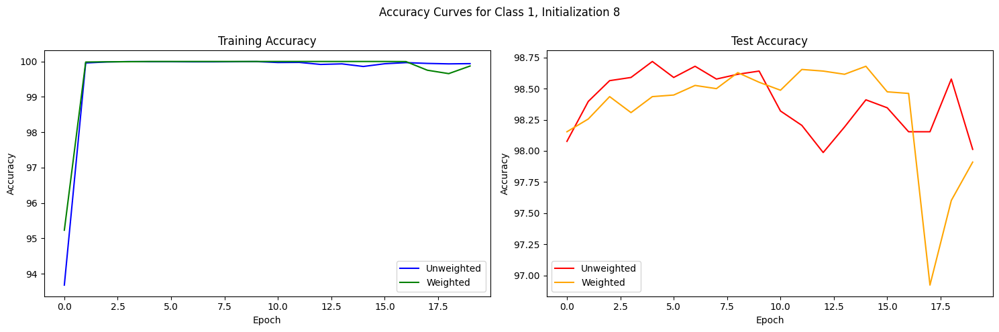

Class 1, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0028, Accuracy: 0.94%, Test Accuracy: 97.56%, Duration: 7.14s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 97.85%, Duration: 6.35s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 97.86%, Duration: 6.83s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 6.81s
Epoch 5/20, Loss: 0.0080, Accuracy: 1.00%, Test Accuracy: 98.09%, Duration: 6.04s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.17%, Duration: 6.68s
Epoch 7/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 6.70s
Epoch 8/20, Loss: 0.0043, Accuracy: 1.00%, Test Accuracy: 98.09%, Duration: 7.06s
Epoch 9/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 97.88%, Duration: 6.75s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 7.14s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 97.94%, Duration: 6.68s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.63%, Duration: 7.05s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.95%, Test Accuracy: 98.18%, Duration: 6.97s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.27%, Duration: 7.17s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.29%, Duration: 6.57s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.28%, Duration: 6.90s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.27%, Duration: 7.27s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.38%, Duration: 6.94s
Epoch 7/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.33%, Duration: 7.01s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.44%, Duration: 6.19s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.45%, Duration: 6.28s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.33%, Duration: 6.68s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.91%, Duration: 6.48s
Epoch 12/20, Loss: 0.0031, Accuracy: 1.00%, Test Accuracy: 98.01%, Duration: 6.82s
Epoch 13/20, 

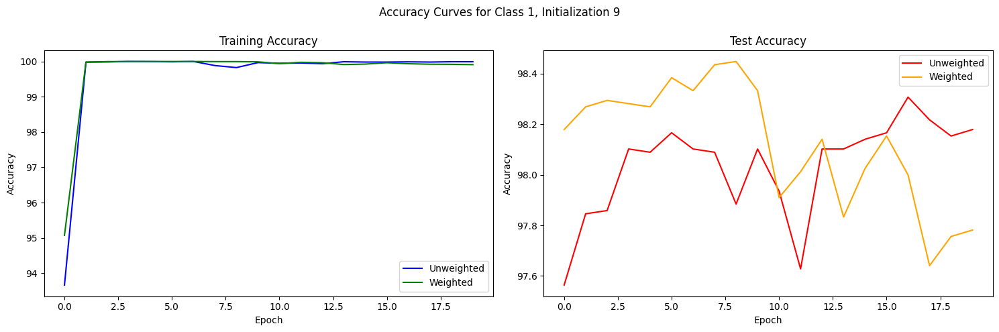

Class 1, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0015, Accuracy: 0.96%, Test Accuracy: 98.36%, Duration: 6.68s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.42%, Duration: 6.75s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.53%, Duration: 7.26s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.36%, Duration: 6.11s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.54%, Duration: 7.93s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.60%, Duration: 7.19s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.49%, Duration: 6.92s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.18%, Duration: 6.67s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.77%, Duration: 6.63s
Epoch 10/20, Loss: 0.0038, Accuracy: 1.00%, Test Accuracy: 96.59%, Duration: 6.56s
Epoch 11/20, Loss: 0.0035, Accuracy: 1.00%, Test Accuracy: 97.76%, Duration: 6.94s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.00%, Duration: 6.59s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0015, Accuracy: 0.96%, Test Accuracy: 97.65%, Duration: 6.57s
Epoch 2/20, Loss: 0.0034, Accuracy: 1.00%, Test Accuracy: 97.90%, Duration: 6.53s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 97.99%, Duration: 6.24s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.00%, Duration: 7.37s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.08%, Duration: 6.59s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.14%, Duration: 6.02s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.13%, Duration: 6.46s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.05%, Duration: 6.66s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.20%, Duration: 6.66s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.18%, Duration: 6.50s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 6.95s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.10%, Duration: 6.38s
Epoch 13/20, 

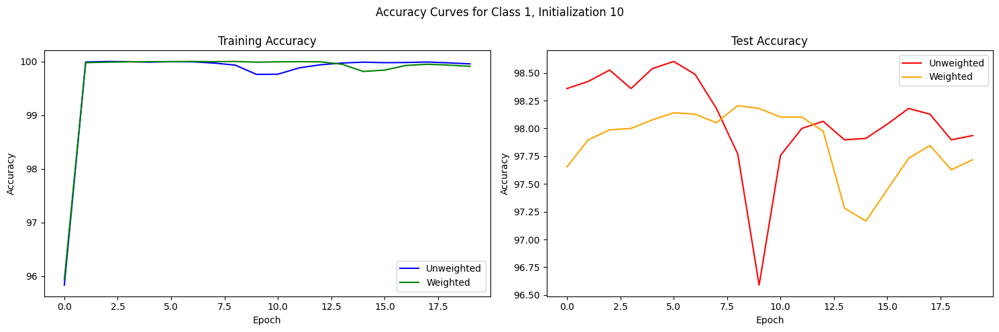

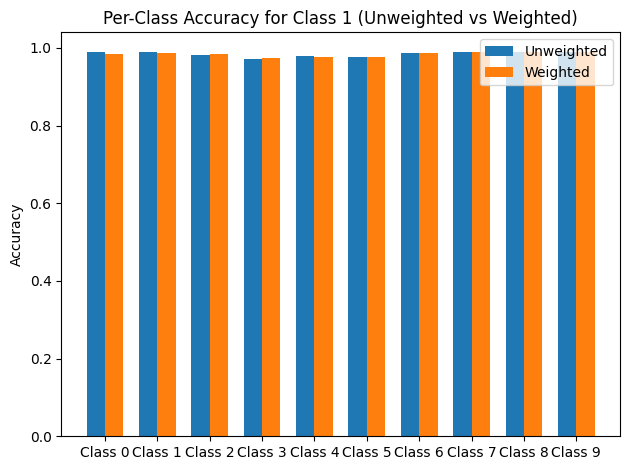

Files already downloaded and verified
Class 2, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.96%, Test Accuracy: 99.68%, Duration: 6.56s
Epoch 2/20, Loss: 0.0024, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.13s
Epoch 3/20, Loss: 0.0057, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.47s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.83s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.86s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.73s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.20s
Epoch 8/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.90s
Epoch 9/20, Loss: 0.0051, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.61s
Epoch 10/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.80s
Epoch 11/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.96s
Epoch 12/20, Loss: 0.0206, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.46s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0058, Accuracy: 0.96%, Test Accuracy: 99.71%, Duration: 6.55s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.21s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.13s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 5.87s
Epoch 5/20, Loss: 0.0024, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 5.78s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 5.86s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.14s
Epoch 8/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.15s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 5.90s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.06s
Epoch 11/20, Loss: 0.0027, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 5.87s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.16s
Epoch 13/20, 

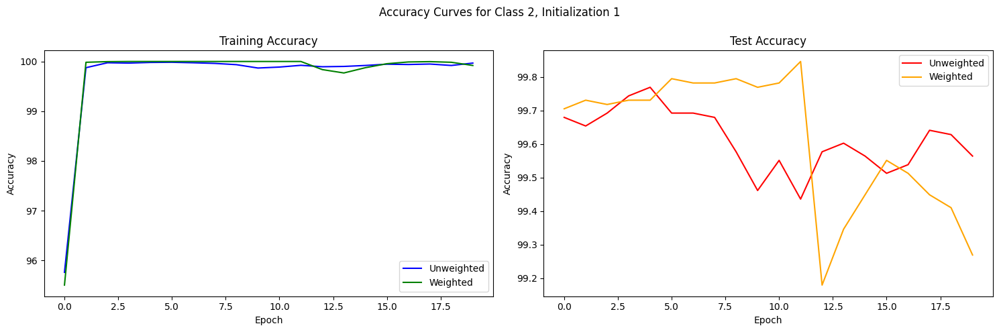

Class 2, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0033, Accuracy: 0.94%, Test Accuracy: 99.45%, Duration: 5.93s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 5.95s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 5.67s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.50s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.14s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.69s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.52s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.68s
Epoch 9/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.56s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.73s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.71s
Epoch 12/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 6.60s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.1885, Accuracy: 0.96%, Test Accuracy: 99.37%, Duration: 6.44s
Epoch 2/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.52s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.41s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.43s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.15s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 5.96s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 5.92s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 5.77s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.24s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.22s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 5.98s
Epoch 12/20, Loss: 0.0040, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 5.90s
Epoch 13/20, 

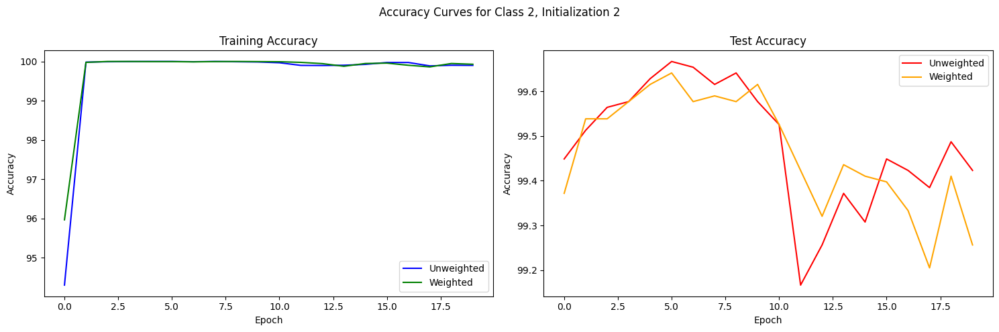

Class 2, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.96%, Test Accuracy: 99.45%, Duration: 5.76s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.06s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 5.80s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 5.93s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 5.85s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.74s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 6.24s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.24s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.31s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.70s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.33s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.43s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0016, Accuracy: 0.96%, Test Accuracy: 99.13%, Duration: 7.03s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.92%, Duration: 7.15s
Epoch 3/20, Loss: 0.0023, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 6.88s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.83s
Epoch 5/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.20s
Epoch 6/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 7.80s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.83s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 6.98s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.83s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.48s
Epoch 11/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.12s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.68s
Epoch 13/20, 

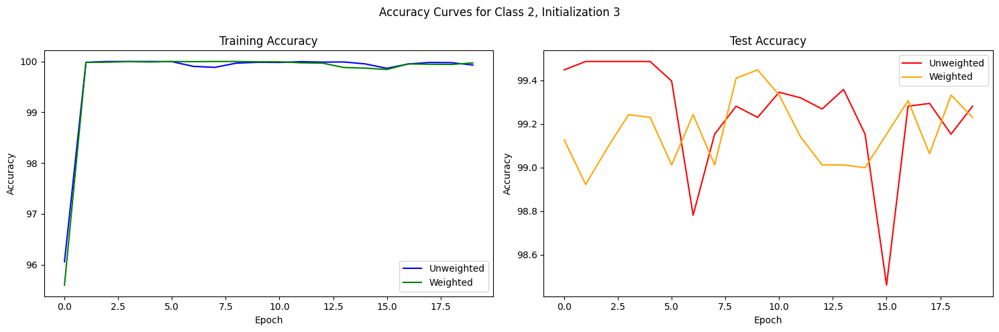

Class 2, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.96%, Test Accuracy: 99.33%, Duration: 6.81s
Epoch 2/20, Loss: 0.0034, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.78s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.95s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 7.55s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.28s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.07s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 6.97s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.13s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.95s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.96s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.92s
Epoch 12/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 7.01s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0020, Accuracy: 0.95%, Test Accuracy: 99.12%, Duration: 7.17s
Epoch 2/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.35s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 7.51s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 7.39s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 7.44s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.01s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.84s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.36s
Epoch 9/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.75s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 6.89s
Epoch 11/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.03s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.11s
Epoch 13/20, 

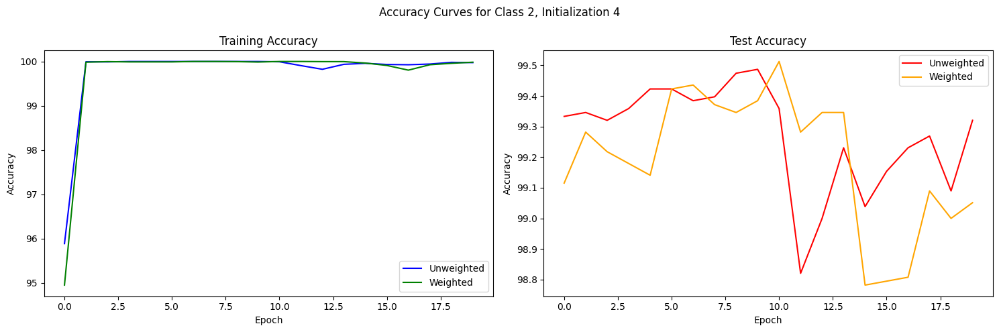

Class 2, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0011, Accuracy: 0.96%, Test Accuracy: 98.87%, Duration: 7.28s
Epoch 2/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 7.12s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 7.37s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 7.20s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 7.24s
Epoch 6/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 8.21s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 7.65s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 7.33s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 7.46s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 7.07s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 7.45s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 7.75s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0023, Accuracy: 0.98%, Test Accuracy: 98.96%, Duration: 7.11s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.22s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.78s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.93s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 6.02s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.35s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.45s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 5.87s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.29s
Epoch 10/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 6.48s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 6.21s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.61s
Epoch 13/20, 

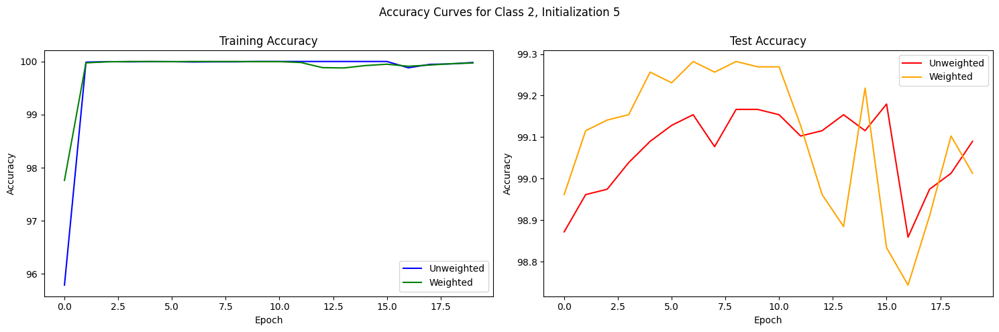

Class 2, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0082, Accuracy: 0.95%, Test Accuracy: 98.91%, Duration: 6.69s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 5.99s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 6.36s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.39s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 6.56s
Epoch 6/20, Loss: 0.0022, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.97s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 7.02s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 6.57s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.85s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 6.23s
Epoch 11/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 6.63s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.79s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.97%, Test Accuracy: 98.88%, Duration: 6.95s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 6.25s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 6.50s
Epoch 4/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.43s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 6.32s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.54s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.73s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 6.62s
Epoch 9/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 6.35s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.61s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.32s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 7.02s
Epoch 13/20, 

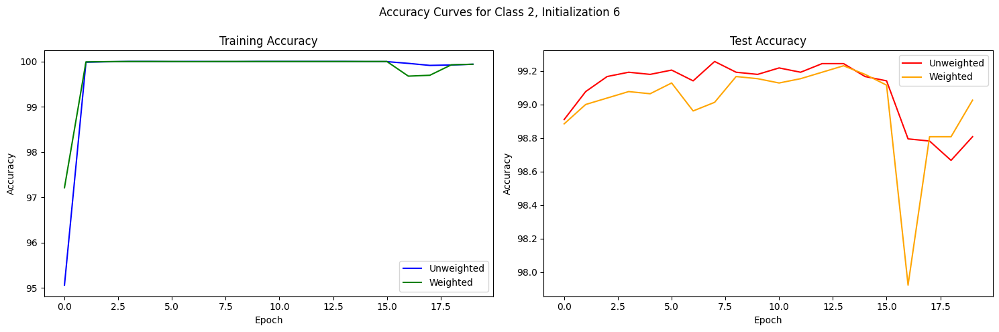

Class 2, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0022, Accuracy: 0.94%, Test Accuracy: 98.72%, Duration: 7.62s
Epoch 2/20, Loss: 0.0021, Accuracy: 1.00%, Test Accuracy: 98.88%, Duration: 7.65s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.53s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 7.18s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 7.54s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.65s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 6.84s
Epoch 8/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.57s
Epoch 9/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 7.74s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 7.69s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 7.46s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 8.02s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0016, Accuracy: 0.95%, Test Accuracy: 98.53%, Duration: 7.19s
Epoch 2/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 7.39s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.72%, Duration: 6.79s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.49s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 7.53s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 6.92s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 7.00s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.91%, Duration: 7.18s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 7.18s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.85%, Duration: 6.98s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.88%, Duration: 6.89s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.91%, Duration: 6.35s
Epoch 13/20, 

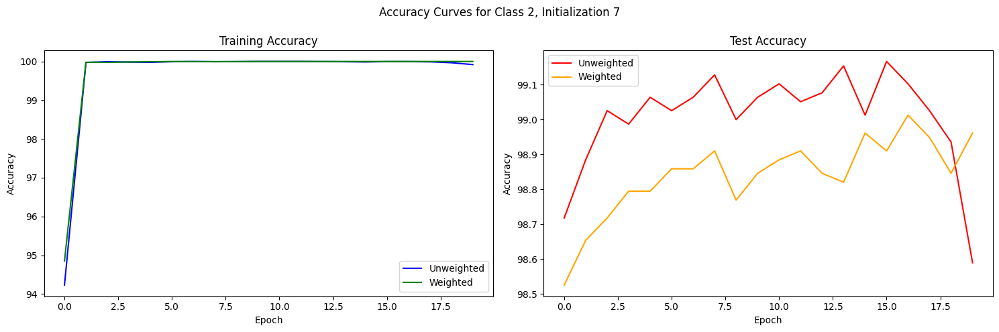

Class 2, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0051, Accuracy: 0.96%, Test Accuracy: 98.78%, Duration: 6.70s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 7.84s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 7.67s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 7.67s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 8.42s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 7.42s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.91%, Duration: 7.65s
Epoch 8/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 7.51s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 7.42s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.51s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.87%, Duration: 7.47s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 7.68s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0072, Accuracy: 0.95%, Test Accuracy: 98.65%, Duration: 7.15s
Epoch 2/20, Loss: 0.0057, Accuracy: 1.00%, Test Accuracy: 98.86%, Duration: 7.51s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.91%, Duration: 7.19s
Epoch 4/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 98.91%, Duration: 7.19s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 7.01s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 7.29s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 7.30s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 6.74s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 6.92s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.42s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 7.01s
Epoch 12/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 97.87%, Duration: 7.14s
Epoch 13/20, 

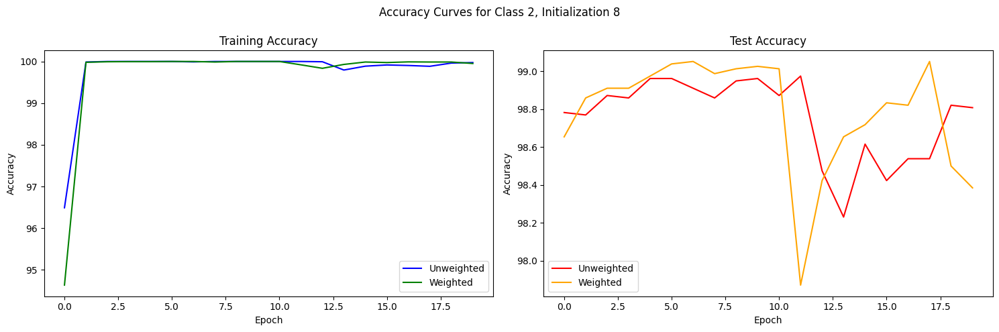

Class 2, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0050, Accuracy: 0.96%, Test Accuracy: 98.56%, Duration: 6.57s
Epoch 2/20, Loss: 0.0022, Accuracy: 1.00%, Test Accuracy: 98.70%, Duration: 6.75s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.73%, Duration: 6.83s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 7.10s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 6.91s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 7.03s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 7.21s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.79s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 6.98s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.90s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.69s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 7.06s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.95%, Test Accuracy: 98.56%, Duration: 6.63s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 6.50s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.62%, Duration: 6.82s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 6.36s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 6.39s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 6.24s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 6.53s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.83%, Duration: 6.51s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.79%, Duration: 6.54s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.33%, Duration: 6.23s
Epoch 11/20, Loss: 0.0055, Accuracy: 1.00%, Test Accuracy: 97.63%, Duration: 6.61s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.47%, Duration: 6.81s
Epoch 13/20, 

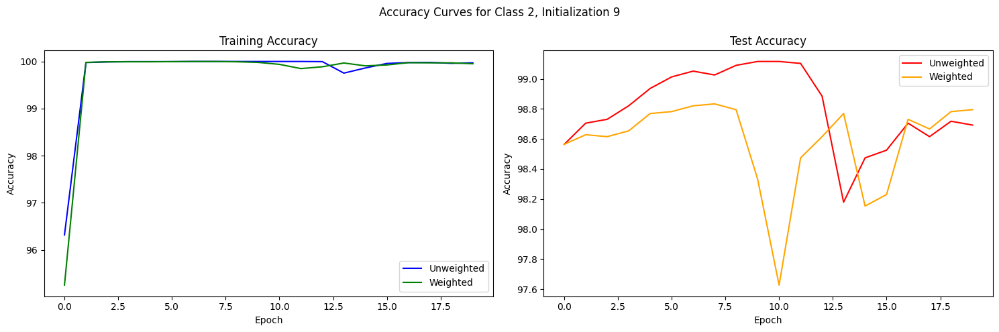

Class 2, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.94%, Test Accuracy: 98.88%, Duration: 7.00s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 7.47s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 6.33s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 6.75s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 6.81s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.74%, Duration: 6.91s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.52s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.82%, Duration: 6.50s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.74%, Duration: 7.12s
Epoch 10/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 98.46%, Duration: 7.02s
Epoch 11/20, Loss: 0.0332, Accuracy: 1.00%, Test Accuracy: 98.27%, Duration: 6.38s
Epoch 12/20, Loss: 0.0027, Accuracy: 1.00%, Test Accuracy: 98.27%, Duration: 6.53s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.94%, Test Accuracy: 98.37%, Duration: 5.93s
Epoch 2/20, Loss: 0.0028, Accuracy: 1.00%, Test Accuracy: 98.56%, Duration: 5.84s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.60%, Duration: 5.77s
Epoch 4/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 98.60%, Duration: 5.74s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.62%, Duration: 5.78s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.74%, Duration: 5.88s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 6.08s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.67%, Duration: 5.82s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.65%, Duration: 6.08s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 6.33s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.74%, Duration: 5.88s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.27%, Duration: 6.71s
Epoch 13/20, 

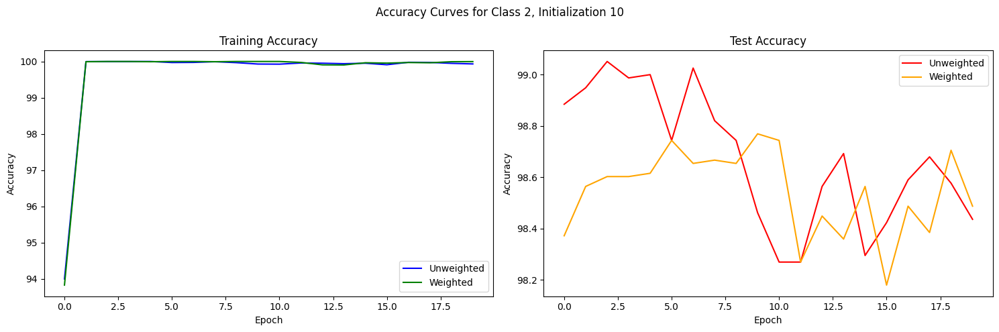

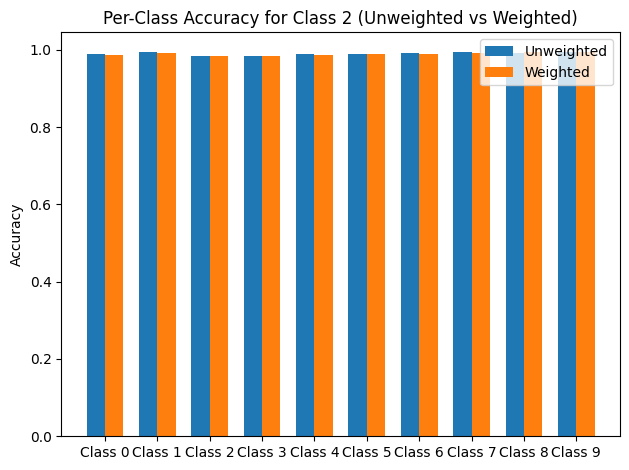

Files already downloaded and verified
Class 3, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0116, Accuracy: 0.94%, Test Accuracy: 99.68%, Duration: 6.12s
Epoch 2/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.28s
Epoch 3/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.07s
Epoch 4/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 5.93s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.33s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.21s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.54s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.77s
Epoch 9/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.53s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.03s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.60s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.06s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0066, Accuracy: 0.93%, Test Accuracy: 99.55%, Duration: 6.49s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.24s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.43s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.45s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.58s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.41s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.20s
Epoch 8/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.44s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.31s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.32s
Epoch 11/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.32s
Epoch 12/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.76s
Epoch 13/20, 

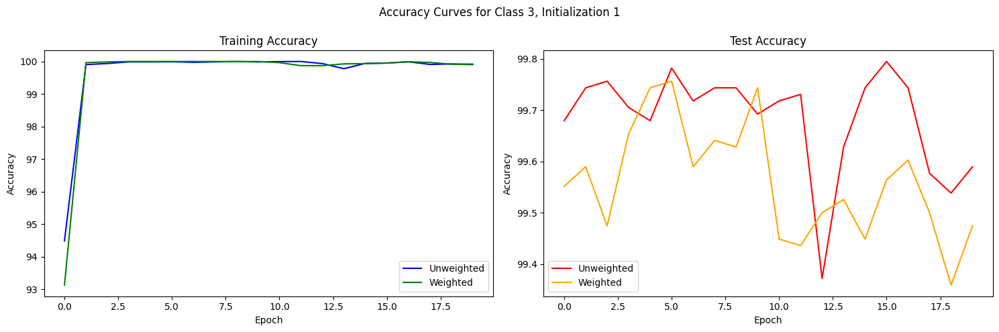

Class 3, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0015, Accuracy: 0.95%, Test Accuracy: 99.51%, Duration: 6.90s
Epoch 2/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.42s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 8.24s
Epoch 4/20, Loss: 0.0034, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.34s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.00s
Epoch 6/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 8.22s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.47s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.44s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.74s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 8.76s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.93s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.38s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0030, Accuracy: 0.94%, Test Accuracy: 99.44%, Duration: 7.05s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.77s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.92s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.09s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.71s
Epoch 6/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.35s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.58s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.26s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.89s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.69s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.16s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.50s
Epoch 13/20, 

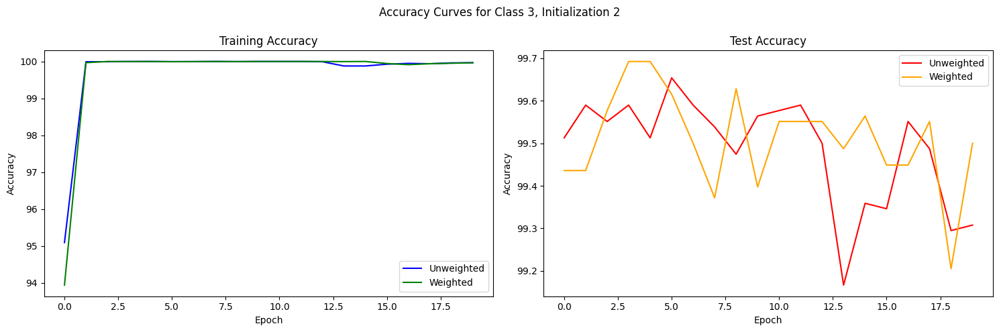

Class 3, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0096, Accuracy: 0.97%, Test Accuracy: 99.41%, Duration: 6.62s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.11s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 7.16s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.53s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.24s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.38s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.59s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.72s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.54s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.05s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.35s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.19s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0047, Accuracy: 0.96%, Test Accuracy: 99.19%, Duration: 6.38s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.15s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 5.93s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.24s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.17s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.36s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 5.60s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.31s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.34s
Epoch 10/20, Loss: 0.0928, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 7.53s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.92s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.56s
Epoch 13/20, 

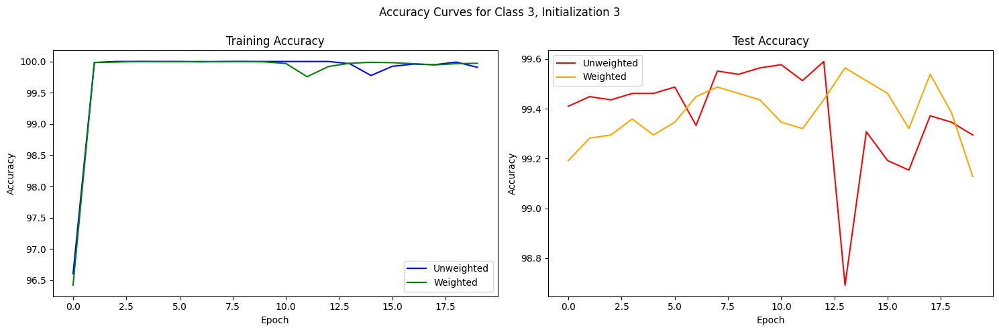

Class 3, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0024, Accuracy: 0.94%, Test Accuracy: 99.28%, Duration: 6.70s
Epoch 2/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.12s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.51s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.84s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.22s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.92s
Epoch 7/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.74s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.69s
Epoch 9/20, Loss: 0.0566, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 6.56s
Epoch 10/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.49s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.28s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.33s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.96%, Test Accuracy: 99.54%, Duration: 6.40s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.41s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.68s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.15s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.23s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.68s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.42s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.52s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.55s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.32s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.04s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.78s
Epoch 13/20, 

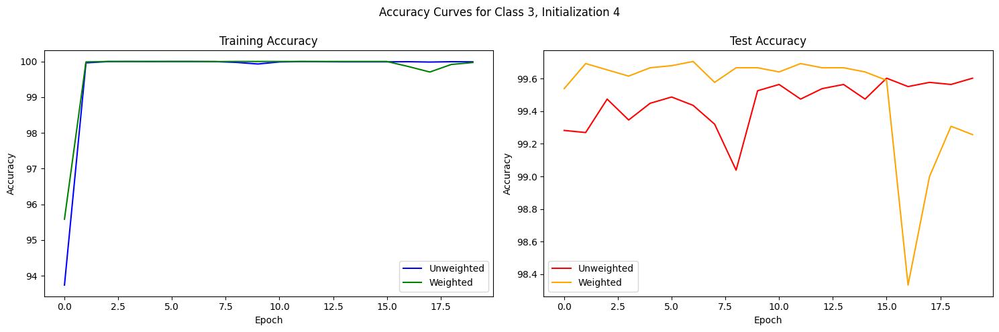

Class 3, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0028, Accuracy: 0.95%, Test Accuracy: 99.31%, Duration: 6.70s
Epoch 2/20, Loss: 0.0570, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 5.98s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.36s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 5.95s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.13s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.38s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.09s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.15s
Epoch 9/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.18s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 5.91s
Epoch 11/20, Loss: 0.0034, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 5.92s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 5.67s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.96%, Test Accuracy: 99.42%, Duration: 5.81s
Epoch 2/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.09s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.16s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 5.81s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 5.75s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 5.89s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.03s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 5.93s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 5.90s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 5.95s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.15s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.59s
Epoch 13/20, 

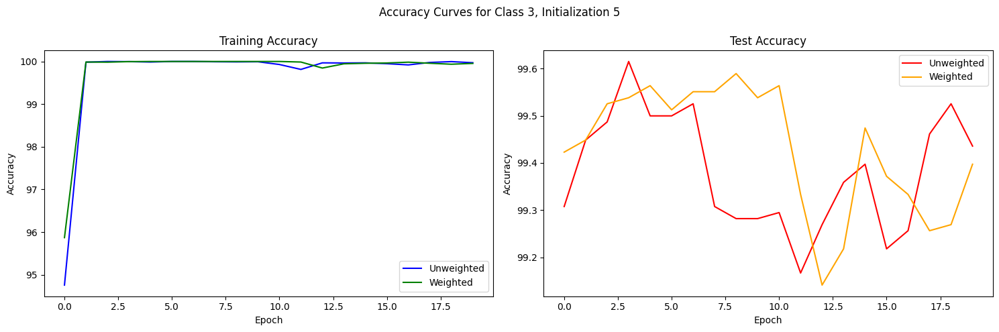

Class 3, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0057, Accuracy: 0.93%, Test Accuracy: 99.12%, Duration: 6.60s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.45s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.39s
Epoch 4/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.50s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 7.07s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.75s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.51s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.59s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.53s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.47s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.39s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.14s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.96%, Test Accuracy: 99.44%, Duration: 5.91s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.20s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.00s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.19s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.20s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.16s
Epoch 7/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 5.96s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 6.08s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.23s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.34s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 6.81s
Epoch 12/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 6.14s
Epoch 13/20, 

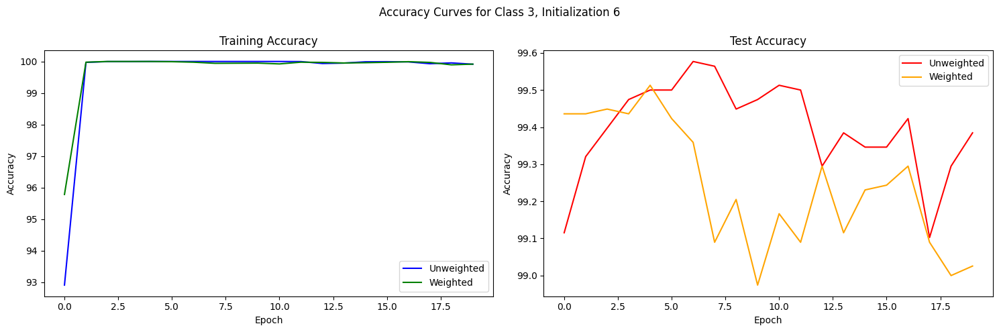

Class 3, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.96%, Test Accuracy: 99.22%, Duration: 6.66s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 5.97s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.50s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 6.72s
Epoch 5/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.66s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.49s
Epoch 7/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.88s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.79s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.27s
Epoch 10/20, Loss: 0.0031, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 7.41s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 7.62s
Epoch 12/20, Loss: 0.0026, Accuracy: 1.00%, Test Accuracy: 98.76%, Duration: 7.28s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0054, Accuracy: 0.96%, Test Accuracy: 99.17%, Duration: 7.14s
Epoch 2/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.91s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 6.61s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.74s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.07s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.49s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.80s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 6.51s
Epoch 9/20, Loss: 0.0414, Accuracy: 1.00%, Test Accuracy: 98.72%, Duration: 7.29s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.76%, Duration: 6.54s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.94s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.93s
Epoch 13/20, 

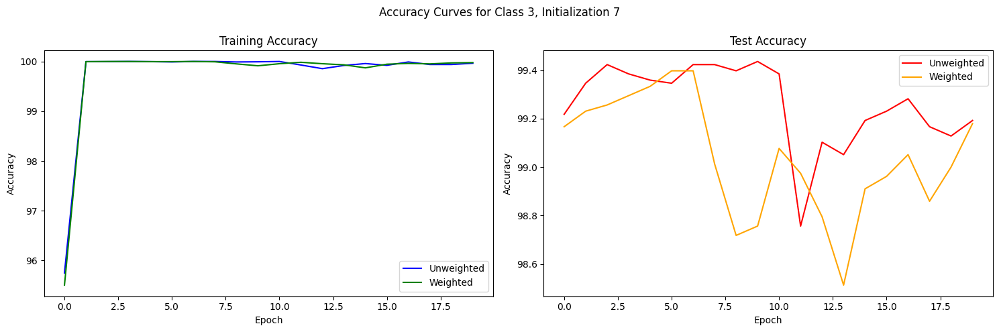

Class 3, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.97%, Test Accuracy: 98.96%, Duration: 7.44s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 6.78s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 7.06s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 7.13s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 7.32s
Epoch 6/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.90s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 7.43s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.27s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.88%, Duration: 7.22s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 7.04s
Epoch 11/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 98.77%, Duration: 5.72s
Epoch 12/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.55s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0038, Accuracy: 0.95%, Test Accuracy: 98.83%, Duration: 6.35s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.02s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.00%, Duration: 6.97s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.85%, Duration: 6.26s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 6.23s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 6.31s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 6.16s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.06s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.66s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.18s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.59s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 7.20s
Epoch 13/20, 

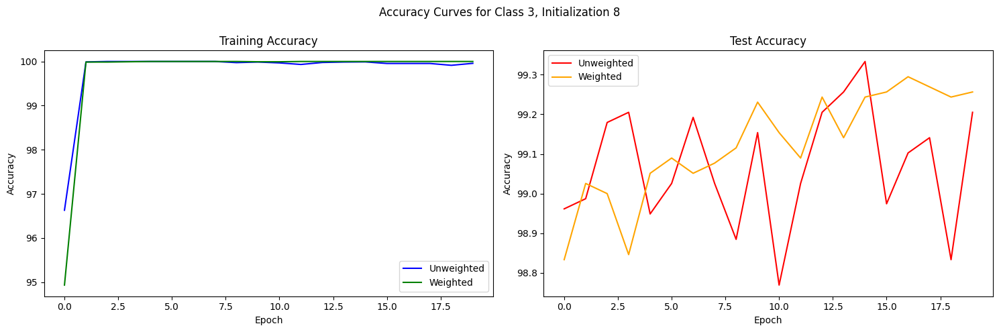

Class 3, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.95%, Test Accuracy: 98.96%, Duration: 6.56s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 7.39s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.98s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.14s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.06s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 7.32s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.98s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 7.09s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.09%, Duration: 7.29s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 7.24s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.19s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 6.91s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.96%, Test Accuracy: 98.78%, Duration: 5.84s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 98.94%, Duration: 6.91s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 7.04s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.64s
Epoch 5/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.83s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.88s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.64s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 6.83s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.05%, Duration: 6.68s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.69s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.46s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.44s
Epoch 13/20, 

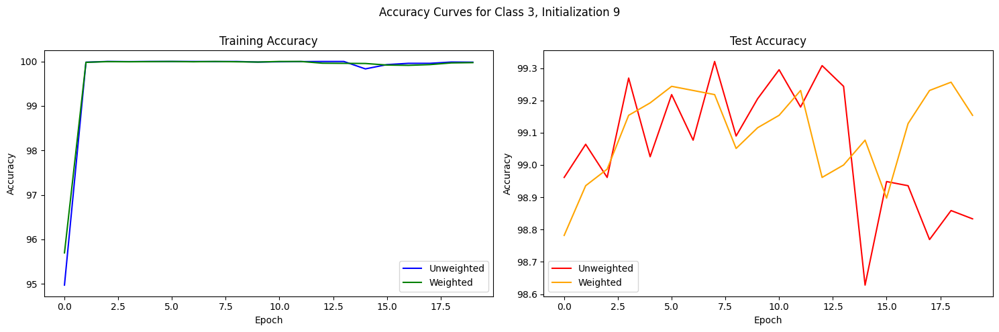

Class 3, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0023, Accuracy: 0.96%, Test Accuracy: 99.10%, Duration: 7.03s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.08s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.31s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.92s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.13s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.18s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.97s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 7.20s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 7.07s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.34s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.87s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.85s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.97%, Test Accuracy: 99.12%, Duration: 6.75s
Epoch 2/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 5.95s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.47s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.10s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 5.95s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.41s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.10s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.09s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.13s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.01s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.11s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 7.76s
Epoch 13/20, 

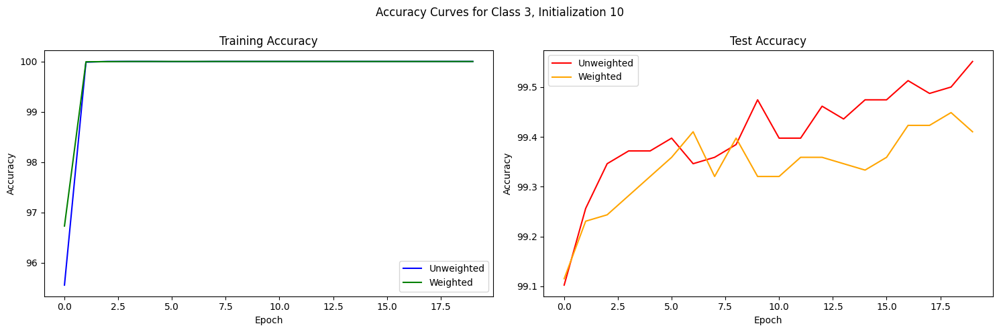

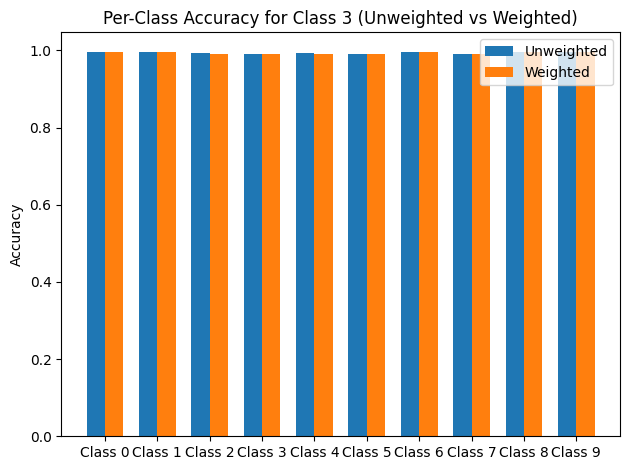

Files already downloaded and verified
Class 4, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0098, Accuracy: 0.97%, Test Accuracy: 99.82%, Duration: 6.62s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.37s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.58s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.08s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.69s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.29s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.54s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.84s
Epoch 9/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.11s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.85s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.63s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.40s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0199, Accuracy: 0.97%, Test Accuracy: 99.82%, Duration: 6.11s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.27s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.31s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.29s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.28s
Epoch 6/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.10s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.12s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.07s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 5.89s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.19s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.20s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 5.99s
Epoch 13/20, 

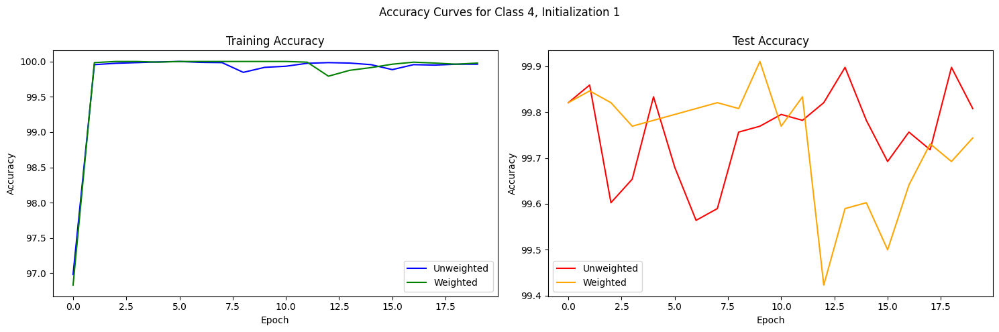

Class 4, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.94%, Test Accuracy: 99.78%, Duration: 6.58s
Epoch 2/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.01s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.63s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.32s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.45s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.71s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.79s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.55s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.23s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.55s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.60s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.56s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0037, Accuracy: 0.96%, Test Accuracy: 99.74%, Duration: 6.49s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.73s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.43s
Epoch 4/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.57s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.51s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.07s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.07s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.41s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.25s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.53s
Epoch 11/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.08s
Epoch 12/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.62s
Epoch 13/20, 

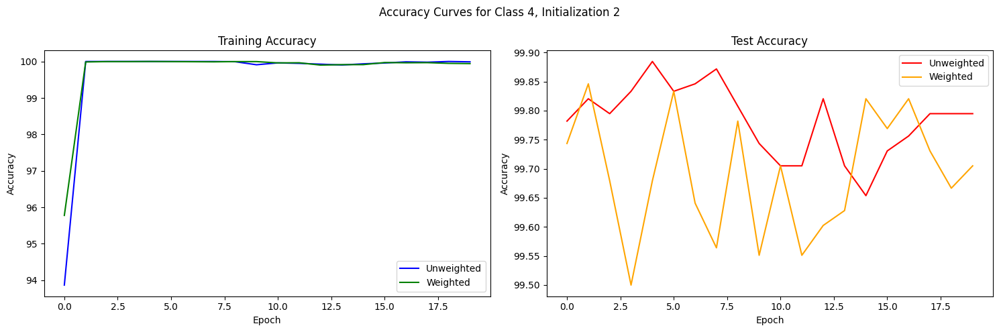

Class 4, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.95%, Test Accuracy: 99.74%, Duration: 6.30s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.47s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.49s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.17s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.20s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 5.96s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.71s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.27s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.38s
Epoch 10/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.27s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.86s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.38s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.95%, Test Accuracy: 99.67%, Duration: 6.59s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.54s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.84s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.00s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.77s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.67s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.89s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.95s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.77s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.59s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.70s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.72s
Epoch 13/20, 

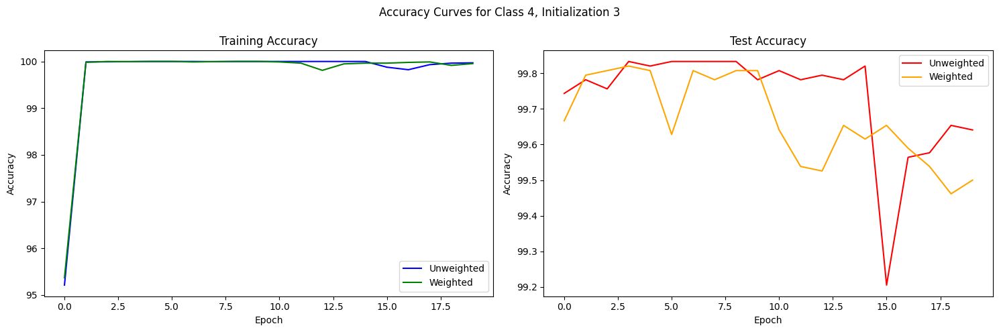

Class 4, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0036, Accuracy: 0.96%, Test Accuracy: 99.59%, Duration: 6.48s
Epoch 2/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.79s
Epoch 3/20, Loss: 0.0125, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.64s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.59s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.78s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.08s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.96s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.83s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.25s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.43s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.95s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.08s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0106, Accuracy: 0.96%, Test Accuracy: 99.50%, Duration: 6.39s
Epoch 2/20, Loss: 0.0063, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.88s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.15s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.78s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.95s
Epoch 6/20, Loss: 0.0360, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.55s
Epoch 7/20, Loss: 0.0038, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.42s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.79s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.66s
Epoch 10/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.34s
Epoch 11/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.72s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.30s
Epoch 13/20, 

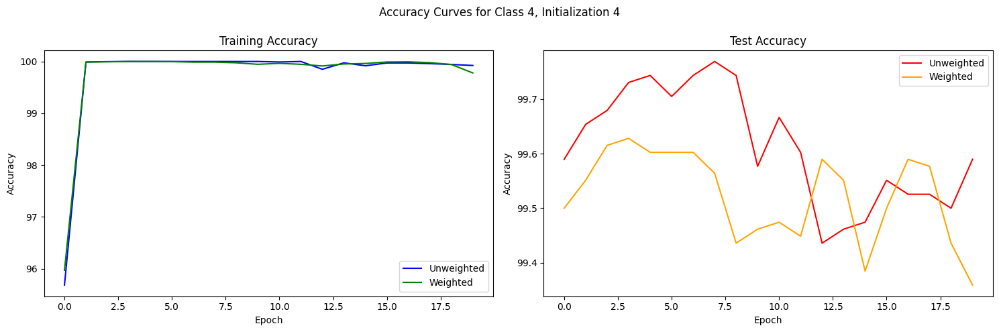

Class 4, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0391, Accuracy: 0.96%, Test Accuracy: 99.24%, Duration: 6.09s
Epoch 2/20, Loss: 0.0034, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.48s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.15s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.00s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.66s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.70s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.16s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.73s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.01s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.65s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 7.11s
Epoch 12/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.22s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0019, Accuracy: 0.95%, Test Accuracy: 99.50%, Duration: 6.94s
Epoch 2/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.13s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.70s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.05s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.92s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.93s
Epoch 7/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.85s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.39s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.13s
Epoch 10/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 98.78%, Duration: 6.33s
Epoch 11/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 7.24s
Epoch 12/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.40s
Epoch 13/20, 

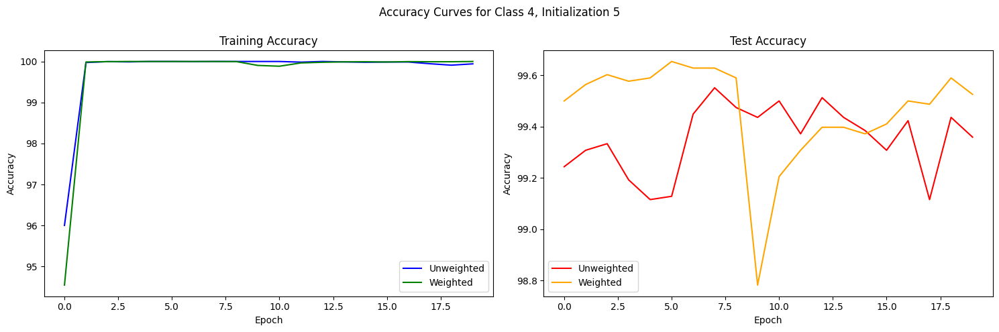

Class 4, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.96%, Test Accuracy: 99.55%, Duration: 6.58s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.65s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.73s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.78s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.01s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.65s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.63s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.08s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.57s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.45s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.23s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.43s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0025, Accuracy: 0.93%, Test Accuracy: 99.33%, Duration: 6.89s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 7.27s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.73s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 7.12s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.76s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.54s
Epoch 7/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.37s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.59s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 8.33s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.43s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.13s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.06s
Epoch 13/20, 

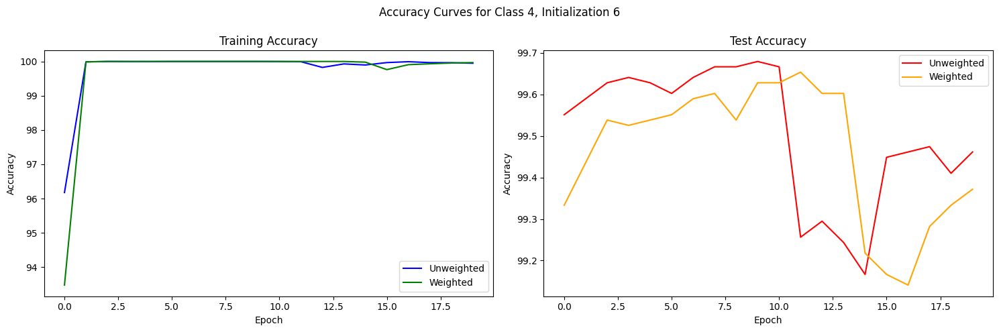

Class 4, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0107, Accuracy: 0.95%, Test Accuracy: 99.28%, Duration: 6.84s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.10s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.56s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.07s
Epoch 5/20, Loss: 0.0060, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 5.97s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.73s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.21s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.62s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.84s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 5.98s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.67s
Epoch 12/20, Loss: 0.0408, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 6.61s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0018, Accuracy: 0.95%, Test Accuracy: 99.15%, Duration: 6.80s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.77s
Epoch 3/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.98s
Epoch 4/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.17s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.86s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.44s
Epoch 7/20, Loss: 0.0236, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.55s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 8.22s
Epoch 9/20, Loss: 0.0040, Accuracy: 1.00%, Test Accuracy: 98.99%, Duration: 7.95s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 8.17s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 8.11s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 7.48s
Epoch 13/20, 

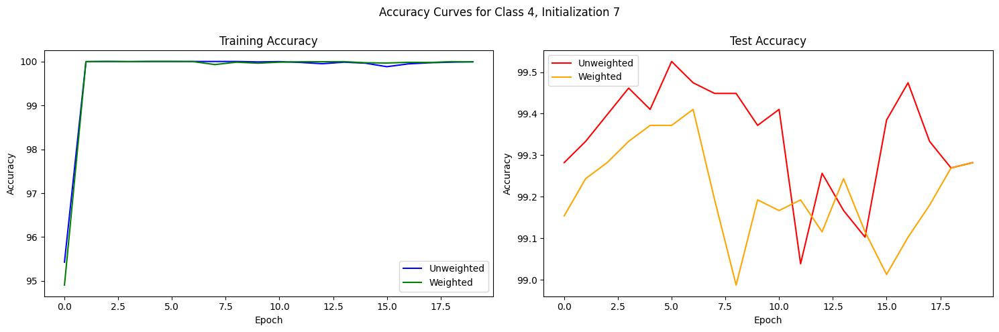

Class 4, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0020, Accuracy: 0.96%, Test Accuracy: 99.01%, Duration: 7.45s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.10%, Duration: 7.57s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.72s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.39s
Epoch 5/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.55s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.92s
Epoch 7/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.55s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.90s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.12s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.98s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.14s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.77s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0019, Accuracy: 0.96%, Test Accuracy: 99.13%, Duration: 7.45s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.89s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 7.57s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 8.62s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.58s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.68s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.00s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 7.73s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 7.23s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 7.35s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 7.87s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.92%, Duration: 7.45s
Epoch 13/20, 

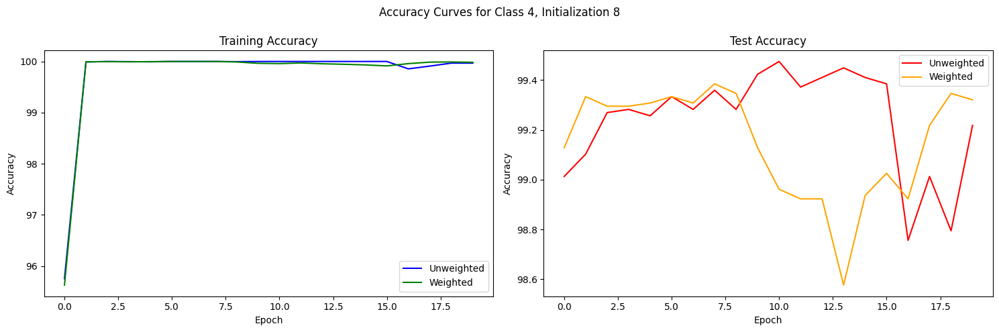

Class 4, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.96%, Test Accuracy: 99.00%, Duration: 7.51s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 7.38s
Epoch 3/20, Loss: 0.0031, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.55s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.83s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.87s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.24s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.66s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.22s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.78s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.87s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.98s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 7.05s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.94%, Test Accuracy: 99.08%, Duration: 8.43s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.91s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 7.54s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 7.69s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 7.50s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.30s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 7.05s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.31s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.21s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.51s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.42s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.59s
Epoch 13/20, 

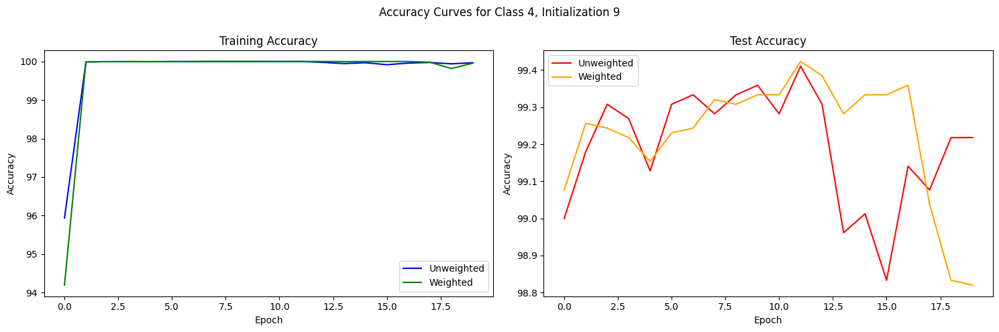

Class 4, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.94%, Test Accuracy: 98.74%, Duration: 6.77s
Epoch 2/20, Loss: 0.0049, Accuracy: 1.00%, Test Accuracy: 98.96%, Duration: 6.25s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 98.95%, Duration: 6.54s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 98.88%, Duration: 6.14s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.46s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.13%, Duration: 6.01s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 6.15s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.01%, Duration: 6.13s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 5.83s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.26s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.06%, Duration: 5.66s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 5.84s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0022, Accuracy: 0.95%, Test Accuracy: 98.86%, Duration: 6.96s
Epoch 2/20, Loss: 0.0031, Accuracy: 1.00%, Test Accuracy: 98.97%, Duration: 6.43s
Epoch 3/20, Loss: 0.0017, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.46s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.50s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.96s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 6.67s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.54s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 6.40s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.15%, Duration: 6.58s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.08s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.34s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 98.73%, Duration: 6.64s
Epoch 13/20, 

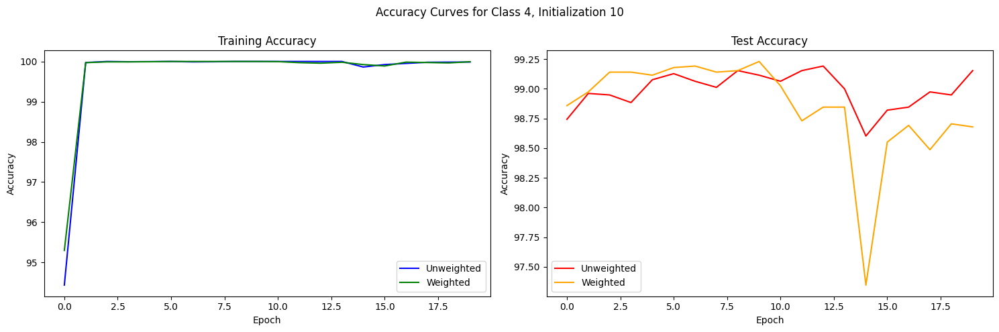

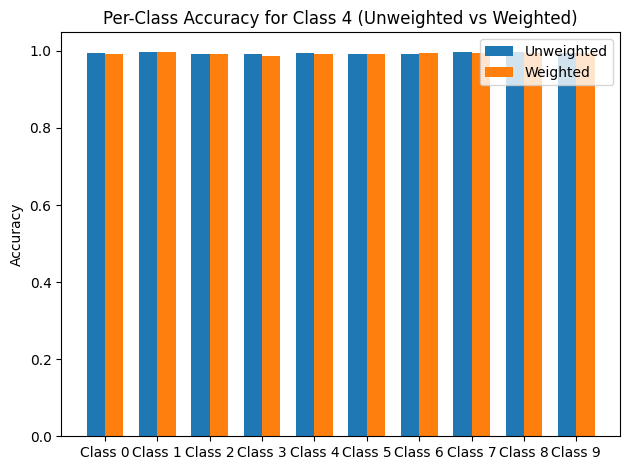

Files already downloaded and verified
Class 5, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0031, Accuracy: 0.95%, Test Accuracy: 99.63%, Duration: 6.34s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.31s
Epoch 3/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.14s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.70s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.10s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.13s
Epoch 7/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 5.94s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.27s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.74s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.36s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.37s
Epoch 12/20, Loss: 0.0028, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.05s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0039, Accuracy: 0.94%, Test Accuracy: 99.69%, Duration: 6.95s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.81s
Epoch 3/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 5.96s
Epoch 4/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.03s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.24s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.10s
Epoch 7/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.06s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.23s
Epoch 9/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.01s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.29s
Epoch 11/20, Loss: 0.0041, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.12s
Epoch 12/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.61s
Epoch 13/20, 

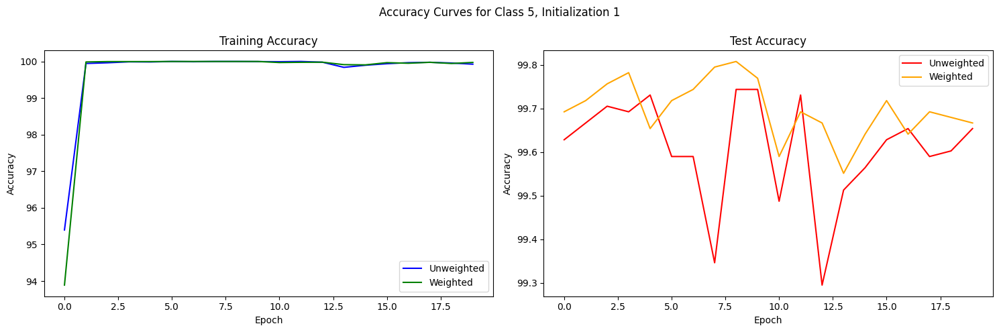

Class 5, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0057, Accuracy: 0.96%, Test Accuracy: 99.73%, Duration: 6.46s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.11s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.53s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.58s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.19s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.50s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.39s
Epoch 8/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.32s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.33s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.41s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.14s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.00s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0018, Accuracy: 0.97%, Test Accuracy: 99.59%, Duration: 7.69s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.97s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.97s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.27s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.01s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.72s
Epoch 7/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.09s
Epoch 8/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.50s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.59s
Epoch 10/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.73s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.89s
Epoch 12/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.69s
Epoch 13/20, 

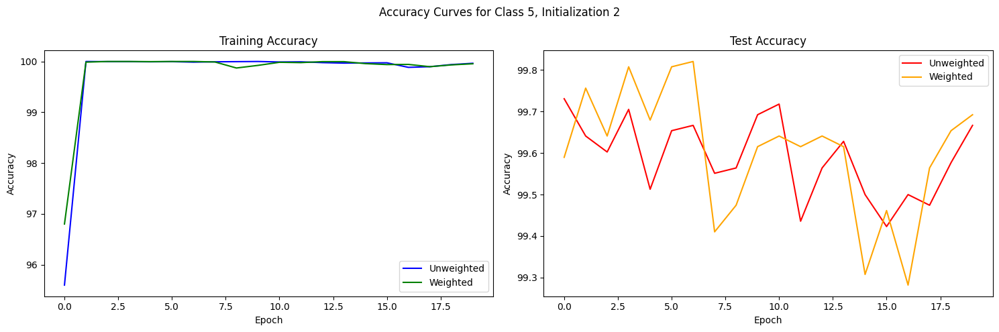

Class 5, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.93%, Test Accuracy: 99.71%, Duration: 6.65s
Epoch 2/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 5.99s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.20s
Epoch 4/20, Loss: 0.0031, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.17s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.17s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.54s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.57s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.39s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.69s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.45s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.66s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.94s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.94%, Test Accuracy: 99.69%, Duration: 7.28s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.95s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.86s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.00s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.65s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.20s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.83s
Epoch 8/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.30s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.87s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.61s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.21s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.05s
Epoch 13/20, 

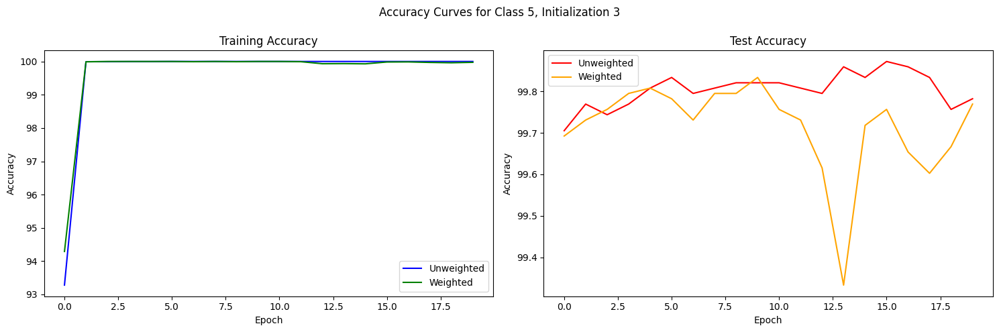

Class 5, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0011, Accuracy: 0.95%, Test Accuracy: 99.63%, Duration: 7.00s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.87s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.60s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.62s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.44s
Epoch 6/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.20s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.78s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.24s
Epoch 9/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.83s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.63s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.34s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.73s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.96%, Test Accuracy: 99.54%, Duration: 7.43s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.33s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.85s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.79s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.64s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.12s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.21s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.59s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.53s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.86s
Epoch 11/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.71s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.14s
Epoch 13/20, 

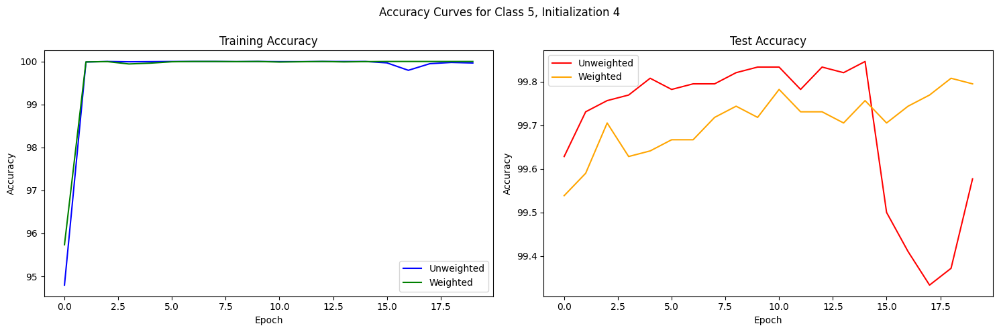

Class 5, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.95%, Test Accuracy: 99.60%, Duration: 7.14s
Epoch 2/20, Loss: 0.0017, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.73s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.69s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.85s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.20s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.54s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.20s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.21s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.62s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.56s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.45s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.18s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.95%, Test Accuracy: 99.56%, Duration: 6.83s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.46s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.41s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.32s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.51s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.86s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.60s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.54s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.83s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.07s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.01s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.29s
Epoch 13/20, 

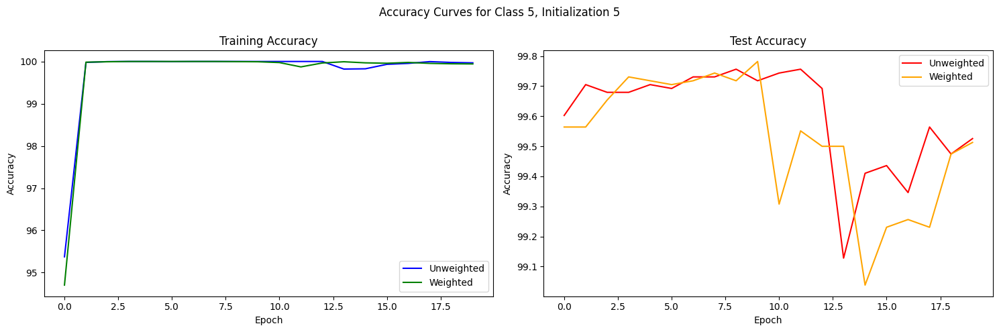

Class 5, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.96%, Test Accuracy: 99.41%, Duration: 6.74s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.70s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.09s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.09s
Epoch 5/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.08%, Duration: 6.76s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 6.45s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.17s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.47s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.43s
Epoch 10/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.22s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.58s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.62s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.97%, Test Accuracy: 99.51%, Duration: 6.72s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.57s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.67s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.80s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.27s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.59s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.67s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.33s
Epoch 9/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.34s
Epoch 10/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.79s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 6.04s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.89s
Epoch 13/20, 

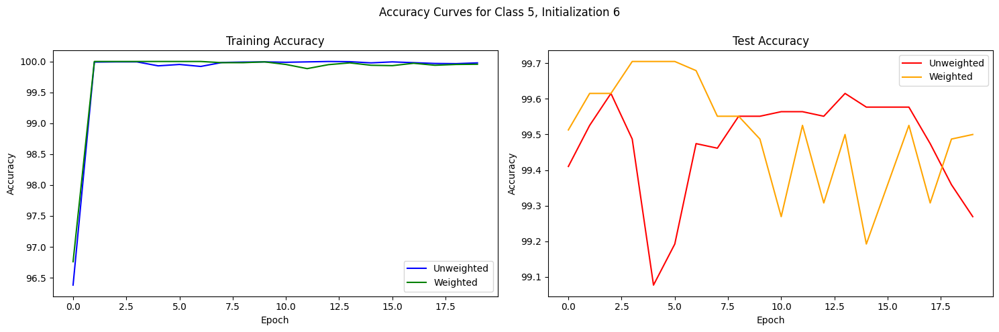

Class 5, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.96%, Test Accuracy: 99.59%, Duration: 7.09s
Epoch 2/20, Loss: 0.0919, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.85s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.69s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.73s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.13s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.50s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.16s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.93s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.11s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.00s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.11s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.89s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.97%, Test Accuracy: 99.56%, Duration: 6.71s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.96s
Epoch 3/20, Loss: 0.0042, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.90s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.78s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.96s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.83s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.10s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.38s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.23s
Epoch 10/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.57s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.60s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.22s
Epoch 13/20, 

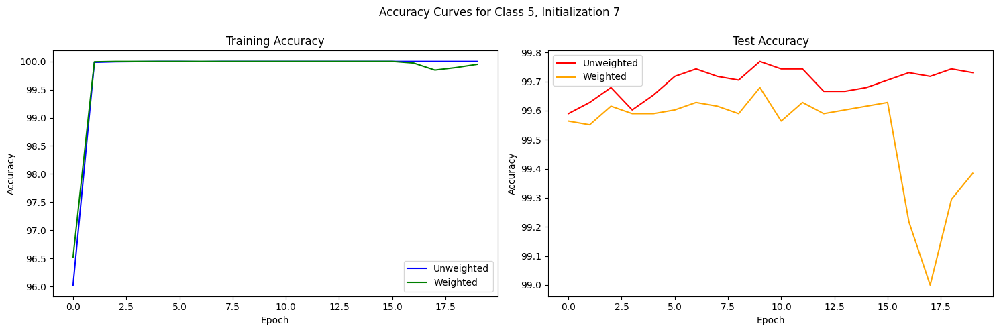

Class 5, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0016, Accuracy: 0.95%, Test Accuracy: 99.23%, Duration: 7.20s
Epoch 2/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.06s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.90s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.31s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 7.02s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.57s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 7.10s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.68s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.66s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.26s
Epoch 11/20, Loss: 0.0069, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.10s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.12%, Duration: 6.61s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0003, Accuracy: 0.96%, Test Accuracy: 99.29%, Duration: 7.16s
Epoch 2/20, Loss: 0.0031, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 7.33s
Epoch 3/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.09s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.97s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.59s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 7.41s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.78s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 7.06s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 7.22s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.34s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 6.86s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.05s
Epoch 13/20, 

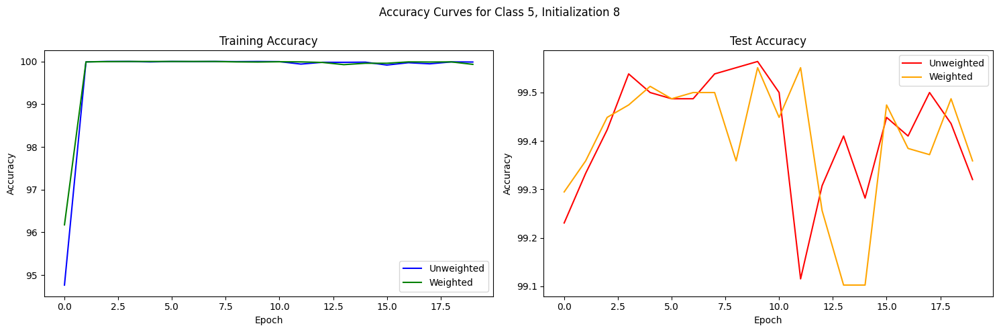

Class 5, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0089, Accuracy: 0.95%, Test Accuracy: 99.23%, Duration: 6.83s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.49s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.66s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.47s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.87s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.04s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.83s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 5.92s
Epoch 9/20, Loss: 0.0277, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 7.07s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 7.56s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 7.74s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.25s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0018, Accuracy: 0.96%, Test Accuracy: 99.31%, Duration: 7.10s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.10s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.69s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 7.78s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.61s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.78s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 7.83s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 8.38s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.26s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.52s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 8.02s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.37s
Epoch 13/20, 

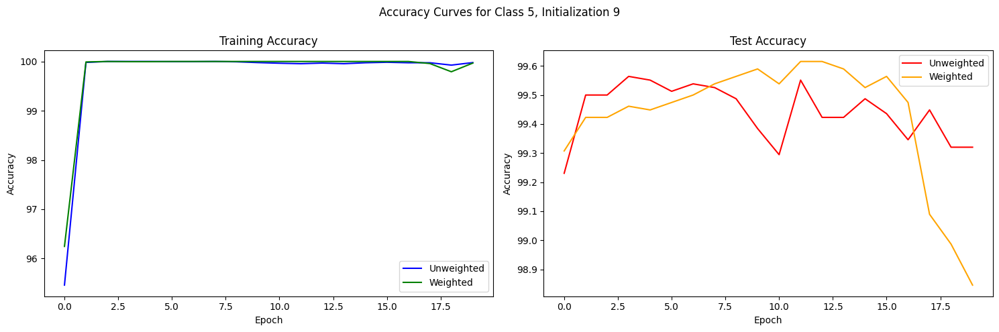

Class 5, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.94%, Test Accuracy: 98.92%, Duration: 7.82s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.95s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 7.03s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.53s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 8.40s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 7.20s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 7.82s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 7.60s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.17%, Duration: 6.82s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 6.87s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.33s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.82s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0029, Accuracy: 0.95%, Test Accuracy: 99.23%, Duration: 6.87s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 7.06s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 7.01s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 7.05s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 6.96s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 7.52s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.70s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.76s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.19s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.04%, Duration: 5.69s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 98.68%, Duration: 5.53s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 5.51s
Epoch 13/20, 

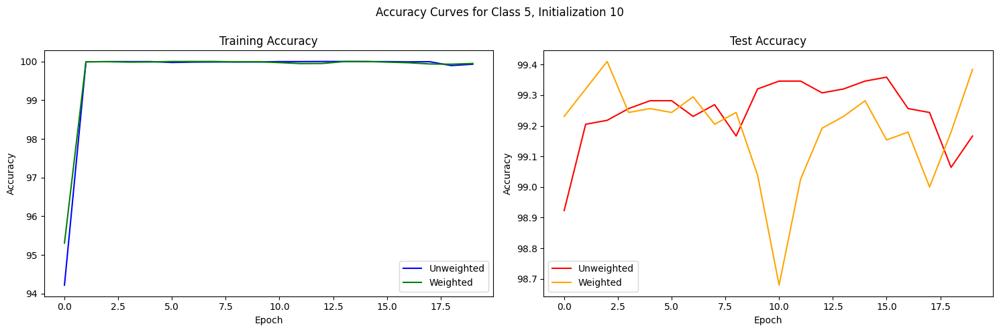

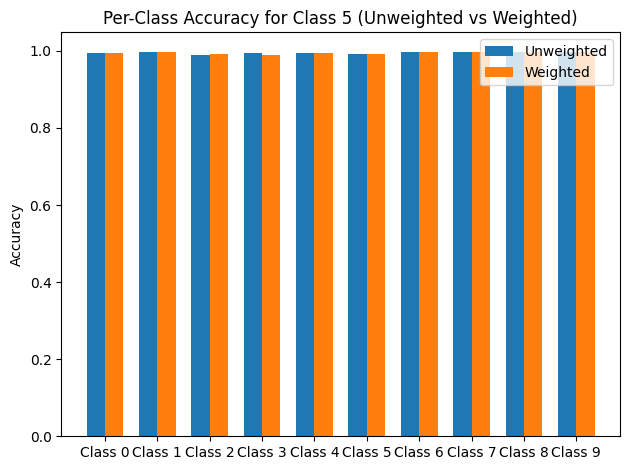

Files already downloaded and verified
Class 6, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.95%, Test Accuracy: 99.91%, Duration: 6.71s
Epoch 2/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.35s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.96%, Duration: 6.45s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 6.58s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.42s
Epoch 6/20, Loss: 0.0029, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 6.56s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 6.98s
Epoch 8/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 6.69s
Epoch 9/20, Loss: 0.0269, Accuracy: 1.00%, Test Accuracy: 98.63%, Duration: 6.40s
Epoch 10/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.56s
Epoch 11/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.38s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.34s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.94%, Test Accuracy: 99.83%, Duration: 6.48s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.18s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.44s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.37s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.24s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.32s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.15s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.41s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.30s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.37s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.47s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.52s
Epoch 13/20, 

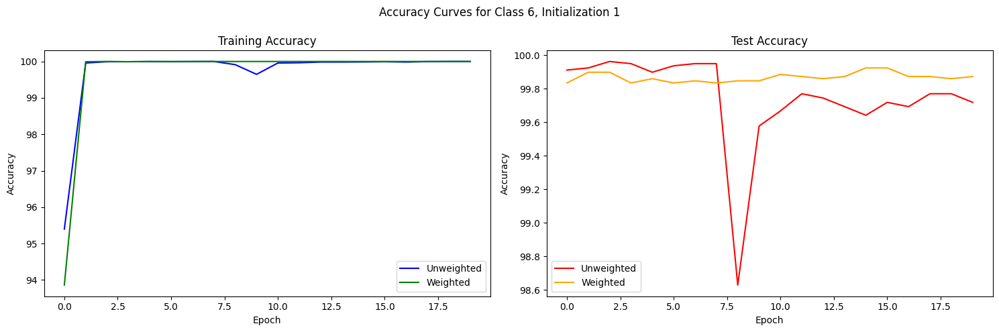

Class 6, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.95%, Test Accuracy: 99.86%, Duration: 6.21s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.37s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.40s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.40s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.19s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.32s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.51s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.30s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.62s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.18s
Epoch 11/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.42s
Epoch 12/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.13s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.96%, Test Accuracy: 99.77%, Duration: 6.59s
Epoch 2/20, Loss: 0.0029, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.77s
Epoch 3/20, Loss: 0.0029, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.60s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.45s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.84s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.86s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.85s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.76s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.53s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.88s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.86s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.55s
Epoch 13/20, 

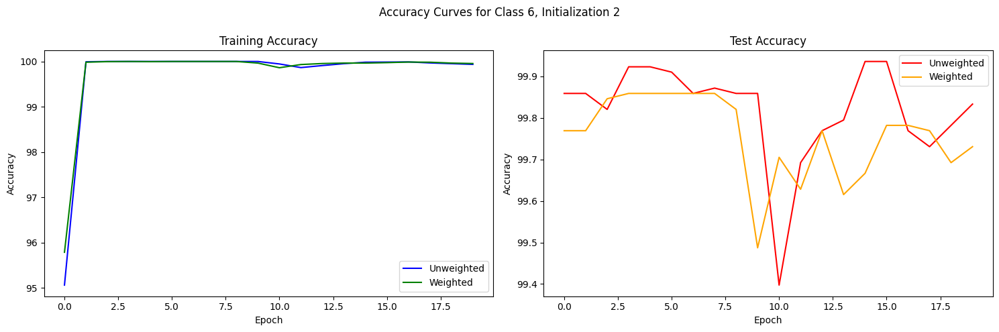

Class 6, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.96%, Test Accuracy: 99.79%, Duration: 6.57s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.95s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.93s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.38s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.67s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.99s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.96s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.61s
Epoch 9/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.23s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.13s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.16s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.01s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.97%, Test Accuracy: 99.71%, Duration: 7.38s
Epoch 2/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.99s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.47s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.56s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.94s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.46s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.77s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.65s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.44s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.68s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.64s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.33s
Epoch 13/20, 

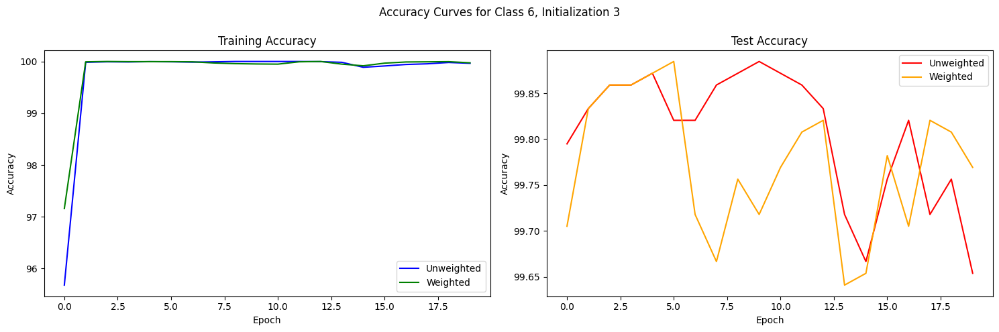

Class 6, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.95%, Test Accuracy: 99.67%, Duration: 7.37s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.07s
Epoch 3/20, Loss: 0.0261, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.99s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.15s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.35s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.93s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.89s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.04s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.81s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.59s
Epoch 11/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.43s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.23s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.96%, Test Accuracy: 99.56%, Duration: 7.22s
Epoch 2/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.40s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.22s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.60s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.18s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.35s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.36s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.38s
Epoch 9/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.31s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.91s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.21s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.03s
Epoch 13/20, 

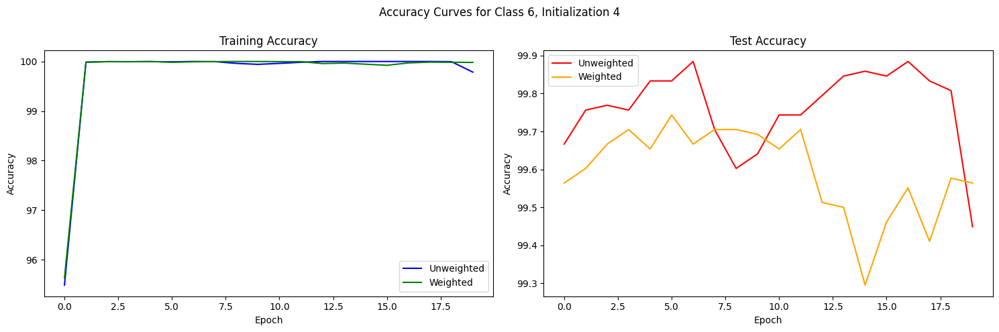

Class 6, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0028, Accuracy: 0.96%, Test Accuracy: 99.71%, Duration: 6.74s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.96s
Epoch 3/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.11s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.84s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.70s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.36s
Epoch 7/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.26s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.18s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.13s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.26s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.10s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.33s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.95%, Test Accuracy: 99.69%, Duration: 7.39s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.33s
Epoch 3/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.25s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.38s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.30s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.38s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.86s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.28s
Epoch 9/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.61s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.14s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.39s
Epoch 12/20, Loss: 0.0810, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 7.44s
Epoch 13/20, 

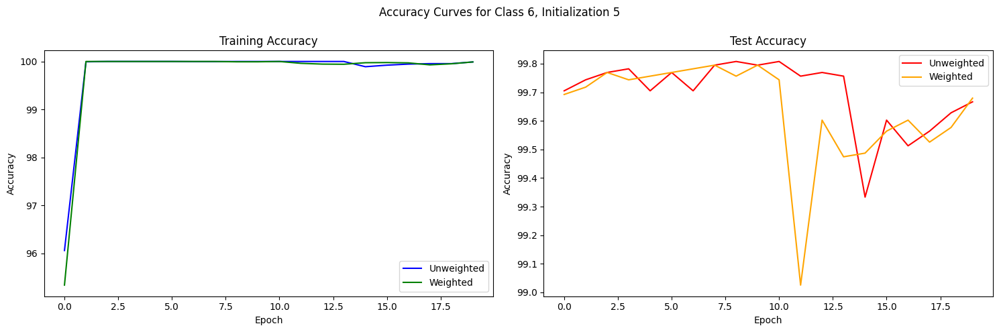

Class 6, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0017, Accuracy: 0.96%, Test Accuracy: 99.63%, Duration: 7.18s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.32s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.01s
Epoch 4/20, Loss: 0.0017, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.82s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.65s
Epoch 6/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.10s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.85s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.22s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.83s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.65s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.44s
Epoch 12/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 7.06s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.97%, Test Accuracy: 99.63%, Duration: 6.97s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.30s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.15s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.01s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.77s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.04s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.16s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.66s
Epoch 9/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.65s
Epoch 10/20, Loss: 0.0105, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.65s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 7.19s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.87s
Epoch 13/20, 

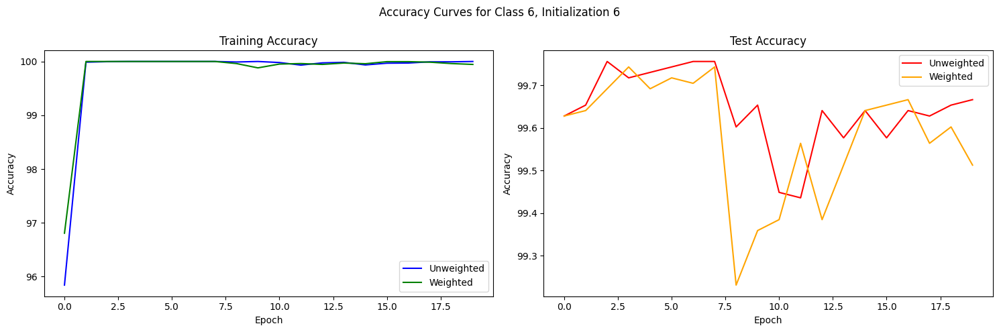

Class 6, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0045, Accuracy: 0.95%, Test Accuracy: 99.55%, Duration: 6.20s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.44s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.65s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.97s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.63s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.14s
Epoch 7/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.13s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.99s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.70s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.99s
Epoch 11/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.28%, Duration: 6.59s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.90s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.94%, Test Accuracy: 99.65%, Duration: 6.87s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.11s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.73s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.83s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.04s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.61s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.96s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.08s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.79s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.79s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.90s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.65s
Epoch 13/20, 

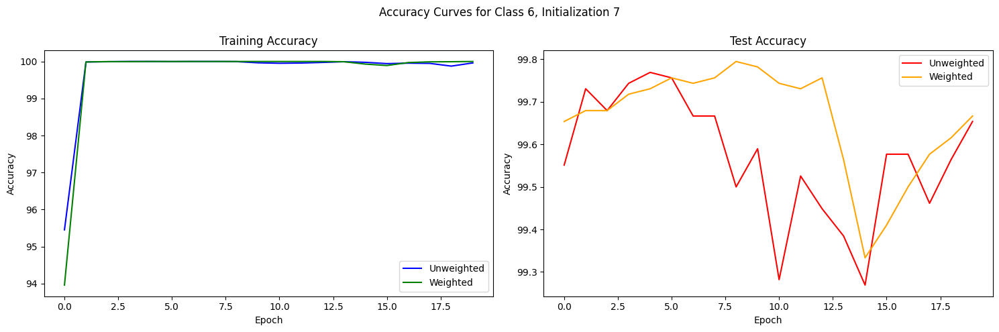

Class 6, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.96%, Test Accuracy: 99.59%, Duration: 6.22s
Epoch 2/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.62s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.52s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.96s
Epoch 5/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.37s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.63s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.66s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.85s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.95s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.63s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.91s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.84s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.95%, Test Accuracy: 99.10%, Duration: 7.41s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.24%, Duration: 6.78s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 6.82s
Epoch 4/20, Loss: 0.0027, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.25s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.38%, Duration: 7.76s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 7.28s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.26s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 7.63s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.38s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.36s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 7.27s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 6.27s
Epoch 13/20, 

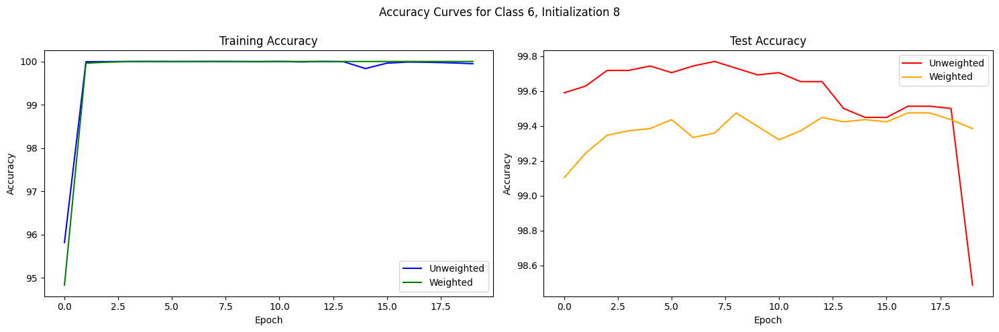

Class 6, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.96%, Test Accuracy: 99.26%, Duration: 6.68s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.27s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.51s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 6.94s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.71s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.35s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 7.22s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 7.36s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.20s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.03s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.05s
Epoch 12/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 7.23s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0017, Accuracy: 0.95%, Test Accuracy: 99.15%, Duration: 6.72s
Epoch 2/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.22%, Duration: 7.19s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.27%, Duration: 6.56s
Epoch 4/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.77s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.56s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.64s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.04s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.35%, Duration: 7.02s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.70s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 6.90s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.36%, Duration: 6.47s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.97s
Epoch 13/20, 

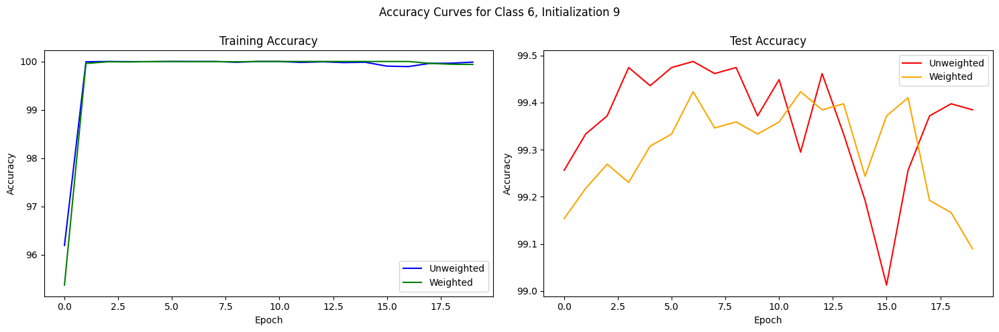

Class 6, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.95%, Test Accuracy: 98.91%, Duration: 7.05s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.18%, Duration: 6.41s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 6.82s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.21%, Duration: 7.47s
Epoch 5/20, Loss: 0.0022, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 7.22s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.01s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 7.34s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.33%, Duration: 7.17s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.23%, Duration: 6.84s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.26%, Duration: 6.77s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.92s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.14%, Duration: 7.62s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.97%, Test Accuracy: 99.23%, Duration: 7.35s
Epoch 2/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.72s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.81s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.58s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.46%, Duration: 6.30s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.37s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.29s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.15s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.46s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.74s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.71s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 7.52s
Epoch 13/20, 

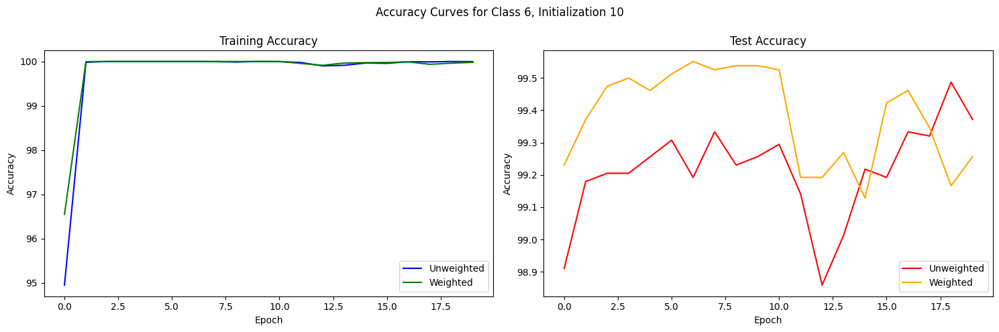

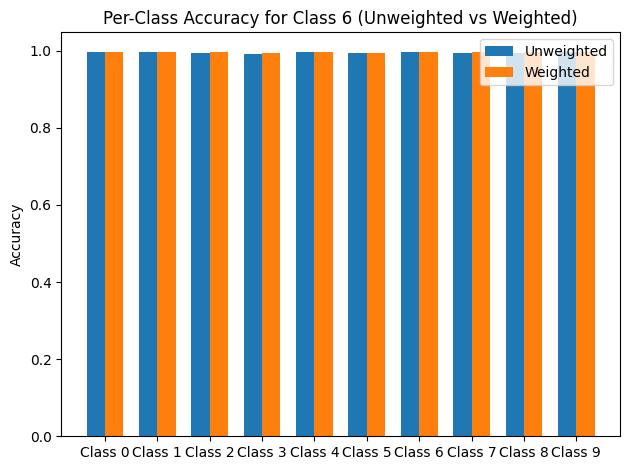

Files already downloaded and verified
Class 7, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0054, Accuracy: 0.98%, Test Accuracy: 99.71%, Duration: 6.36s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.29s
Epoch 3/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.15s
Epoch 4/20, Loss: 0.0024, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.06s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.74s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.59s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.37s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.10s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.42s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.66s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.18s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.70s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.97%, Test Accuracy: 99.83%, Duration: 6.55s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.57s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.97s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.53s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.73s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.60s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.78s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.90s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.74s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.94s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.84s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.71s
Epoch 13/20, 

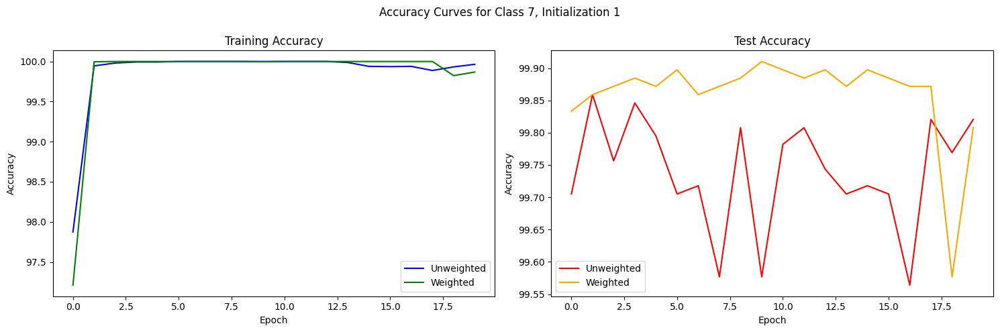

Class 7, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0086, Accuracy: 0.96%, Test Accuracy: 99.82%, Duration: 6.46s
Epoch 2/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.57s
Epoch 3/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.35s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.36s
Epoch 5/20, Loss: 0.0020, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.59s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.38s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.54s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.35s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.82s
Epoch 10/20, Loss: 0.0026, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.28s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.65s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.47s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.97%, Test Accuracy: 99.82%, Duration: 6.79s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.71s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.98s
Epoch 4/20, Loss: 0.0055, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.35s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.85s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.21s
Epoch 7/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.98s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.01s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.80s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.55s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.34s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.93s
Epoch 13/20, 

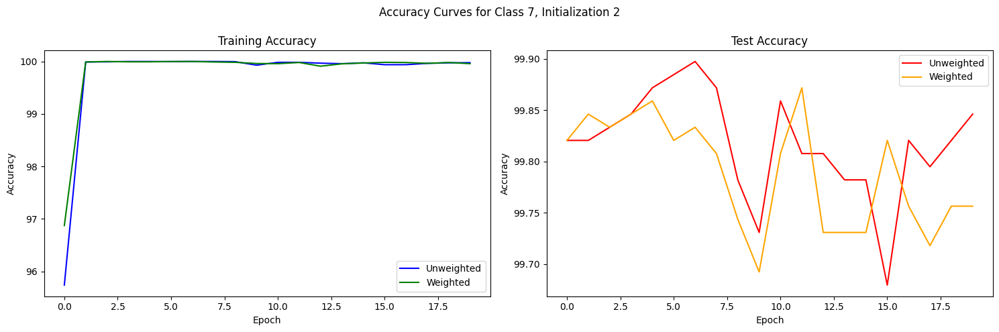

Class 7, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0018, Accuracy: 0.94%, Test Accuracy: 99.73%, Duration: 7.25s
Epoch 2/20, Loss: 0.0030, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.86s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.00s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.10s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.89s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.15s
Epoch 7/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.21s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.89s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.28s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.83s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.15s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.14s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0004, Accuracy: 0.97%, Test Accuracy: 99.69%, Duration: 7.14s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.97s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.23s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.22s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.13s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.05s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.84s
Epoch 8/20, Loss: 0.0521, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.89s
Epoch 9/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.21s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.78s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.65s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.58s
Epoch 13/20, 

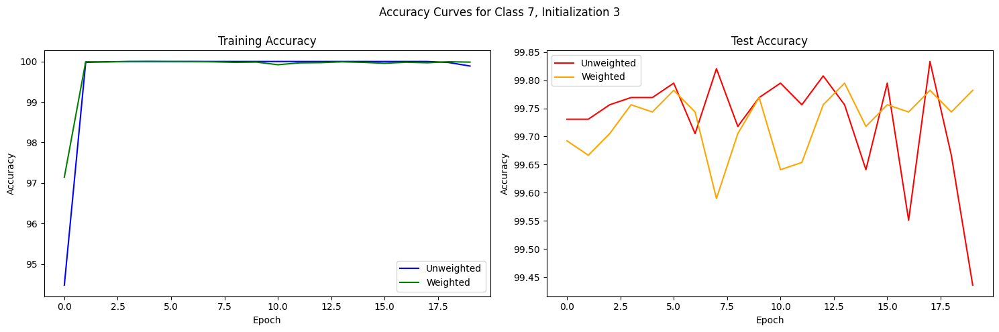

Class 7, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0011, Accuracy: 0.97%, Test Accuracy: 99.81%, Duration: 6.60s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.68s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.66s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.60s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.76s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.23s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.40s
Epoch 8/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.66s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.67s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.89s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.52s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.99s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.96%, Test Accuracy: 99.74%, Duration: 6.99s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.81s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.75s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.20s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.37s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.81s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.15s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.75s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.53s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.82s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.90s
Epoch 12/20, Loss: 0.0323, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.31s
Epoch 13/20, 

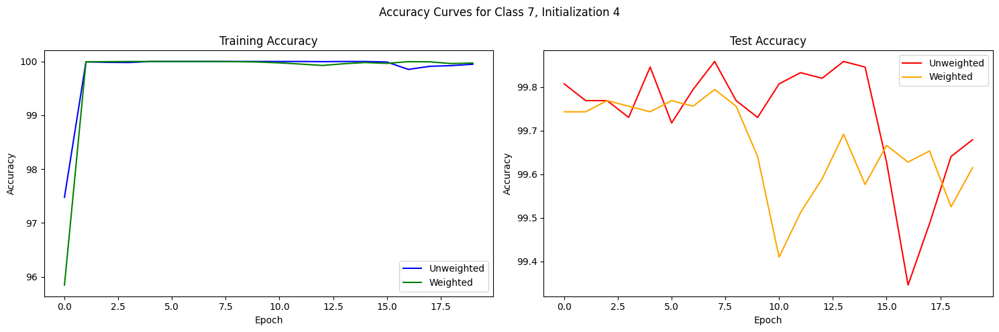

Class 7, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0032, Accuracy: 0.97%, Test Accuracy: 99.68%, Duration: 7.02s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.80s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.51s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.10s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.62s
Epoch 6/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.96s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.60s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.55s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.73s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.51s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.55s
Epoch 12/20, Loss: 0.0841, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 6.83s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0014, Accuracy: 0.93%, Test Accuracy: 99.63%, Duration: 6.28s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.81s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.87s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.64s
Epoch 5/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.94s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.00s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.87s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.86s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.49s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.93s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.29s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.98s
Epoch 13/20, 

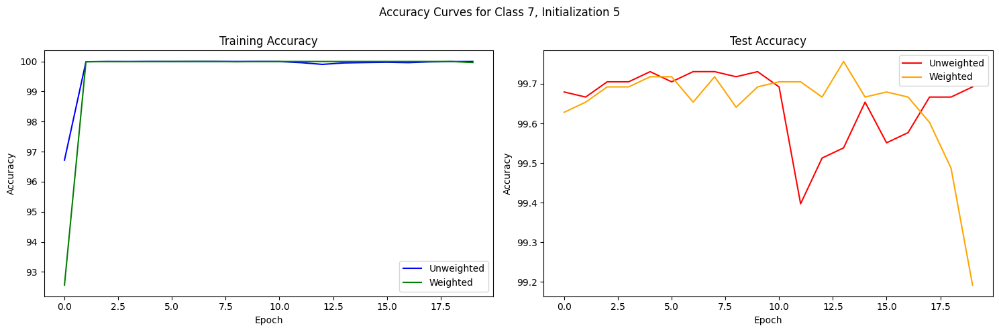

Class 7, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0005, Accuracy: 0.95%, Test Accuracy: 99.51%, Duration: 6.77s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.69s
Epoch 3/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.78s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.99s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.13s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.67s
Epoch 7/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.68s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.29s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.52s
Epoch 10/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.55s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.05s
Epoch 12/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.87s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0104, Accuracy: 0.96%, Test Accuracy: 99.49%, Duration: 7.02s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.13s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.06s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.86s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.26s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.53s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.91s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.40s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.75s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.19s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.49s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.72s
Epoch 13/20, 

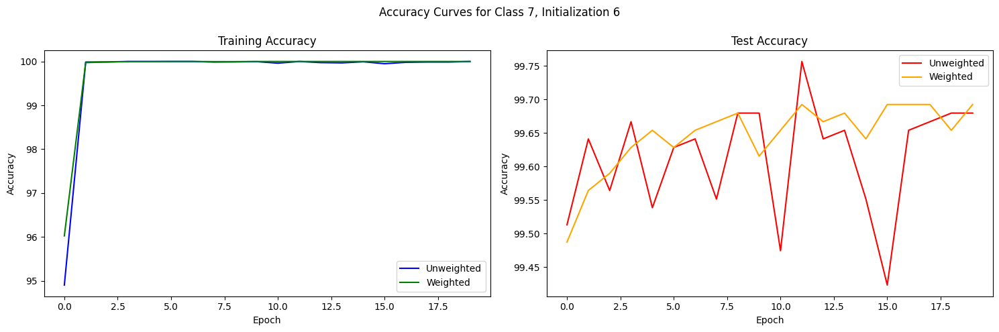

Class 7, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.97%, Test Accuracy: 99.63%, Duration: 7.05s
Epoch 2/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.13s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.03s
Epoch 4/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.17s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.58s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.83s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.00s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.00s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.51s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.97s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.00s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.33s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0005, Accuracy: 0.96%, Test Accuracy: 99.55%, Duration: 7.02s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.26s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.44s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.94s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.04s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.41s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.91s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.53s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.69s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.00s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 6.86s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.31s
Epoch 13/20, 

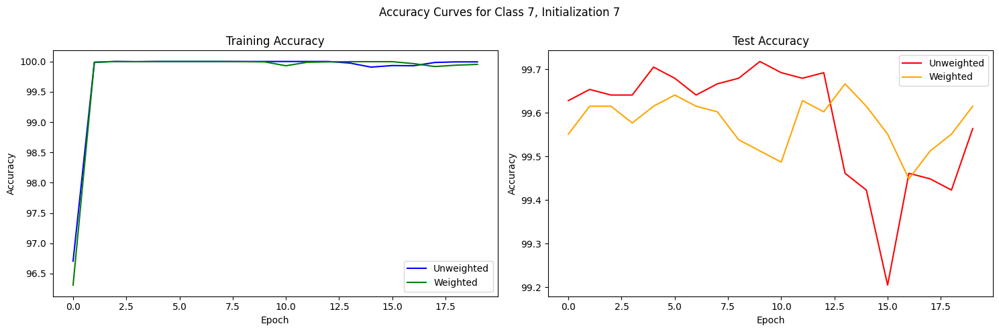

Class 7, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.96%, Test Accuracy: 99.68%, Duration: 7.00s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.69s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.06s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.04s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.51s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.24s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.06s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.97s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.57s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.84s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.16s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.86s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0020, Accuracy: 0.95%, Test Accuracy: 99.49%, Duration: 7.35s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.97s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.45%, Duration: 7.74s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.64s
Epoch 5/20, Loss: 0.0010, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.93s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.21s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.63s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.50s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.96s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.52s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.15s
Epoch 12/20, Loss: 0.0189, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.20s
Epoch 13/20, 

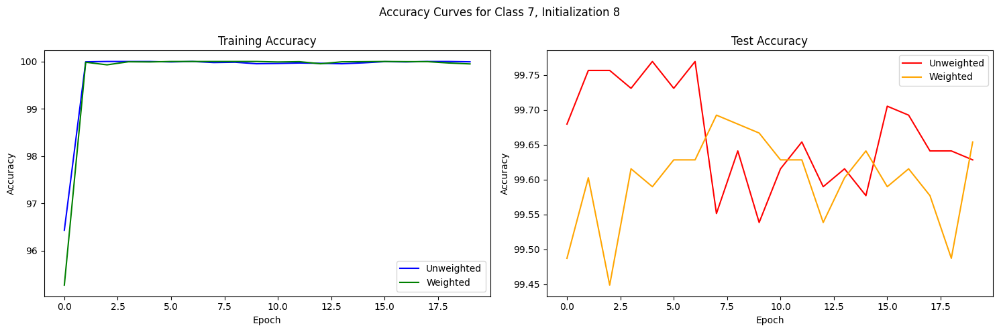

Class 7, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0016, Accuracy: 0.94%, Test Accuracy: 99.47%, Duration: 6.98s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.33s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.76s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.72s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.57s
Epoch 6/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.62s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.64s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.89s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 6.74s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 6.82s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.76s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.22s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.97%, Test Accuracy: 99.64%, Duration: 7.32s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.53s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.46s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.95s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.38s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.08s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.27s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.46s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.14s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.71s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.30s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.34s
Epoch 13/20, 

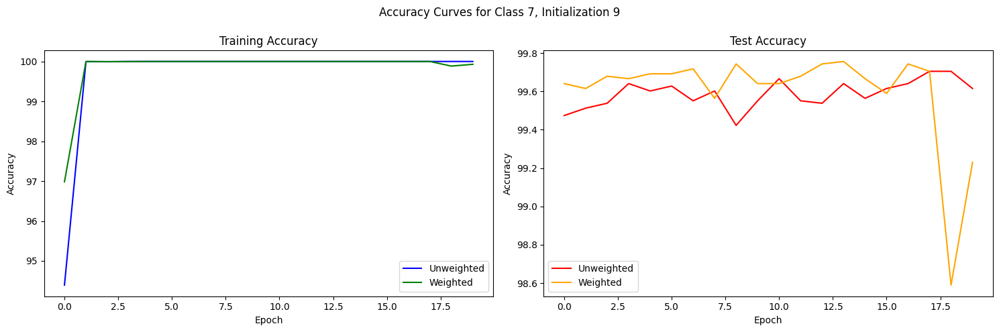

Class 7, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0039, Accuracy: 0.96%, Test Accuracy: 99.40%, Duration: 7.17s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 6.87s
Epoch 3/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 7.55s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 7.22s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.22s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.21s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.97s
Epoch 8/20, Loss: 0.0015, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.21s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 7.51s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.09s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.46s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.49s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.95%, Test Accuracy: 99.44%, Duration: 6.66s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.50%, Duration: 7.31s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.30s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.67s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.90s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.60%, Duration: 6.78s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.02s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.82s
Epoch 9/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 98.67%, Duration: 6.23s
Epoch 10/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 6.66s
Epoch 11/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.82s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.40%, Duration: 7.26s
Epoch 13/20, 

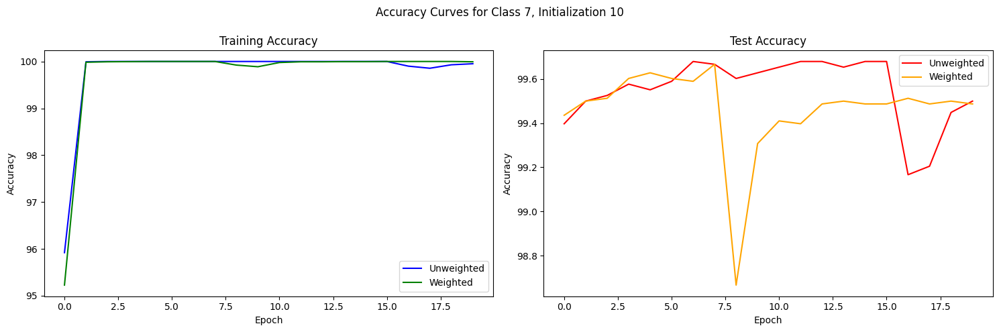

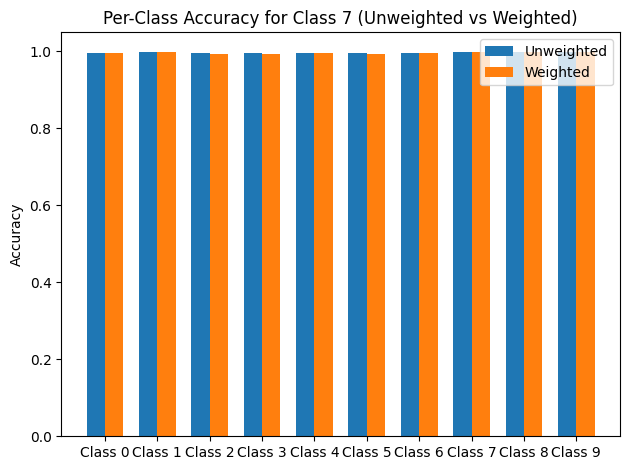

Files already downloaded and verified
Class 8, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0023, Accuracy: 0.95%, Test Accuracy: 99.92%, Duration: 6.93s
Epoch 2/20, Loss: 0.0122, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.45s
Epoch 3/20, Loss: 0.0088, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.64s
Epoch 4/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 6.81s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 6.23s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.55s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 6.68s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 6.39s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.56s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.22s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.43s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.83s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0019, Accuracy: 0.97%, Test Accuracy: 99.86%, Duration: 7.49s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.05s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.71s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.81s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.68s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.53s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.47s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.11s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.92s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.89s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 7.43s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.23s
Epoch 13/20, 

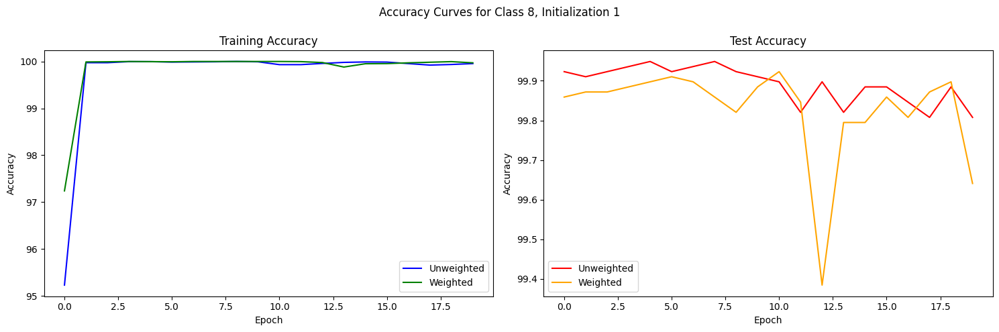

Class 8, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0077, Accuracy: 0.94%, Test Accuracy: 99.83%, Duration: 6.64s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.15s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.78s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.55s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.17s
Epoch 6/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.11s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.55s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.14s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.08s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.07s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.46s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 7.26s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0011, Accuracy: 0.94%, Test Accuracy: 99.88%, Duration: 7.21s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.79s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 7.47s
Epoch 4/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.81s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.98s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.96s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.28s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.90s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.79s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.02s
Epoch 11/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.90s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.31s
Epoch 13/20, 

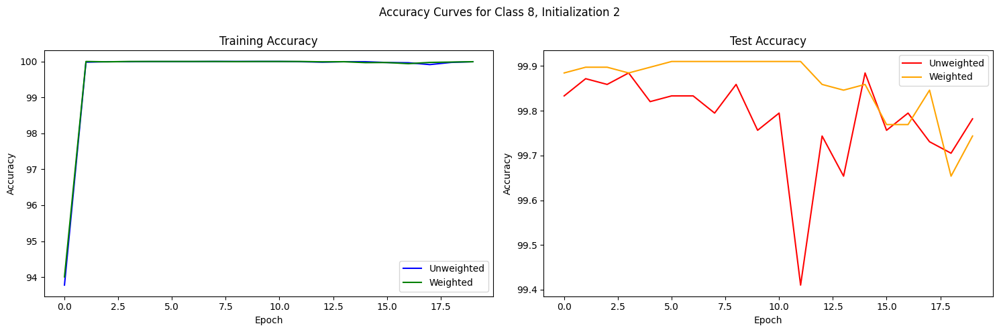

Class 8, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0005, Accuracy: 0.95%, Test Accuracy: 99.77%, Duration: 7.01s
Epoch 2/20, Loss: 1.0698, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.12s
Epoch 3/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.98s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.21s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.65s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.39s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.42s
Epoch 8/20, Loss: 0.0040, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.48s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.84s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.12s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.05s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.25s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0020, Accuracy: 0.95%, Test Accuracy: 99.68%, Duration: 7.58s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.90s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.80s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.61s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.76s
Epoch 6/20, Loss: 0.0019, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.99s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.58s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.64s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.26s
Epoch 10/20, Loss: 0.0030, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.49s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.41s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.50s
Epoch 13/20, 

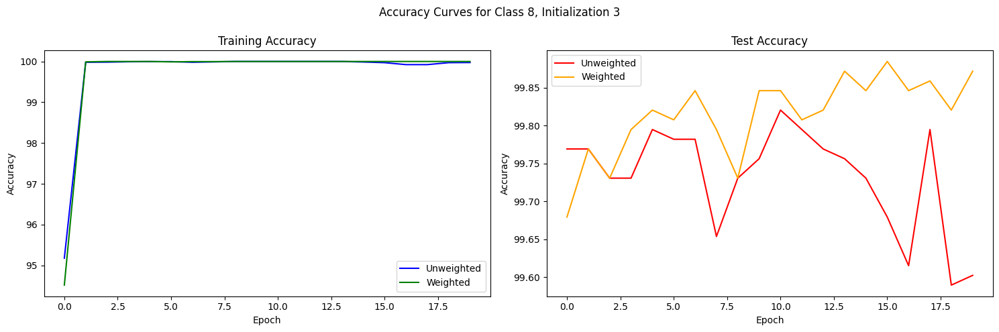

Class 8, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.97%, Test Accuracy: 99.77%, Duration: 7.21s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.57s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.26s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.32s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.70s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.55s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.12s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.29s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.82s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.21s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.18s
Epoch 12/20, Loss: 3.2221, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.40s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0003, Accuracy: 0.97%, Test Accuracy: 99.76%, Duration: 7.03s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.89s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.78s
Epoch 4/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.64s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.20s
Epoch 6/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.09s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.99s
Epoch 8/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.25s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.76s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.81s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.93s
Epoch 12/20, Loss: 0.0017, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.06s
Epoch 13/20, 

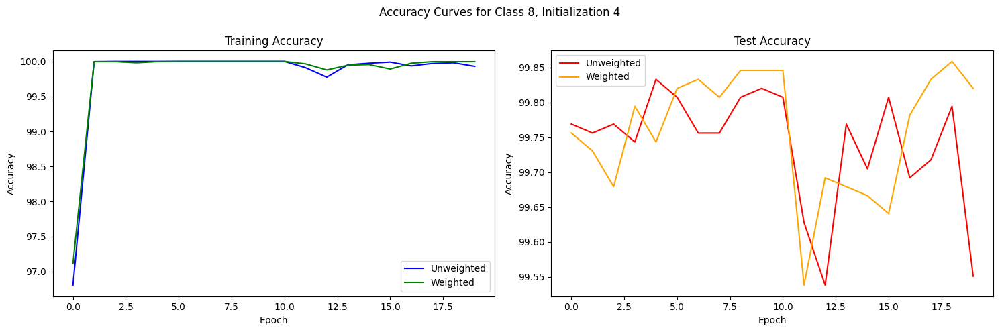

Class 8, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.96%, Test Accuracy: 99.73%, Duration: 7.37s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.84s
Epoch 3/20, Loss: 0.0055, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.81s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 6.90s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.01s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.96s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.56s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.86s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.59s
Epoch 10/20, Loss: 0.0269, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.53s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.25s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.87s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0051, Accuracy: 0.95%, Test Accuracy: 99.76%, Duration: 6.65s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.43s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.70s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.88s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.89s
Epoch 6/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.74s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.06s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.72s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.91s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 6.82s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.91s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.86s
Epoch 13/20, 

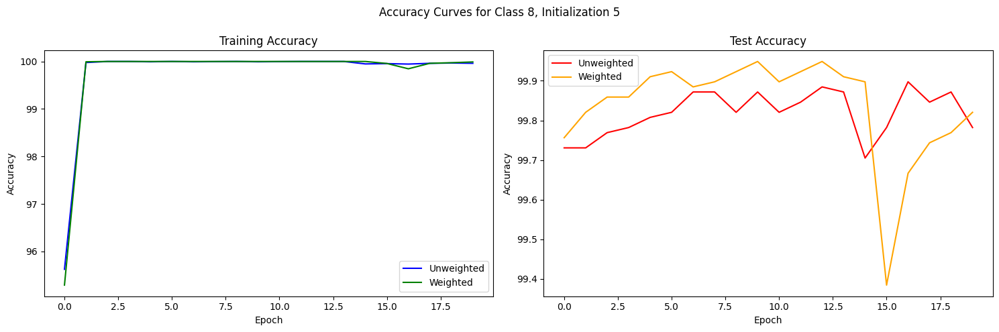

Class 8, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.95%, Test Accuracy: 99.73%, Duration: 7.25s
Epoch 2/20, Loss: 0.0190, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.12s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.40s
Epoch 4/20, Loss: 0.0126, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.74s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.66s
Epoch 6/20, Loss: 0.0145, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.17s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.40s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.42s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.35s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.48s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.10s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.14s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0007, Accuracy: 0.95%, Test Accuracy: 99.73%, Duration: 7.18s
Epoch 2/20, Loss: 0.0037, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 8.28s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.57s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.43s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.44s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.70s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.34s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.62s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.08s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.72s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.26s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.40s
Epoch 13/20, 

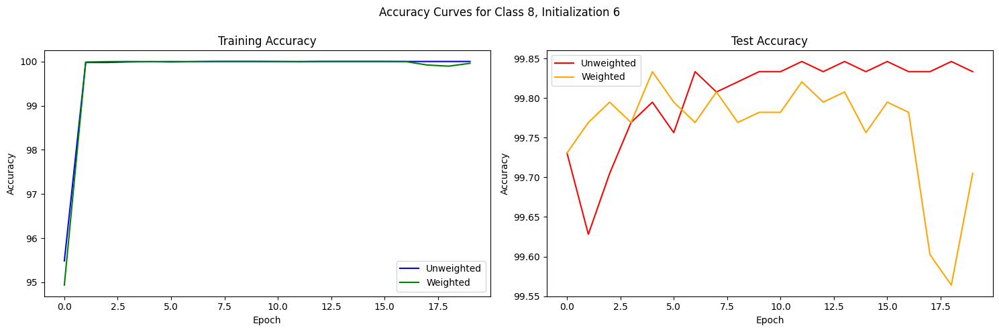

Class 8, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0015, Accuracy: 0.95%, Test Accuracy: 99.64%, Duration: 7.03s
Epoch 2/20, Loss: 0.0017, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.00s
Epoch 3/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.39s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.54s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.84s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.82s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.87s
Epoch 8/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.13s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.21s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.43s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.97s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.26s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.96%, Test Accuracy: 99.55%, Duration: 7.09s
Epoch 2/20, Loss: 0.0013, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.93s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.06s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.86s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.66s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.62s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 6.75s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.84s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.95s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.43s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.38s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.08s
Epoch 13/20, 

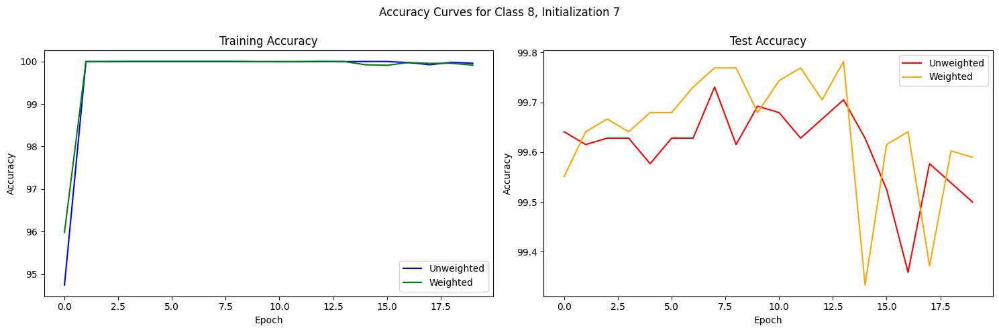

Class 8, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0006, Accuracy: 0.97%, Test Accuracy: 99.37%, Duration: 6.63s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.67s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.68s
Epoch 4/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.73s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.51s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.29%, Duration: 6.87s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.89s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.75s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.79s
Epoch 10/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.72s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 6.68s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.84s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0005, Accuracy: 0.97%, Test Accuracy: 99.49%, Duration: 6.20s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 6.41s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.27s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 6.42s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 6.46s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.62s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.41%, Duration: 6.65s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.44%, Duration: 6.99s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.67s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 6.89s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.16s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.08s
Epoch 13/20, 

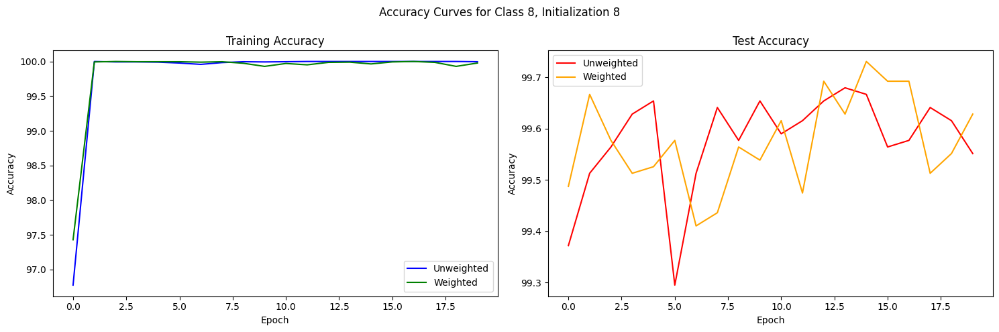

Class 8, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0018, Accuracy: 0.95%, Test Accuracy: 99.47%, Duration: 7.12s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.15s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.19s
Epoch 4/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 6.99s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.07s
Epoch 6/20, Loss: 0.0077, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 6.96s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.00s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.10s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.55s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.28s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.51s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.30s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0002, Accuracy: 0.96%, Test Accuracy: 99.64%, Duration: 7.35s
Epoch 2/20, Loss: 0.0006, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.92s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.36s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.69s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.14s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.57s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.14s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.65s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.10s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.03%, Duration: 6.80s
Epoch 11/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.19%, Duration: 7.11s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.32%, Duration: 7.35s
Epoch 13/20, 

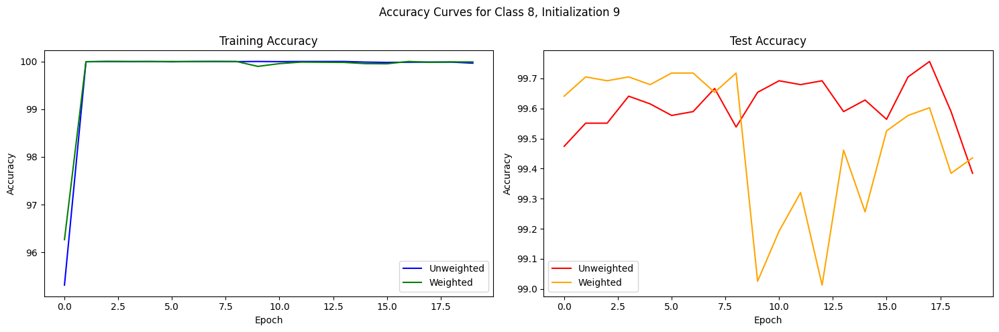

Class 8, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0005, Accuracy: 0.96%, Test Accuracy: 99.56%, Duration: 7.33s
Epoch 2/20, Loss: 0.0018, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.09s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.90s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.68s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.20s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.22s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 7.39s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.40s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.25s
Epoch 10/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 7.16s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 7.19s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.37%, Duration: 7.58s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0023, Accuracy: 0.96%, Test Accuracy: 99.45%, Duration: 7.64s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.94s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.61s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.92s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 7.90s
Epoch 6/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.51s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.71s
Epoch 8/20, Loss: 0.0098, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 8.36s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.42s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.74s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.08s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.10s
Epoch 13/20, 

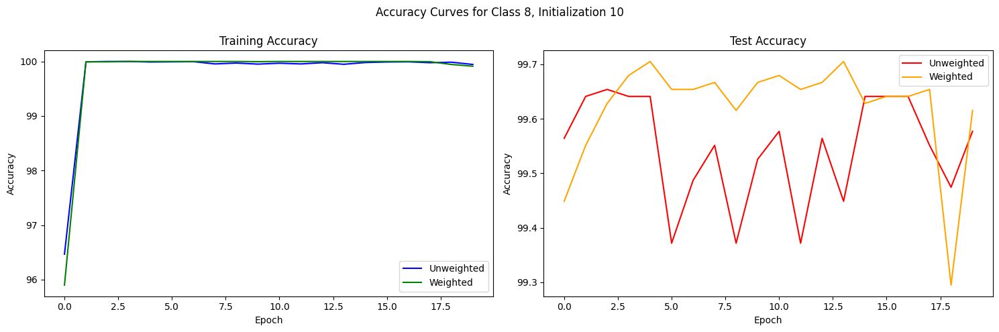

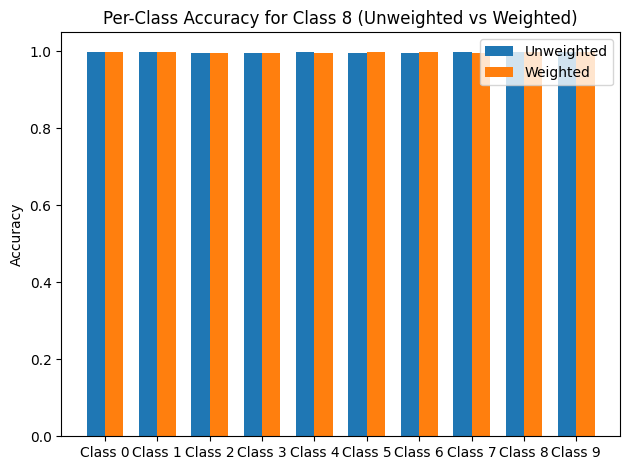

Files already downloaded and verified
Class 9, Initialization 1/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0752, Accuracy: 0.96%, Test Accuracy: 99.78%, Duration: 7.36s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.46s
Epoch 3/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.81s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.54%, Duration: 7.31s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.24s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.60s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.54s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.43s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.17s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.27s
Epoch 11/20, Loss: 0.0514, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.30s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.34s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.94%, Test Accuracy: 99.90%, Duration: 7.60s
Epoch 2/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 7.39s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.95%, Duration: 7.01s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 8.06s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 7.97s
Epoch 6/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 7.34s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.96%, Duration: 7.75s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.96%, Duration: 7.68s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.97%, Duration: 7.44s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.96%, Duration: 7.66s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.97%, Duration: 7.43s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.96%, Duration: 7.53s
Epoch 13/20, 

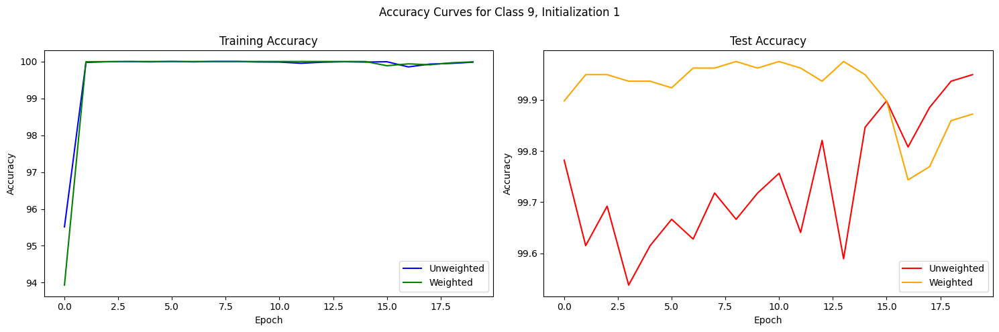

Class 9, Initialization 2/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0021, Accuracy: 0.97%, Test Accuracy: 99.81%, Duration: 7.43s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.10s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.20s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.88s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.54s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.12s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.19s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.06s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.20s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.59s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.36s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.85s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0003, Accuracy: 0.98%, Test Accuracy: 99.85%, Duration: 6.96s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.49%, Duration: 7.05s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.70s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.87s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 6.88s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.43s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.89s
Epoch 8/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.48s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.66s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 6.88s
Epoch 11/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.35s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.04s
Epoch 13/20, 

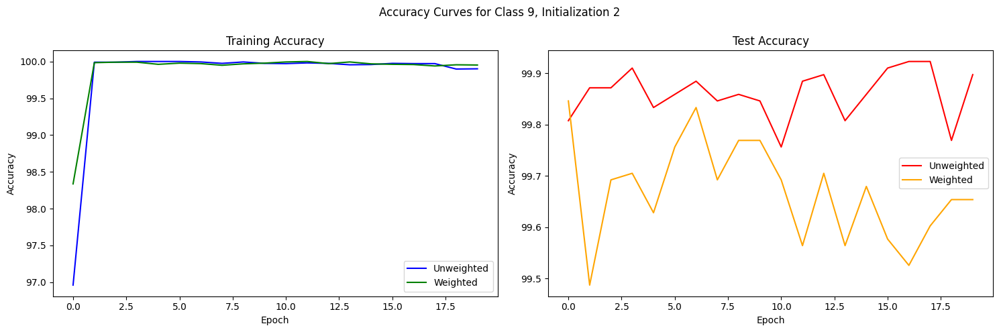

Class 9, Initialization 3/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.96%, Test Accuracy: 99.82%, Duration: 6.67s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.88s
Epoch 3/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.43s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.96s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.97s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.91s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.88s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.79s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 6.73s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.06s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 6.98s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.94%, Duration: 7.02s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0008, Accuracy: 0.93%, Test Accuracy: 99.74%, Duration: 7.11s
Epoch 2/20, Loss: 0.0009, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.29s
Epoch 3/20, Loss: 0.0012, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.13s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.34s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.98s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.52s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.97s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.18s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.10s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 7.62s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 7.03s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.27s
Epoch 13/20, 

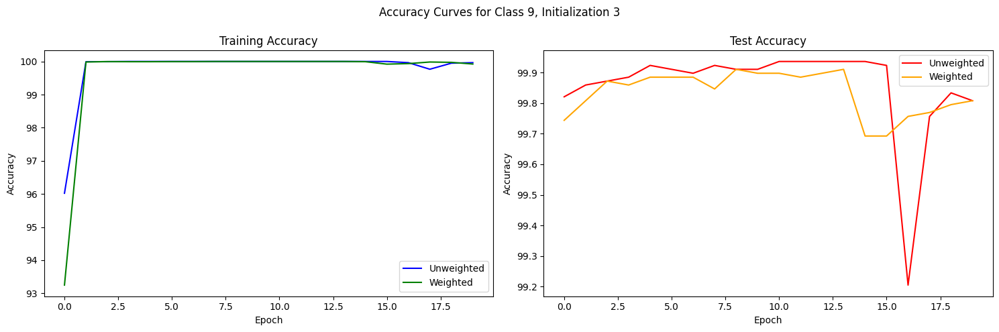

Class 9, Initialization 4/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0017, Accuracy: 0.95%, Test Accuracy: 99.82%, Duration: 6.51s
Epoch 2/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.96s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.32s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 6.75s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.97s
Epoch 6/20, Loss: 0.0029, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.95s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.30s
Epoch 8/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 7.07s
Epoch 9/20, Loss: 0.0025, Accuracy: 1.00%, Test Accuracy: 99.92%, Duration: 6.88s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.30s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.91%, Duration: 7.22s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.04s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0019, Accuracy: 0.95%, Test Accuracy: 99.77%, Duration: 7.36s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 6.89s
Epoch 3/20, Loss: 0.0005, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.38s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.09s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.10s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.41s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.57s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.25s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 6.87s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.25s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.88%, Duration: 7.10s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.89s
Epoch 13/20, 

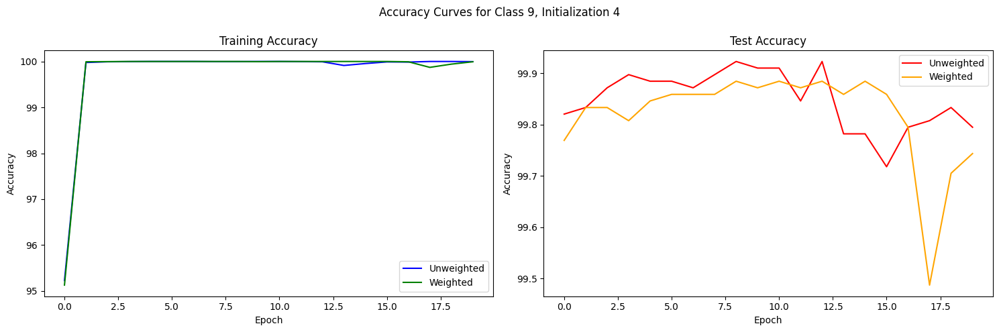

Class 9, Initialization 5/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0035, Accuracy: 0.95%, Test Accuracy: 99.79%, Duration: 7.14s
Epoch 2/20, Loss: 0.0008, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.50s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.04s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.80s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.44s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.57s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.60s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.32s
Epoch 9/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.85s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.62s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.35s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.85s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0191, Accuracy: 0.95%, Test Accuracy: 99.59%, Duration: 6.59s
Epoch 2/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.33s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.56s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 6.73s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 6.93s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 6.74s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 6.78s
Epoch 8/20, Loss: 0.0014, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.47s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.12s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 6.88s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.44s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.50s
Epoch 13/20, 

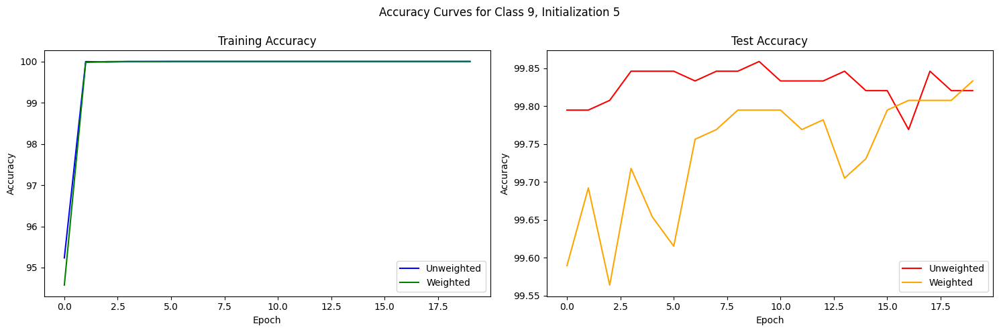

Class 9, Initialization 6/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0012, Accuracy: 0.97%, Test Accuracy: 99.69%, Duration: 7.42s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.55%, Duration: 7.73s
Epoch 3/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.63%, Duration: 7.06s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.29s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.97s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.61s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.86s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.46s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.70s
Epoch 10/20, Loss: 0.0366, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.40s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.51s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.42s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0142, Accuracy: 0.95%, Test Accuracy: 99.71%, Duration: 7.36s
Epoch 2/20, Loss: 0.0016, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 8.15s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.79s
Epoch 4/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.32s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.75s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.38s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.37s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.53s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.90s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.51s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 6.99s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.90%, Duration: 7.37s
Epoch 13/20, 

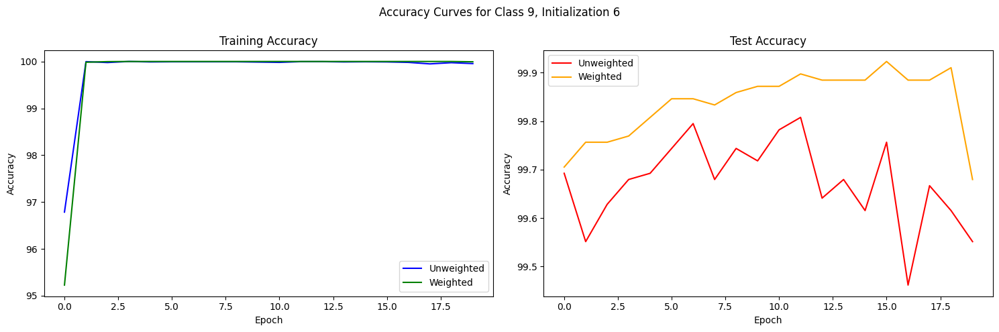

Class 9, Initialization 7/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0021, Accuracy: 0.96%, Test Accuracy: 99.74%, Duration: 8.40s
Epoch 2/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 8.55s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 8.35s
Epoch 4/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.95s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.83s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.60s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 7.72s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 8.06s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.74s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.81s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.72s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 8.27s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0011, Accuracy: 0.97%, Test Accuracy: 99.63%, Duration: 7.56s
Epoch 2/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.42s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.64s
Epoch 4/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.42s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.54s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.69s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.55s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.63s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.76s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.47s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.52s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.38s
Epoch 13/20, 

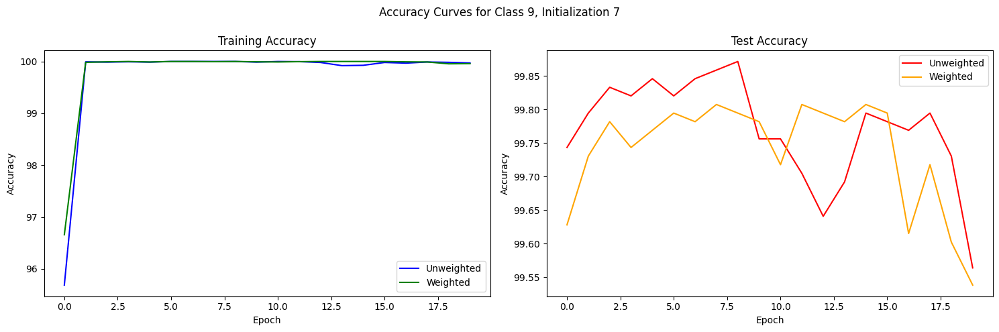

Class 9, Initialization 8/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0013, Accuracy: 0.95%, Test Accuracy: 99.69%, Duration: 7.14s
Epoch 2/20, Loss: 0.0011, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.27s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.49s
Epoch 4/20, Loss: 0.0115, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.02s
Epoch 5/20, Loss: 0.0004, Accuracy: 1.00%, Test Accuracy: 99.71%, Duration: 6.87s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 7.21s
Epoch 7/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.03s
Epoch 8/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.53%, Duration: 7.09s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 6.82s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.15s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.29s
Epoch 12/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.62%, Duration: 7.32s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0017, Accuracy: 0.96%, Test Accuracy: 99.83%, Duration: 7.08s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.39s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.97s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.14s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.85%, Duration: 6.66s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 6.58s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.86%, Duration: 7.26s
Epoch 8/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.83%, Duration: 7.37s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.87%, Duration: 7.16s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 6.79s
Epoch 11/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.31%, Duration: 7.12s
Epoch 12/20, Loss: 0.0199, Accuracy: 1.00%, Test Accuracy: 99.47%, Duration: 7.95s
Epoch 13/20, 

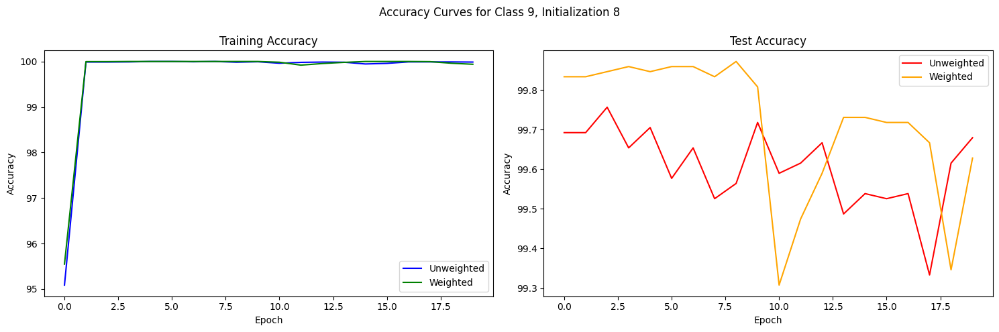

Class 9, Initialization 9/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0015, Accuracy: 0.95%, Test Accuracy: 99.54%, Duration: 7.51s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 6.69s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.28s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.40s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.46s
Epoch 6/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.00s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 7.00s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 6.84s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.09s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.58%, Duration: 7.06s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.56%, Duration: 7.17s
Epoch 12/20, Loss: 0.0227, Accuracy: 1.00%, Test Accuracy: 99.64%, Duration: 7.11s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.96%, Test Accuracy: 99.69%, Duration: 7.26s
Epoch 2/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.11s
Epoch 3/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.77%, Duration: 7.34s
Epoch 4/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.46s
Epoch 5/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.78s
Epoch 6/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.02s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.51s
Epoch 8/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.42s
Epoch 9/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.51%, Duration: 7.87s
Epoch 10/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.42s
Epoch 11/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.67s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 7.18s
Epoch 13/20, 

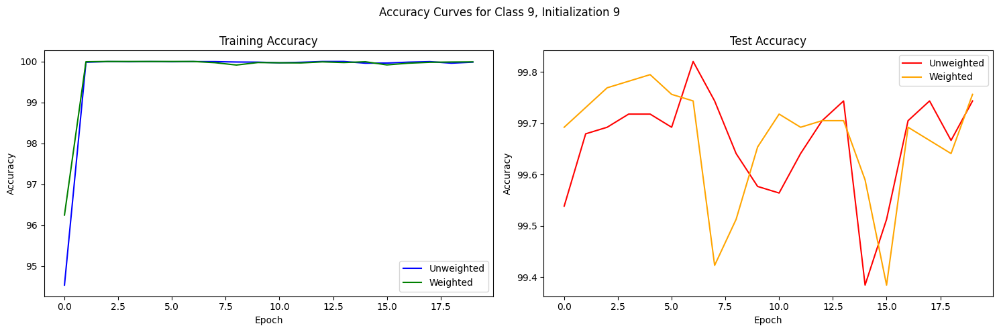

Class 9, Initialization 10/10


Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0009, Accuracy: 0.97%, Test Accuracy: 99.74%, Duration: 7.30s
Epoch 2/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.67s
Epoch 3/20, Loss: 0.0002, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.44s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.31s
Epoch 5/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.72%, Duration: 7.50s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.57s
Epoch 7/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.35s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.47s
Epoch 9/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.78%, Duration: 7.63s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.82%, Duration: 6.98s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.81%, Duration: 7.46s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.73%, Duration: 7.77s
Epoch 13/20, 

Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.0010, Accuracy: 0.95%, Test Accuracy: 99.59%, Duration: 7.29s
Epoch 2/20, Loss: 0.0007, Accuracy: 1.00%, Test Accuracy: 99.59%, Duration: 7.63s
Epoch 3/20, Loss: 0.0003, Accuracy: 1.00%, Test Accuracy: 99.76%, Duration: 7.21s
Epoch 4/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.55s
Epoch 5/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.42%, Duration: 7.18s
Epoch 6/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.79%, Duration: 7.92s
Epoch 7/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.75s
Epoch 8/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.65%, Duration: 7.15s
Epoch 9/20, Loss: 0.0001, Accuracy: 1.00%, Test Accuracy: 99.69%, Duration: 6.93s
Epoch 10/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.67%, Duration: 7.25s
Epoch 11/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.74%, Duration: 7.18s
Epoch 12/20, Loss: 0.0000, Accuracy: 1.00%, Test Accuracy: 99.68%, Duration: 7.23s
Epoch 13/20, 

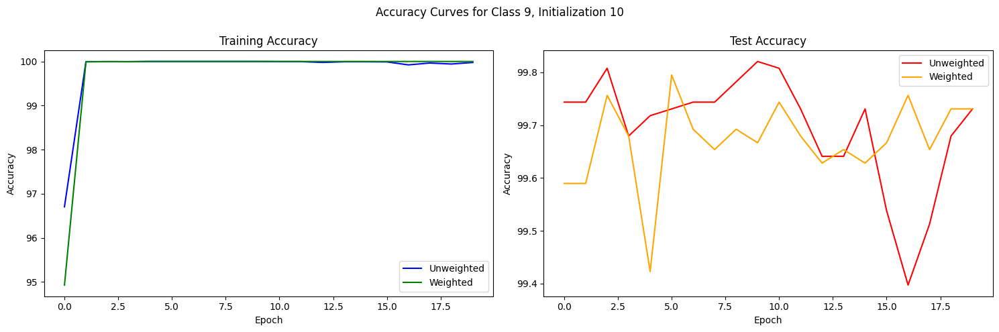

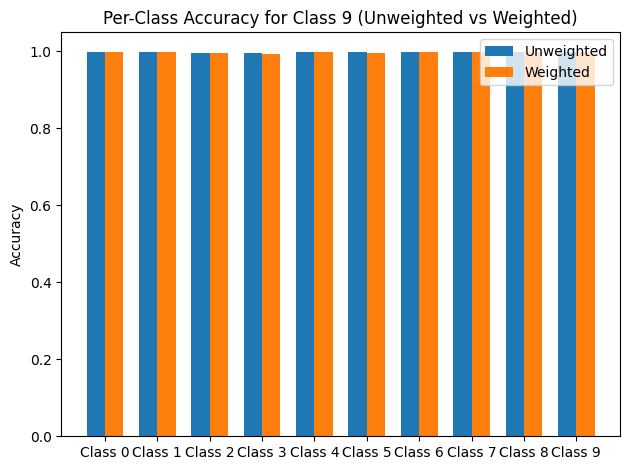

In [15]:
# Step 5 Train on Imbalanced dataset 

# Storage for final analysis
all_overall_test_accuracies_unweighted = []
all_overall_test_accuracies_weighted = []
all_per_class_accuracies_unweighted = []
all_per_class_accuracies_weighted = []

for class_to_augment in range(10):  # Iterate over each class to augment
    # Load the imbalanced dataset loaders
    train_loader, test_loader = load_cifar10_balanced_or_imbalanced(
        batch_size=128,
        n_elements_per_class=n_elements_per_class,
        class_to_augment=class_to_augment,  # augmenting current class
        augmented_size=6000,
        other_size=3777,
        download=True,  # Set this to False if you've already downloaded the dataset
        train_ratio=0.8  # 80% of data for training
    )
    
    # Compute class weights for the imbalanced dataset
    targets = [y for _, y in train_loader.dataset]
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(targets),
        y=targets
    )
    class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
    
    # Initialize the loss functions
    criterion_unweighted = nn.CrossEntropyLoss()
    criterion_weighted = nn.CrossEntropyLoss(weight=class_weights)

    # Lists to hold accuracies for each initialization
    init_test_accuracies_unweighted = []
    init_test_accuracies_weighted = []
    init_per_class_accuracies_unweighted = []
    init_per_class_accuracies_weighted = []
    for init in range(num_initializations):  # Train ten models for this dataset
        print(f"Class {class_to_augment}, Initialization {init + 1}/{num_initializations}")
        
        # Reinitialize the model's weights and optimizer
        model.apply(reset_weights)
        optimizer = optim.Adam(model.parameters())

        # Train with unweighted loss
        train_accuracies_unweighted, test_accuracies_unweighted = train_model(
            model, train_loader, test_loader, criterion_unweighted, optimizer, num_epochs, device=device
        )
        _, per_class_accuracy_unweighted, _, _ = evaluate_model(model, test_loader, device)
        init_test_accuracies_unweighted.append(test_accuracies_unweighted)
        init_per_class_accuracies_unweighted.append(per_class_accuracy_unweighted)

        # Reinitialize the model's weights and optimizer
        model.apply(reset_weights)
        optimizer = optim.Adam(model.parameters())

        # Train with weighted loss
        train_accuracies_weighted, test_accuracies_weighted = train_model(
            model, train_loader, test_loader, criterion_weighted, optimizer, num_epochs, device=device
        )
        _, per_class_accuracy_weighted, _, _ = evaluate_model(model, test_loader, device)
        init_test_accuracies_weighted.append(test_accuracies_weighted)
        init_per_class_accuracies_weighted.append(per_class_accuracy_weighted)

        # Set up the plot for training and testing accuracy side by side
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Plot the training accuracy curve for unweighted and weighted loss
        axes[0].plot(train_accuracies_unweighted, label='Unweighted', color='blue')
        axes[0].plot(train_accuracies_weighted, label='Weighted', color='green')
        axes[0].set_title('Training Accuracy')
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy')
        axes[0].legend()
        
        # Plot the test accuracy curve for unweighted and weighted loss
        axes[1].plot(test_accuracies_unweighted, label='Unweighted', color='red')
        axes[1].plot(test_accuracies_weighted, label='Weighted', color='orange')
        axes[1].set_title('Test Accuracy')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Accuracy')
        axes[1].legend()

        # Adjust the layout so that plots don't overlap with each other
        plt.tight_layout()
        plt.suptitle(f'Accuracy Curves for Class {class_to_augment}, Initialization {init + 1}')
        # This moves the title up slightly to avoid overlap with the subplots
        plt.subplots_adjust(top=0.85)
        plt.show()
    
    # After all initializations, average the accuracies
    avg_test_accuracy_unweighted = np.mean(init_test_accuracies_unweighted)
    avg_test_accuracy_weighted = np.mean(init_test_accuracies_weighted)
    avg_per_class_accuracies_unweighted = np.mean(init_per_class_accuracies_unweighted, axis=0)
    avg_per_class_accuracies_weighted = np.mean(init_per_class_accuracies_weighted, axis=0)

    # Store for final analysis
    all_overall_test_accuracies_unweighted.append(avg_test_accuracy_unweighted)
    all_overall_test_accuracies_weighted.append(avg_test_accuracy_weighted)
    all_per_class_accuracies_unweighted.append(avg_per_class_accuracies_unweighted)
    all_per_class_accuracies_weighted.append(avg_per_class_accuracies_weighted)

    # Plot per-class accuracies for unweighted vs weighted for the current class
    x = np.arange(10)  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, avg_per_class_accuracies_unweighted, width, label='Unweighted')
    rects2 = ax.bar(x + width/2, avg_per_class_accuracies_weighted, width, label='Weighted')

    # Add some text for labels, title, and custom x-axis tick labels, etc.
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Per-Class Accuracy for Class {class_to_augment} (Unweighted vs Weighted)')
    ax.set_xticks(x)
    ax.set_xticklabels([f'Class {i}' for i in range(10)])
    ax.legend()

    fig.tight_layout()
    plt.show()

    # Free up memory
    torch.cuda.empty_cache()

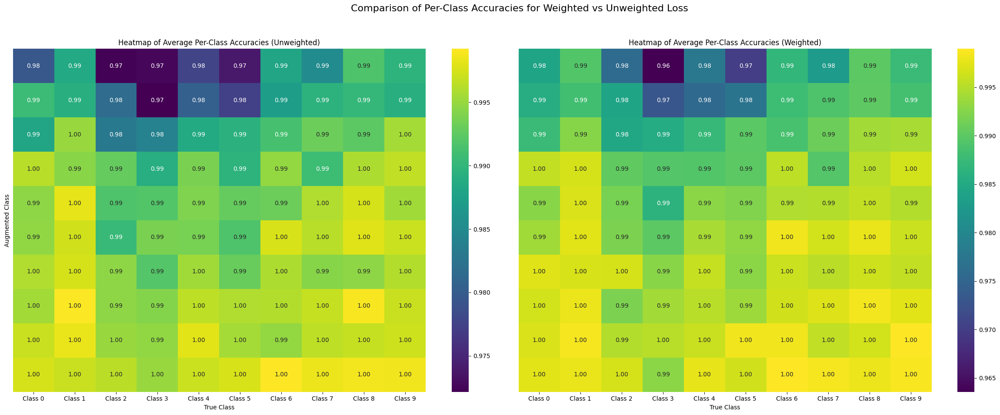

In [18]:
# Convert the lists of per-class accuracies to NumPy arrays for easier manipulation
unweighted_accuracies_array = np.array(all_per_class_accuracies_unweighted)
weighted_accuracies_array = np.array(all_per_class_accuracies_weighted)

# Set up the matplotlib figure
fig, axes = plt.subplots(1, 2, figsize=(24, 10), sharey=True)

# Heatmap for unweighted accuracies
sns.heatmap(unweighted_accuracies_array, annot=True, cmap='viridis', fmt='.2f',
            ax=axes[0], cbar=True, xticklabels=[f'Class {i}' for i in range(10)],
            yticklabels=[f'Class {i}' for i in range(10)])
axes[0].set_title('Heatmap of Average Per-Class Accuracies (Unweighted)')
axes[0].set_xlabel('True Class')
axes[0].set_ylabel('Augmented Class')

# Heatmap for weighted accuracies
sns.heatmap(weighted_accuracies_array, annot=True, cmap='viridis', fmt='.2f',
            ax=axes[1], cbar=True, xticklabels=[f'Class {i}' for i in range(10)],
            yticklabels=[])
axes[1].set_title('Heatmap of Average Per-Class Accuracies (Weighted)')
axes[1].set_xlabel('True Class')
# axes[1].set_ylabel('Augmented Class')  # Not needed as it shares the y-axis with the first plot

plt.suptitle('Comparison of Per-Class Accuracies for Weighted vs Unweighted Loss', size=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the padding to leave space for the suptitle
plt.show()
